# Mérési notebook
---
# **4. mérési fázis**. Saját modellek fejlesztése.

#### **Cél**: Modellek tesztelése saját adathalmazon, majd saját modell ötletek tesztelése
#### **Diplomamunka címe**: Fotográfiai témafelismerés neurális hálózatokkal nagy adathalmazon.
#### **Készítette**: Sándor Balázs - AZA6NL

## 3. lépés: saját modellek iteratív tanítása és  tesztelése.

---

Saját modell tesztelése. ResNet18 modern fejrésszel.

(3 különböző fejrész tesztelése a cél)

✅ 0. Telepítés és beállítások

✅ 1. Drive csatolás + ZIP kicsomagolás

In [ ]:
# 🧰 Alapcsomagok
!pip install -q timm scikit-learn scikit-plot

# 🖼️ matplotlib + seaborn (ha valami hiányzik)
!pip install -q matplotlib seaborn

# 📁 Google Drive csatolása
from google.colab import drive
drive.mount('/content/drive')

# 📦 Kitömörítés, ha szükséges
import zipfile, os

diploma_path = "/content/drive/MyDrive/diplomamunka"
dataset_zip = os.path.join(diploma_path, "imagenet_splitted_db.zip")
dataset_dir = "/content/imagenet_splitted_db"

if not os.path.exists(dataset_dir):
    with zipfile.ZipFile(dataset_zip, 'r') as zip_ref:
        zip_ref.extractall("/content")
    print("✅ Kicsomagolva:", dataset_dir)
else:
    print("✅ Már ki van csomagolva:", dataset_dir)

# ⚙️ GPU ellenőrzés
import torch
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"📡 Aktív eszköz: {device}")


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 122.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 96.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 57.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 41.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 19.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 105.3 MB/s eta 0:00:00
Mounted at /content/drive
✅ Kicsomagolva: /content/imagenet_splitted_db
📡 Aktív eszköz: cuda


🧠 2. ResNet18 modell betöltése

In [ ]:
import torch
import torch.nn as nn
from torchvision import models
from copy import deepcopy

# Eszköz beállítása
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Előre betanított ResNet18 letöltése ImageNet1k súlyokkal
resnet18_base = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)

# Általános paraméterek
num_classes = 114
in_features = resnet18_base.fc.in_features  # 512 a ResNet18 esetén


Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 80.3MB/s]


🧪 3. Három különböző osztályozó fej definiálása

In [ ]:
# Baseline fej: gyors, stabil tanulás
baseline_head = nn.Sequential(
    nn.Linear(in_features, 256),
    nn.ReLU(),
    nn.Dropout(0.3),
    nn.Linear(256, num_classes)
)

# Deep fej: mélyebb FC architektúra
deep_head = nn.Sequential(
    nn.Linear(in_features, 512),
    nn.ReLU(),
    nn.Dropout(0.3),
    nn.Linear(512, 256),
    nn.ReLU(),
    nn.Dropout(0.3),
    nn.Linear(256, num_classes)
)

# Hybrid fej: külön osztályban definiáljuk
class ResNet18HybridHead(nn.Module):
    def __init__(self, num_classes=114):
        super().__init__()
        self.backbone = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)
        self.backbone.avgpool = nn.Identity()
        self.backbone.fc = nn.Identity()

        self.head = nn.Sequential(
            nn.Conv2d(512, 256, kernel_size=1),
            nn.AdaptiveAvgPool2d((1, 1)),     # ez került előre!
            nn.LayerNorm([256, 1, 1]),
            nn.GELU(),
            nn.Flatten(),
            nn.Linear(256, num_classes)
        )

    def forward(self, x):
        x = self.backbone.conv1(x)
        x = self.backbone.bn1(x)
        x = self.backbone.relu(x)
        x = self.backbone.maxpool(x)

        x = self.backbone.layer1(x)
        x = self.backbone.layer2(x)
        x = self.backbone.layer3(x)
        x = self.backbone.layer4(x)

        return self.head(x)

🔍 4. A három teljes modell példányosítása

In [ ]:
# 1. Baseline modell
resnet18_baseline = deepcopy(resnet18_base)
resnet18_baseline.fc = baseline_head
resnet18_baseline = resnet18_baseline.to(device)

# 2. Deep modell
resnet18_deep = deepcopy(resnet18_base)
resnet18_deep.fc = deep_head
resnet18_deep = resnet18_deep.to(device)

# 3. Hybrid modell – teljes saját forward metódussal
resnet18_hybrid = ResNet18HybridHead(num_classes=num_classes)
resnet18_hybrid = resnet18_hybrid.to(device)


🧠 5. A tanító föggvény

In [ ]:
# --- 📦 Könyvtárak ---
import os
import random
from collections import defaultdict
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, Subset

# --- ⚙️ Alapbeállítások ---
root_dir = "/content/imagenet_splitted_db"
batch_size = 64
image_size = 224
subset_sizes = [1000, 5000, 10000, 25000]

# --- 🧪 Transzformációk ---
transform = transforms.Compose([
    transforms.Resize((image_size, image_size)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],  # ImageNet statisztikák
                         std=[0.229, 0.224, 0.225])
])

# --- 📚 Datasetek betöltése ---
train_dataset_full = datasets.ImageFolder(os.path.join(root_dir, "train"), transform=transform)
val_dataset         = datasets.ImageFolder(os.path.join(root_dir, "val"), transform=transform)
test_dataset        = datasets.ImageFolder(os.path.join(root_dir, "test"), transform=transform)

# --- 🧪 Stratifikált részhalmaz létrehozó függvény ---
def stratified_subset(dataset, total_images):
    class_indices = defaultdict(list)
    for idx, (_, label) in enumerate(dataset.samples):
        class_indices[label].append(idx)

    total_classes = len(class_indices)
    per_class = total_images // total_classes
    selected_indices = []

    for cls, indices in class_indices.items():
        selected = random.sample(indices, min(per_class, len(indices)))
        selected_indices.extend(selected)

    print(f"📦 Részhalmaz méret: {len(selected_indices)} kép")
    return Subset(dataset, selected_indices)

# --- 🧪 Részhalmazok generálása ---
train_subsets = {f"{size}": stratified_subset(train_dataset_full, size) for size in subset_sizes}

# --- 🚚 Adatbetöltők ---
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=2, pin_memory=True)

# --- 📌 Osztálynevek és osztályszám ---
class_names = train_dataset_full.classes
num_classes = len(class_names)
print(f"📊 Osztályok száma: {num_classes}")


📦 Részhalmaz méret: 912 kép
📦 Részhalmaz méret: 4902 kép
📦 Részhalmaz méret: 9918 kép
📦 Részhalmaz méret: 24966 kép
📊 Osztályok száma: 114


In [ ]:
from torch.utils.data import DataLoader
import torch.nn as nn
import torch
import matplotlib.pyplot as plt
from tqdm import tqdm

def train_model_on_subset(model, model_name, train_dataset_subset, num_epochs=10, plot_results=True):
    """
    Modell tanítása egy adott részhalmazon.
    A modell, a modell neve és a részhalmaz külön adható meg.
    """
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
    criterion = nn.CrossEntropyLoss()

    # 🔁 Betöltő a részhalmazra
    train_loader = DataLoader(train_dataset_subset, batch_size=64, shuffle=True, num_workers=2, pin_memory=True)

    train_loss_hist, val_loss_hist = [], []
    train_acc_hist, val_acc_hist = [], []

    for epoch in range(num_epochs):
        model.train()
        running_loss, correct, total = 0.0, 0, 0

        for inputs, labels in tqdm(train_loader, desc=f"[{model_name}] Epoch {epoch+1}/{num_epochs} - train"):
            inputs, labels = inputs.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * inputs.size(0)
            _, preds = torch.max(outputs, 1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

        train_loss = running_loss / total
        train_acc = correct / total
        train_loss_hist.append(train_loss)
        train_acc_hist.append(train_acc)

        # --- 🔎 Validáció ---
        model.eval()
        val_loss, correct, total = 0.0, 0, 0
        with torch.no_grad():
            for inputs, labels in tqdm(val_loader, desc=f"[{model_name}] Epoch {epoch+1}/{num_epochs} - val"):
                inputs, labels = inputs.to(device), labels.to(device)
                outputs = model(inputs)
                loss = criterion(outputs, labels)

                val_loss += loss.item() * inputs.size(0)
                _, preds = torch.max(outputs, 1)
                correct += (preds == labels).sum().item()
                total += labels.size(0)

        val_loss /= total
        val_acc = correct / total
        val_loss_hist.append(val_loss)
        val_acc_hist.append(val_acc)

        print(f"📊 [{model_name}] Epoch {epoch+1}: Train loss={train_loss:.4f}, acc={train_acc:.4f} | Val loss={val_loss:.4f}, acc={val_acc:.4f}")

    # --- 🎨 Tanulási görbék ---
    if plot_results:
        plt.figure(figsize=(12, 4))

        # Loss
        plt.subplot(1, 2, 1)
        plt.plot(train_loss_hist, label="Train Loss")
        plt.plot(val_loss_hist, label="Val Loss")
        plt.title(f"{model_name} – Loss")
        plt.xlabel("Epoch")
        plt.ylabel("Loss")
        plt.legend()
        plt.grid(True)

        # Accuracy
        plt.subplot(1, 2, 2)
        plt.plot(train_acc_hist, label="Train Acc")
        plt.plot(val_acc_hist, label="Val Acc")
        plt.title(f"{model_name} – Accuracy")
        plt.xlabel("Epoch")
        plt.ylabel("Accuracy")
        plt.legend()
        plt.grid(True)

        plt.tight_layout()
        plt.show()

    return model, train_loss_hist, val_loss_hist, train_acc_hist, val_acc_hist


🧠 6. TANÍTÁS

🧠 6.0 Getter függvények új modellekhez:

In [ ]:
def get_resnet18_baseline():
    base = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)
    in_features = base.fc.in_features
    baseline_head = nn.Sequential(
        nn.Linear(in_features, 256),
        nn.ReLU(),
        nn.Dropout(0.3),
        nn.Linear(256, num_classes)
    )
    base.fc = baseline_head
    return base.to(device)

def get_resnet18_deep():
    base = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)
    in_features = base.fc.in_features
    deep_head = nn.Sequential(
        nn.Linear(in_features, 512),
        nn.ReLU(),
        nn.Dropout(0.3),
        nn.Linear(512, 256),
        nn.ReLU(),
        nn.Dropout(0.3),
        nn.Linear(256, num_classes)
    )
    base.fc = deep_head
    return base.to(device)


def get_resnet18_hybrid():
    class ResNet18HybridHead(nn.Module):
        def __init__(self, num_classes=114):
            super().__init__()
            self.backbone = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)
            self.backbone.avgpool = nn.Identity()
            self.backbone.fc = nn.Identity()

            self.head = nn.Sequential(
                nn.Conv2d(512, 256, kernel_size=1),
                nn.AdaptiveAvgPool2d((1, 1)),
                nn.LayerNorm([256, 1, 1]),
                nn.GELU(),
                nn.Flatten(),
                nn.Linear(256, num_classes)
            )

        def forward(self, x):
            x = self.backbone.conv1(x)
            x = self.backbone.bn1(x)
            x = self.backbone.relu(x)
            x = self.backbone.maxpool(x)

            x = self.backbone.layer1(x)
            x = self.backbone.layer2(x)
            x = self.backbone.layer3(x)
            x = self.backbone.layer4(x)

            return self.head(x)

    return ResNet18HybridHead(num_classes=num_classes).to(device)

✅ 6.0 Tesztelések előkészítése

In [ ]:
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
import numpy as np
from tqdm import tqdm
import time

# 🔄 Transzformációk (ugyanaz, mint eddig)
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225])
])

# 📁 Teszthalmaz betöltése
test_dir = "/content/imagenet_splitted_db/test"
test_dataset = ImageFolder(test_dir, transform=transform)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False, num_workers=2)

# ✅ Használt osztályok (fontos a mapping-hez)
class_names = test_dataset.classes
num_classes = len(class_names)

✅ 6.0 mérések előkészítése

In [ ]:
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    top_k_accuracy_score, confusion_matrix, classification_report
)

def evaluate_metrics(y_true, y_pred, y_probs, model_name, inference_time):
    top1 = accuracy_score(y_true, y_pred)
    top5 = top_k_accuracy_score(y_true, y_probs, k=5, labels=range(len(class_names)))
    precision = precision_score(y_true, y_pred, average='macro', zero_division=0)
    recall = recall_score(y_true, y_pred, average='macro', zero_division=0)
    f1 = f1_score(y_true, y_pred, average='macro', zero_division=0)

    print(f"\n🔍 Vizsgálat eredményei ({model_name}):")
    print(f"✅ Top-1 Accuracy:  {top1:.4f}")
    print(f"✅ Top-5 Accuracy:  {top5:.4f}")
    print(f"🎯 Precision:       {precision:.4f}")
    print(f"🎯 Recall:          {recall:.4f}")
    print(f"🎯 F1-score:        {f1:.4f}")
    print(f"⏱️ Inference time:  {inference_time:.2f} sec")

    return {
        "top1": top1,
        "top5": top5,
        "precision": precision,
        "recall": recall,
        "f1": f1,
        "time": inference_time
    }

✅ 6.0 2 féle confusion matrix előkészítése

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_confusion_matrix(y_true, y_pred, labels, title):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, cmap="Blues", xticklabels=labels, yticklabels=labels, cbar=True)
    plt.title(title)
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.xticks(rotation=90)
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()

import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

def plot_confusion_matrix_pretty(y_true, y_pred, class_names, title="Confusion Matrix", show=True, small=False):
    """
    Szépített Confusion Matrix.
    - show=False esetén subplotba ágyazható
    - small=True esetén eltünteti a címkéket és kisebb betűket használ
    """
    cm = confusion_matrix(y_true, y_pred, normalize='true')

    if show:
        figsize = (12, 10) if small else (18, 16)
        plt.figure(figsize=figsize)

    sns.heatmap(
        cm,
        annot=False,
        cmap='Blues',
        cbar=True,
        xticklabels=class_names if not small else False,
        yticklabels=class_names if not small else False
    )

    plt.title(title, fontsize=12 if small else 18)
    if not small:
        plt.xlabel('Predicted Label', fontsize=14)
        plt.ylabel('True Label', fontsize=14)
        plt.xticks(rotation=90, fontsize=8)
        plt.yticks(fontsize=8)
    else:
        plt.xlabel("")
        plt.ylabel("")
        plt.xticks([])
        plt.yticks([])

    if show:
        plt.tight_layout()
        plt.show()

 ✅ 6.0 Részletes osztályonkénti metrikák (Precision / Recall / F1) és CSV export előkészítése

 Az alábbi kód mindhárom saját ResNet18 alapú modellre elkészíti:
- osztályonkénti precízió, recall, F1-score értékeket
- képernyőre írja a részletes jelentést
- CSV-fájlba menti jól azonosítható névvel

🛠️ Közös függvény

In [ ]:
import pandas as pd
from sklearn.metrics import classification_report

def export_classification_report(y_true, y_pred, class_names, csv_filename):
    report_dict = classification_report(
        y_true, y_pred, target_names=class_names, output_dict=True, zero_division=0
    )
    df = pd.DataFrame(report_dict).transpose()
    df.to_csv(csv_filename, index=True)
    print(f"\n📄 Exportálva: {csv_filename}")
    return df

✅ 6.0 Legrosszabb osztályok statisztika előkészítése

In [ ]:
def print_worst_classes(df, model_name, top_n=10):
    df_filtered = df.iloc[:-3]  # support, accuracy, macro avg sorokat elhagyjuk
    worst = df_filtered.sort_values("f1-score").head(top_n)
    print(f"\n📉 {model_name} – Top {top_n} leggyengébb osztály (F1-score alapján):\n")
    display(worst[["precision", "recall", "f1-score"]])

📊 6.1 Resnet 18 + Baseline head 1k learning


---



[ResNet18-Baseline-1k] Epoch 1/10 - val: 100%|██████████| 282/282 [00:15<00:00, 17.77it/s]


📊 [ResNet18-Baseline-1k] Epoch 1: Train loss=4.7335, acc=0.0285 | Val loss=4.6025, acc=0.0582


[ResNet18-Baseline-1k] Epoch 2/10 - val: 100%|██████████| 282/282 [00:15<00:00, 17.94it/s]


📊 [ResNet18-Baseline-1k] Epoch 2: Train loss=4.3292, acc=0.1765 | Val loss=4.4997, acc=0.0968


[ResNet18-Baseline-1k] Epoch 3/10 - val: 100%|██████████| 282/282 [00:15<00:00, 18.10it/s]


📊 [ResNet18-Baseline-1k] Epoch 3: Train loss=4.0160, acc=0.3542 | Val loss=4.3818, acc=0.1328


[ResNet18-Baseline-1k] Epoch 4/10 - val: 100%|██████████| 282/282 [00:15<00:00, 17.82it/s]


📊 [ResNet18-Baseline-1k] Epoch 4: Train loss=3.6387, acc=0.4857 | Val loss=4.2296, acc=0.1639


[ResNet18-Baseline-1k] Epoch 5/10 - val: 100%|██████████| 282/282 [00:15<00:00, 17.63it/s]


📊 [ResNet18-Baseline-1k] Epoch 5: Train loss=3.2705, acc=0.6316 | Val loss=4.0981, acc=0.1829


[ResNet18-Baseline-1k] Epoch 6/10 - val: 100%|██████████| 282/282 [00:16<00:00, 17.44it/s]


📊 [ResNet18-Baseline-1k] Epoch 6: Train loss=2.8932, acc=0.7390 | Val loss=3.9276, acc=0.2349


[ResNet18-Baseline-1k] Epoch 7/10 - val: 100%|██████████| 282/282 [00:15<00:00, 17.73it/s]


📊 [ResNet18-Baseline-1k] Epoch 7: Train loss=2.5008, acc=0.8136 | Val loss=3.8676, acc=0.2197


[ResNet18-Baseline-1k] Epoch 8/10 - val: 100%|██████████| 282/282 [00:15<00:00, 17.79it/s]


📊 [ResNet18-Baseline-1k] Epoch 8: Train loss=2.1218, acc=0.8761 | Val loss=3.7212, acc=0.2397


[ResNet18-Baseline-1k] Epoch 9/10 - val: 100%|██████████| 282/282 [00:15<00:00, 17.75it/s]


📊 [ResNet18-Baseline-1k] Epoch 9: Train loss=1.7749, acc=0.9221 | Val loss=3.6516, acc=0.2511


[ResNet18-Baseline-1k] Epoch 10/10 - val: 100%|██████████| 282/282 [00:16<00:00, 17.62it/s]


📊 [ResNet18-Baseline-1k] Epoch 10: Train loss=1.4044, acc=0.9430 | Val loss=3.5718, acc=0.2547


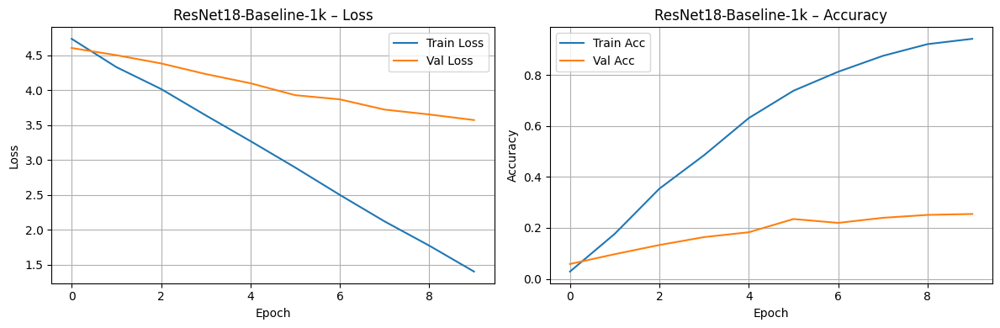

In [ ]:
model_resnet18_baseline_1K = get_resnet18_baseline()
subset_1k = train_subsets["1000"]
b1_model, b1_train_loss_hist, b1_val_loss_hist, b1_train_acc_hist, b1_val_acc_hist = train_model_on_subset(model_resnet18_baseline_1K, "ResNet18-Baseline-1k", subset_1k, num_epochs=10, plot_results=True)

📊 6.1 Resnet 18 + Baseline head 1k TESTING

In [ ]:
b1_model.eval()
b1_all_preds, b1_all_labels, b1_all_probs = [], [], []

b1_start_time = time.time()

with torch.no_grad():
    for inputs, labels in tqdm(test_loader, desc="🔍 Baseline modell 1k – tesztelés"):
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = b1_model(inputs)
        probs = torch.softmax(outputs, dim=1)
        preds = torch.argmax(probs, dim=1)

        b1_all_preds.extend(preds.cpu().numpy())
        b1_all_labels.extend(labels.cpu().numpy())
        b1_all_probs.extend(probs.cpu().numpy())

b1_inference_time_baseline = time.time() - b1_start_time

🔍 Baseline modell 1k – tesztelés: 100%|██████████| 284/284 [00:15<00:00, 18.11it/s]


📈 6.1 Resnet 18 + Baseline head 1k METRIKÁK

In [ ]:
b1_metrics_baseline = evaluate_metrics(
    np.array(b1_all_labels), np.array(b1_all_preds), np.array(b1_all_probs),
    "ResNet18 + Baseline fej 1k", b1_inference_time_baseline
)


🔍 Vizsgálat eredményei (ResNet18 + Baseline fej 1k):
✅ Top-1 Accuracy:  0.2530
✅ Top-5 Accuracy:  0.5288
🎯 Precision:       0.2584
🎯 Recall:          0.2676
🎯 F1-score:        0.2306
⏱️ Inference time:  15.69 sec


📈 6.1 Resnet 18 + Baseline head 1k Confusion Matrix

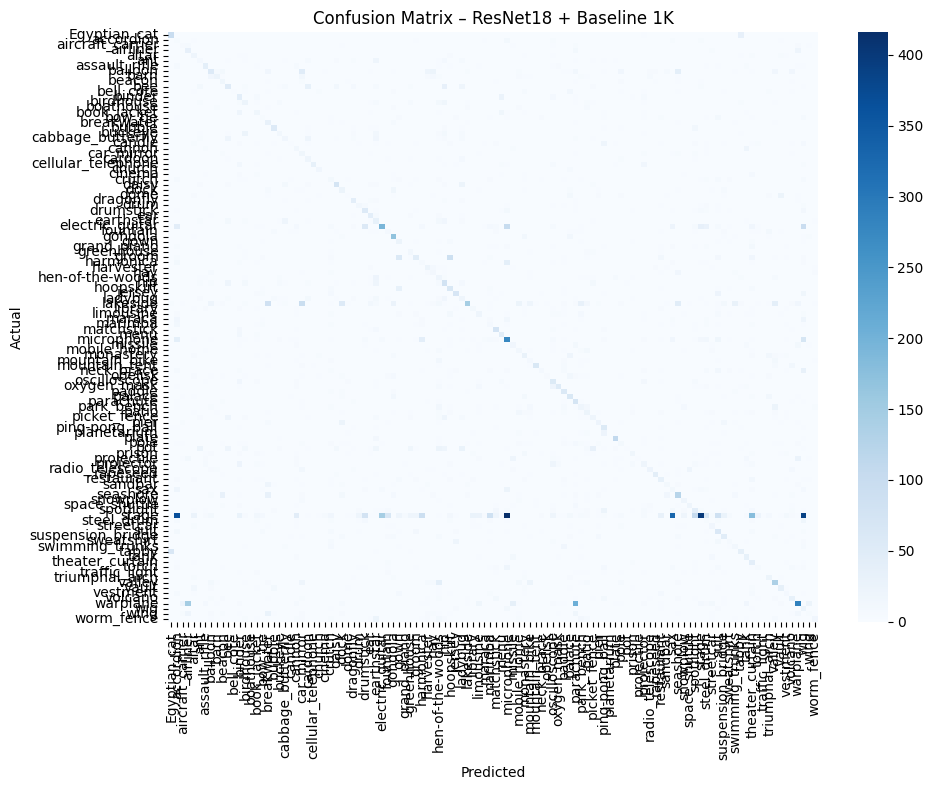

In [ ]:
plot_confusion_matrix(b1_all_labels, b1_all_preds, class_names, "Confusion Matrix – ResNet18 + Baseline 1K")

📈 6.1 Resnet 18 + Baseline head 1k Confusion Matrix Szebb

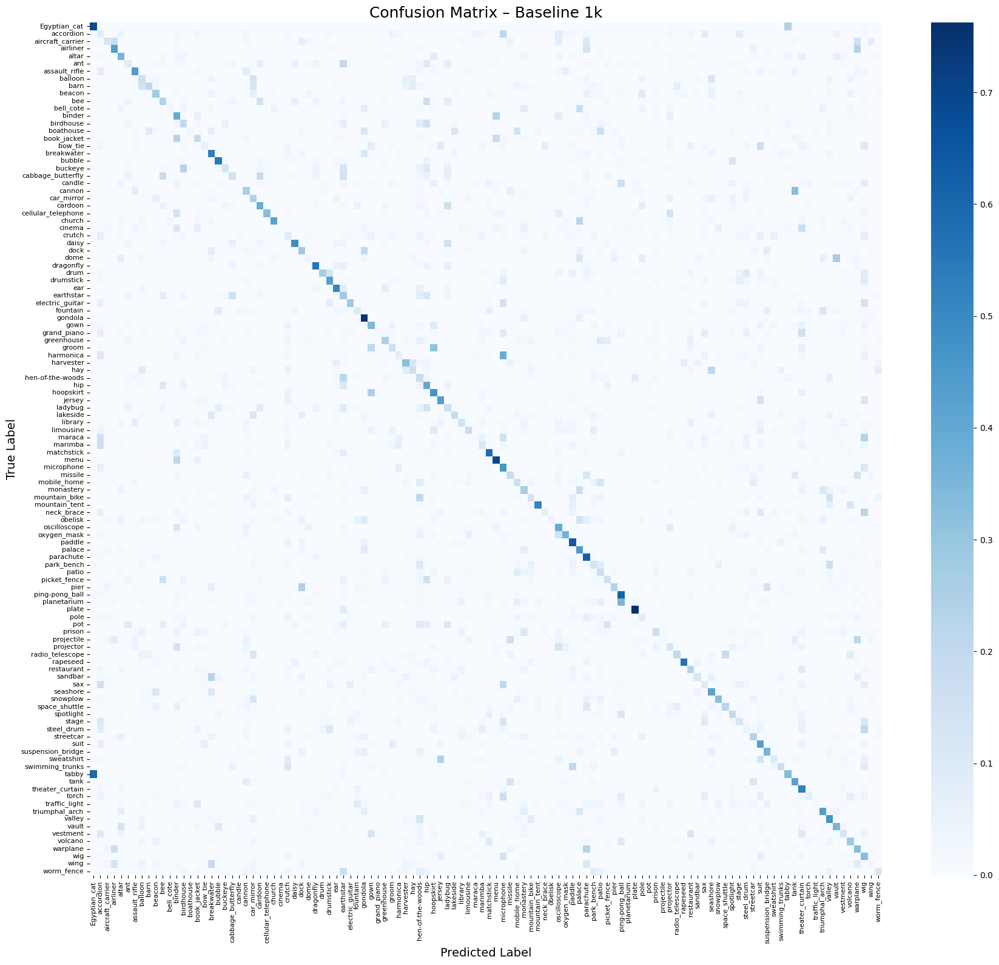

In [ ]:
plot_confusion_matrix_pretty(b1_all_labels, b1_all_preds, class_names, "Confusion Matrix – Baseline 1k")

📈 6.1 Resnet 18 + Baseline head 1k ADATOK

In [ ]:
print("📋 Baseline modell 1k – osztályonkénti metrikák:\n")
b1_df_baseline = export_classification_report(b1_all_labels, b1_all_preds, class_names, "stage_3_resnet18_baseline_1k")
display(b1_df_baseline.head())

📋 Baseline modell 1k – osztályonkénti metrikák:


📄 Exportálva: stage_3_resnet18_baseline_1k


,precision,recall,f1-score,support
Egyptian_cat,0.556180,0.682759,0.613003,145.0
accordion,0.006515,0.085106,0.012103,47.0
aircraft_carrier,0.090909,0.128205,0.106383,39.0
airliner,0.150215,0.437500,0.223642,80.0
altar,0.159091,0.355932,0.219895,59.0


📈 6.1 Resnet 18 + Baseline head 1k ADATOK – leggyengébb osztályok

In [ ]:
print_worst_classes(b1_df_baseline, "ResNet18 + Baseline 1k fej")


📉 ResNet18 + Baseline 1k fej – Top 10 leggyengébb osztály (F1-score alapján):



,precision,recall,f1-score
cinema,0.000000,0.000000,0.000000
planetarium,0.000000,0.000000,0.000000
accordion,0.006515,0.085106,0.012103
pot,0.222222,0.007874,0.015209
maraca,0.035714,0.011111,0.016949
grand_piano,0.071429,0.015873,0.025974
steel_drum,0.019231,0.047619,0.027397
candle,0.080000,0.018018,0.029412
traffic_light,0.100000,0.017241,0.029412
projectile,0.400000,0.017094,0.032787


✅ 6.1 GPU memóriahasználat, batch sebesség statisztika

In [ ]:
# --- GPU memóriahasználat ---
gpu_mem_allocated = torch.cuda.memory_allocated() / (1024 ** 3)
gpu_mem_reserved = torch.cuda.memory_reserved() / (1024 ** 3)

print(f"💾 GPU memória (lefoglalt): {gpu_mem_reserved:.2f} GB")
print(f"💾 GPU memória (használt):  {gpu_mem_allocated:.2f} GB")

💾 GPU memória (lefoglalt): 3.81 GB
💾 GPU memória (használt):  1.65 GB


📊 6.2 Resnet 18 + Baseline head 5k learning


---



[ResNet18-Baseline-5k] Epoch 1/10 - val: 100%|██████████| 282/282 [00:15<00:00, 18.05it/s]


📊 [ResNet18-Baseline-5k] Epoch 1: Train loss=4.4467, acc=0.0806 | Val loss=3.9194, acc=0.1808


[ResNet18-Baseline-5k] Epoch 2/10 - val: 100%|██████████| 282/282 [00:15<00:00, 18.03it/s]


📊 [ResNet18-Baseline-5k] Epoch 2: Train loss=3.4753, acc=0.2538 | Val loss=3.0388, acc=0.2682


[ResNet18-Baseline-5k] Epoch 3/10 - val: 100%|██████████| 282/282 [00:15<00:00, 18.27it/s]


📊 [ResNet18-Baseline-5k] Epoch 3: Train loss=2.7135, acc=0.3884 | Val loss=2.7277, acc=0.3577


[ResNet18-Baseline-5k] Epoch 4/10 - val: 100%|██████████| 282/282 [00:15<00:00, 17.84it/s]


📊 [ResNet18-Baseline-5k] Epoch 4: Train loss=2.0738, acc=0.5355 | Val loss=2.5510, acc=0.3653


[ResNet18-Baseline-5k] Epoch 5/10 - val: 100%|██████████| 282/282 [00:15<00:00, 18.19it/s]


📊 [ResNet18-Baseline-5k] Epoch 5: Train loss=1.5239, acc=0.6836 | Val loss=2.5363, acc=0.3799


[ResNet18-Baseline-5k] Epoch 6/10 - val: 100%|██████████| 282/282 [00:15<00:00, 18.16it/s]


📊 [ResNet18-Baseline-5k] Epoch 6: Train loss=1.0091, acc=0.8280 | Val loss=2.3911, acc=0.4051


[ResNet18-Baseline-5k] Epoch 7/10 - val: 100%|██████████| 282/282 [00:15<00:00, 18.20it/s]


📊 [ResNet18-Baseline-5k] Epoch 7: Train loss=0.6204, acc=0.9170 | Val loss=2.3878, acc=0.3961


[ResNet18-Baseline-5k] Epoch 8/10 - val: 100%|██████████| 282/282 [00:15<00:00, 18.15it/s]


📊 [ResNet18-Baseline-5k] Epoch 8: Train loss=0.3546, acc=0.9727 | Val loss=2.4313, acc=0.3915


[ResNet18-Baseline-5k] Epoch 9/10 - val: 100%|██████████| 282/282 [00:15<00:00, 17.96it/s]


📊 [ResNet18-Baseline-5k] Epoch 9: Train loss=0.2107, acc=0.9880 | Val loss=2.3608, acc=0.4172


[ResNet18-Baseline-5k] Epoch 10/10 - val: 100%|██████████| 282/282 [00:15<00:00, 18.28it/s]


📊 [ResNet18-Baseline-5k] Epoch 10: Train loss=0.1360, acc=0.9935 | Val loss=2.4281, acc=0.3971


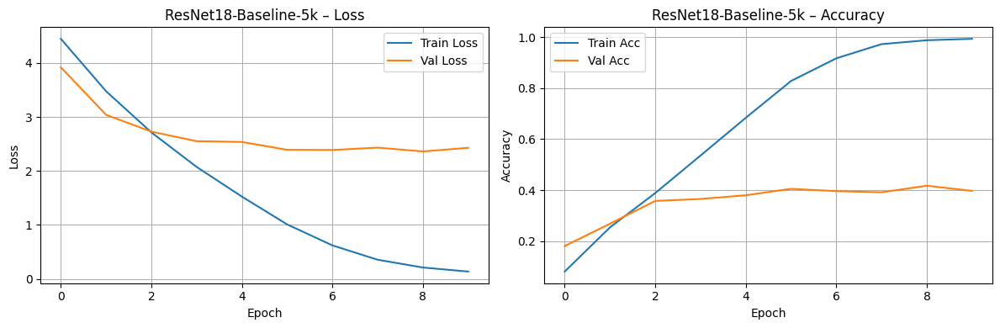

In [ ]:
model_resnet18_baseline_5K = get_resnet18_baseline()
subset_5k = train_subsets["5000"]
b5_model, b5_train_loss_hist, b5_val_loss_hist, b5_train_acc_hist, b5_val_acc_hist = train_model_on_subset(model_resnet18_baseline_5K, "ResNet18-Baseline-5k", subset_5k, num_epochs=10, plot_results=True)

📊 6.2 Resnet 18 + Baseline head 5k TESTING

In [ ]:
b5_model.eval()
b5_all_preds, b5_all_labels, b5_all_probs = [], [], []

b5_start_time = time.time()

with torch.no_grad():
    for inputs, labels in tqdm(test_loader, desc="🔍 Baseline modell 5k – tesztelés"):
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = b5_model(inputs)
        probs = torch.softmax(outputs, dim=1)
        preds = torch.argmax(probs, dim=1)

        b5_all_preds.extend(preds.cpu().numpy())
        b5_all_labels.extend(labels.cpu().numpy())
        b5_all_probs.extend(probs.cpu().numpy())

b5_inference_time_baseline = time.time() - b5_start_time

🔍 Baseline modell 5k – tesztelés: 100%|██████████| 284/284 [00:16<00:00, 17.70it/s]


📈 6.2 Resnet 18 + Baseline head 5k METRIKÁK

In [ ]:
b5_metrics_baseline = evaluate_metrics(
    np.array(b5_all_labels), np.array(b5_all_preds), np.array(b5_all_probs),
    "ResNet18 + Baseline fej 5k", b5_inference_time_baseline
)


🔍 Vizsgálat eredményei (ResNet18 + Baseline fej 5k):
✅ Top-1 Accuracy:  0.4029
✅ Top-5 Accuracy:  0.7069
🎯 Precision:       0.3886
🎯 Recall:          0.4328
🎯 F1-score:        0.3888
⏱️ Inference time:  16.05 sec


📈 6.2 Resnet 18 + Baseline head 5k Confusion Matrix

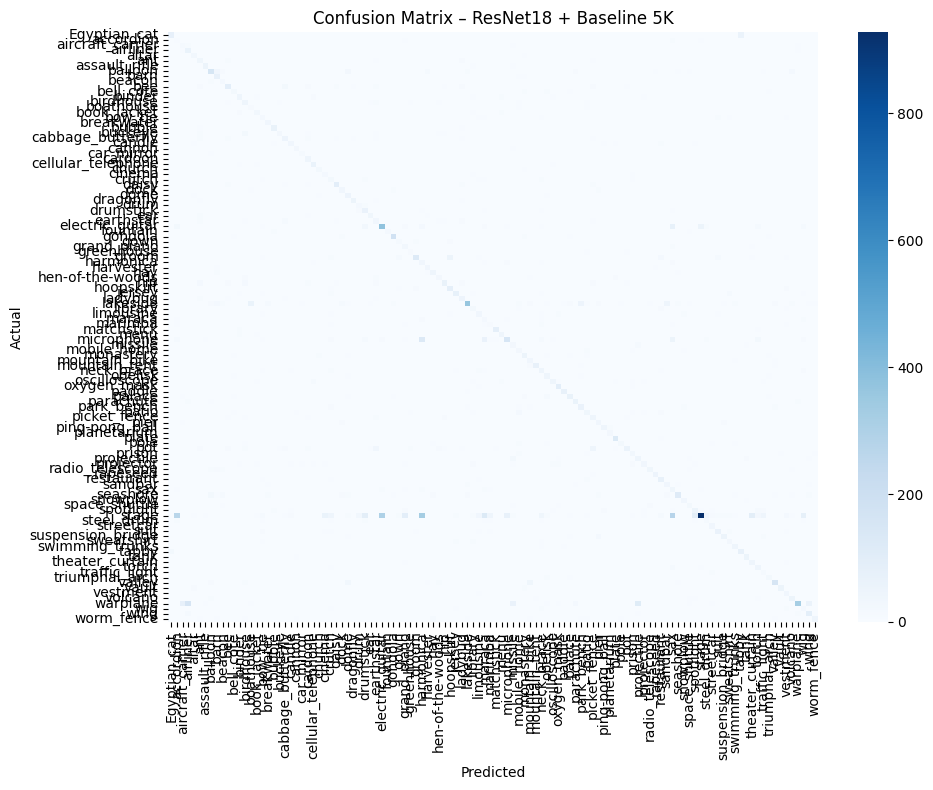

In [ ]:
plot_confusion_matrix(b5_all_labels, b5_all_preds, class_names, "Confusion Matrix – ResNet18 + Baseline 5K")

📈 6.5 Resnet 18 + Baseline head 5k Confusion Matrix Szebb

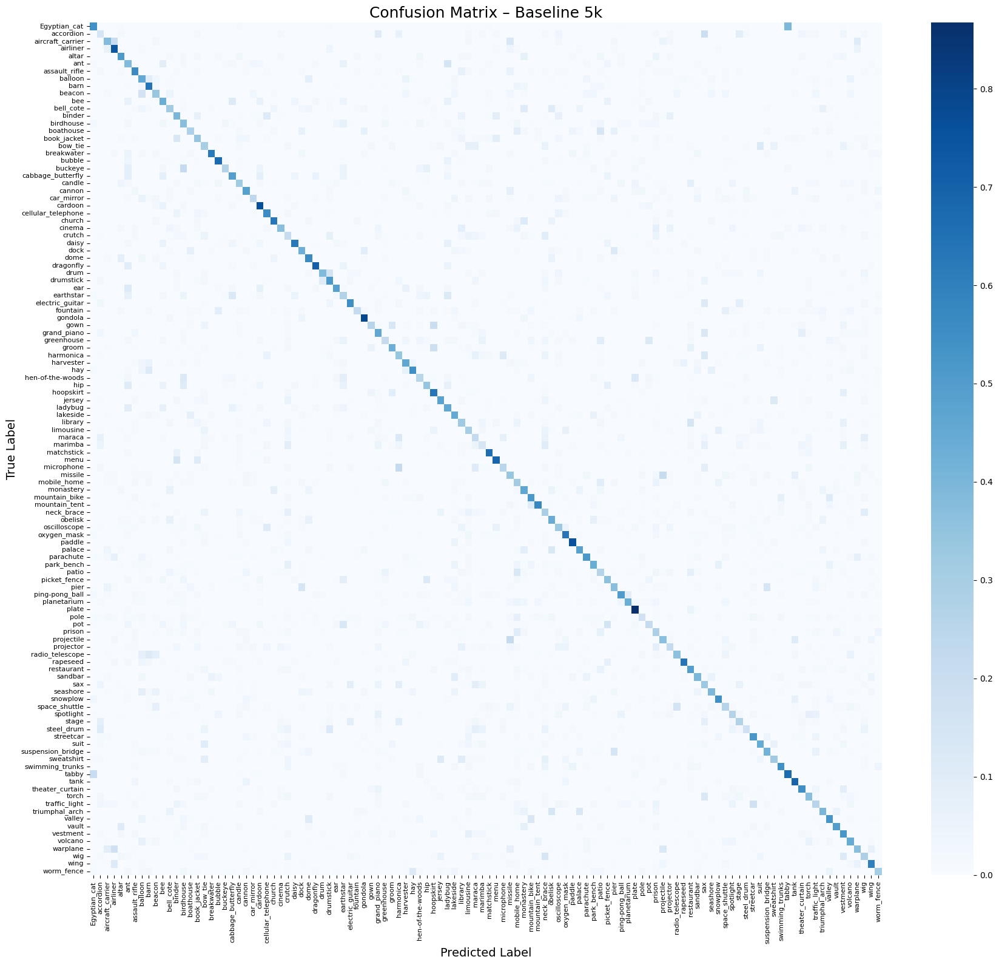

In [ ]:
plot_confusion_matrix_pretty(b5_all_labels, b5_all_preds, class_names, "Confusion Matrix – Baseline 5k")

📈 6.2 Resnet 18 + Baseline head 5k ADATOK

In [ ]:
print("📋 Baseline modell 5k – osztályonkénti metrikák:\n")
b5_df_baseline = export_classification_report(b5_all_labels, b5_all_preds, class_names, "stage_3_resnet18_baseline_5k")
display(b5_df_baseline.head())

📋 Baseline modell 5k – osztályonkénti metrikák:


📄 Exportálva: stage_3_resnet18_baseline_5k


,precision,recall,f1-score,support
Egyptian_cat,0.647541,0.544828,0.591760,145.0
accordion,0.019074,0.148936,0.033816,47.0
aircraft_carrier,0.116279,0.384615,0.178571,39.0
airliner,0.223485,0.737500,0.343023,80.0
altar,0.357143,0.508475,0.419580,59.0


📈 6.2 Resnet 18 + Baseline head 5k ADATOK – leggyengébb osztályok

In [ ]:
print_worst_classes(b5_df_baseline, "ResNet18 + Baseline 5k fej")


📉 ResNet18 + Baseline 5k fej – Top 10 leggyengébb osztály (F1-score alapján):



,precision,recall,f1-score
accordion,0.019074,0.148936,0.033816
harmonica,0.062500,0.340000,0.105590
maraca,0.069444,0.222222,0.105820
marimba,0.089431,0.139241,0.108911
sax,0.070209,0.330357,0.115806
crutch,0.105263,0.209524,0.140127
wig,0.097561,0.285714,0.145455
boathouse,0.108108,0.279070,0.155844
traffic_light,0.117188,0.258621,0.161290
steel_drum,0.157895,0.178571,0.167598


✅ 6.1 GPU memóriahasználat, batch sebesség statisztika

In [ ]:
# --- GPU memóriahasználat ---
gpu_mem_allocated = torch.cuda.memory_allocated() / (1024 ** 3)
gpu_mem_reserved = torch.cuda.memory_reserved() / (1024 ** 3)

print(f"💾 GPU memória (lefoglalt): {gpu_mem_reserved:.2f} GB")
print(f"💾 GPU memória (használt):  {gpu_mem_allocated:.2f} GB")

💾 GPU memória (lefoglalt): 3.81 GB
💾 GPU memória (használt):  1.65 GB


📊 6.3 Resnet 18 + Baseline head 10k learning


---


[ResNet18-Baseline-10k] Epoch 1/10 - val: 100%|██████████| 282/282 [00:15<00:00, 17.63it/s]


📊 [ResNet18-Baseline-10k] Epoch 1: Train loss=4.0343, acc=0.1483 | Val loss=3.2407, acc=0.2619


[ResNet18-Baseline-10k] Epoch 2/10 - val: 100%|██████████| 282/282 [00:16<00:00, 17.46it/s]


📊 [ResNet18-Baseline-10k] Epoch 2: Train loss=2.8125, acc=0.3287 | Val loss=2.4787, acc=0.3865


[ResNet18-Baseline-10k] Epoch 3/10 - val: 100%|██████████| 282/282 [00:15<00:00, 17.87it/s]


📊 [ResNet18-Baseline-10k] Epoch 3: Train loss=2.0849, acc=0.4840 | Val loss=2.2179, acc=0.4386


[ResNet18-Baseline-10k] Epoch 4/10 - val: 100%|██████████| 282/282 [00:15<00:00, 17.96it/s]


📊 [ResNet18-Baseline-10k] Epoch 4: Train loss=1.4812, acc=0.6357 | Val loss=2.2599, acc=0.4186


[ResNet18-Baseline-10k] Epoch 5/10 - val: 100%|██████████| 282/282 [00:16<00:00, 17.44it/s]


📊 [ResNet18-Baseline-10k] Epoch 5: Train loss=0.9552, acc=0.7845 | Val loss=2.0759, acc=0.4672


[ResNet18-Baseline-10k] Epoch 6/10 - val: 100%|██████████| 282/282 [00:15<00:00, 18.10it/s]


📊 [ResNet18-Baseline-10k] Epoch 6: Train loss=0.5401, acc=0.9014 | Val loss=2.1183, acc=0.4675


[ResNet18-Baseline-10k] Epoch 7/10 - val: 100%|██████████| 282/282 [00:15<00:00, 17.86it/s]


📊 [ResNet18-Baseline-10k] Epoch 7: Train loss=0.2814, acc=0.9627 | Val loss=2.1816, acc=0.4595


[ResNet18-Baseline-10k] Epoch 8/10 - val: 100%|██████████| 282/282 [00:15<00:00, 18.18it/s]


📊 [ResNet18-Baseline-10k] Epoch 8: Train loss=0.1573, acc=0.9843 | Val loss=2.2619, acc=0.4595


[ResNet18-Baseline-10k] Epoch 9/10 - val: 100%|██████████| 282/282 [00:15<00:00, 18.07it/s]


📊 [ResNet18-Baseline-10k] Epoch 9: Train loss=0.1004, acc=0.9904 | Val loss=2.3713, acc=0.4397


[ResNet18-Baseline-10k] Epoch 10/10 - val: 100%|██████████| 282/282 [00:15<00:00, 17.89it/s]


📊 [ResNet18-Baseline-10k] Epoch 10: Train loss=0.0626, acc=0.9944 | Val loss=2.3267, acc=0.4522


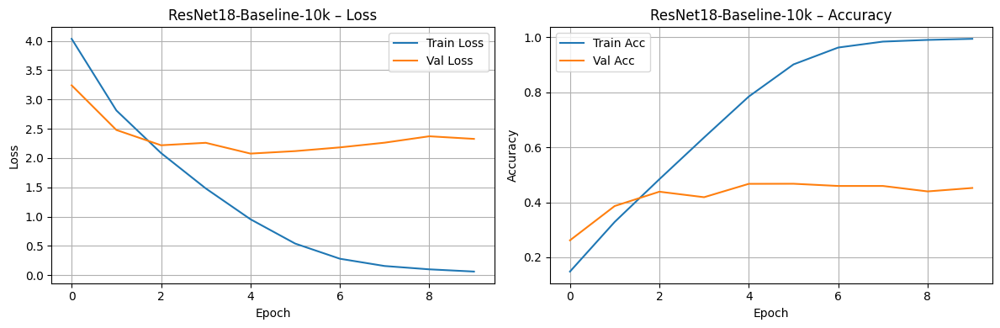

In [ ]:
model_resnet18_baseline_10K = get_resnet18_baseline()
subset_10k = train_subsets["10000"]
b10_model, b10_train_loss_hist, b10_val_loss_hist, b10_train_acc_hist, b10_val_acc_hist = train_model_on_subset(model_resnet18_baseline_10K, "ResNet18-Baseline-10k", subset_10k, num_epochs=10, plot_results=True)


📊 6.3 Resnet 18 + Baseline head 10k TESTING

In [ ]:
b10_model.eval()
b10_all_preds, b10_all_labels, b10_all_probs = [], [], []

b10_start_time = time.time()

with torch.no_grad():
    for inputs, labels in tqdm(test_loader, desc="🔍 Baseline modell 1k – tesztelés"):
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = b10_model(inputs)
        probs = torch.softmax(outputs, dim=1)
        preds = torch.argmax(probs, dim=1)

        b10_all_preds.extend(preds.cpu().numpy())
        b10_all_labels.extend(labels.cpu().numpy())
        b10_all_probs.extend(probs.cpu().numpy())

b10_inference_time_baseline = time.time() - b10_start_time

🔍 Baseline modell 1k – tesztelés: 100%|██████████| 284/284 [00:15<00:00, 17.86it/s]


📈 6.3 Resnet 18 + Baseline head 10k METRIKÁK

In [ ]:
b10_metrics_baseline = evaluate_metrics(
    np.array(b10_all_labels), np.array(b10_all_preds), np.array(b10_all_probs),
    "ResNet18 + Baseline fej 10k", b10_inference_time_baseline
)


🔍 Vizsgálat eredményei (ResNet18 + Baseline fej 10k):
✅ Top-1 Accuracy:  0.4518
✅ Top-5 Accuracy:  0.7495
🎯 Precision:       0.4428
🎯 Recall:          0.4914
🎯 F1-score:        0.4463
⏱️ Inference time:  15.90 sec


📈 6.3 Resnet 18 + Baseline head 10k Confusion Matrix

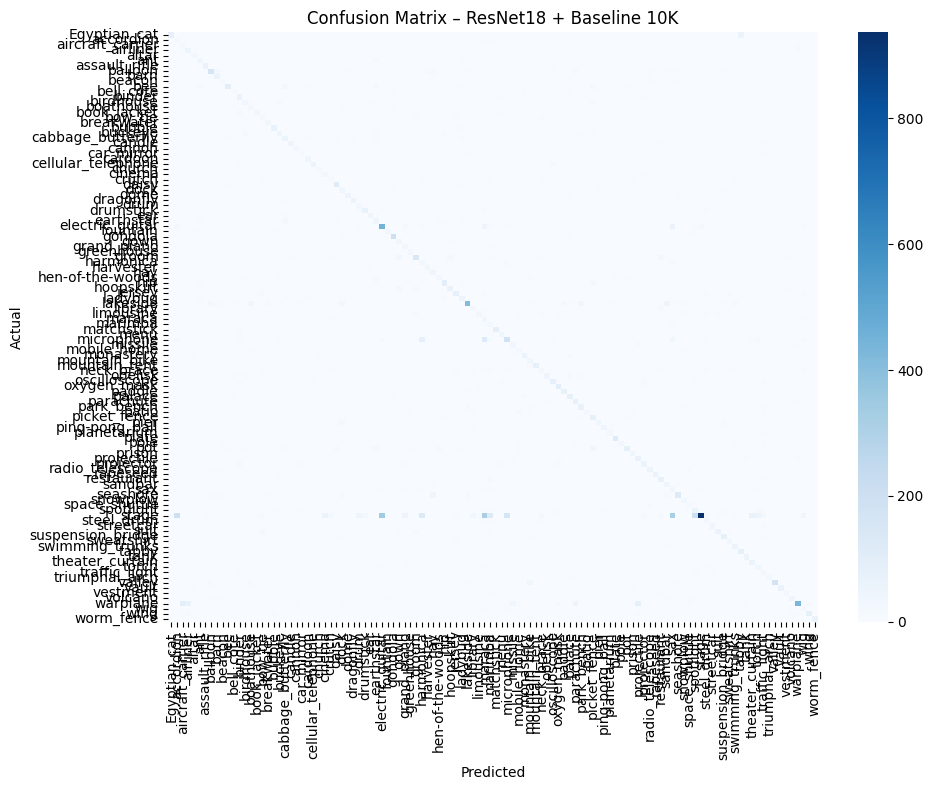

In [ ]:
plot_confusion_matrix(b10_all_labels, b10_all_preds, class_names, "Confusion Matrix – ResNet18 + Baseline 10K")

📈 6.3 Resnet 18 + Baseline head 10k Confusion Matrix Szebb

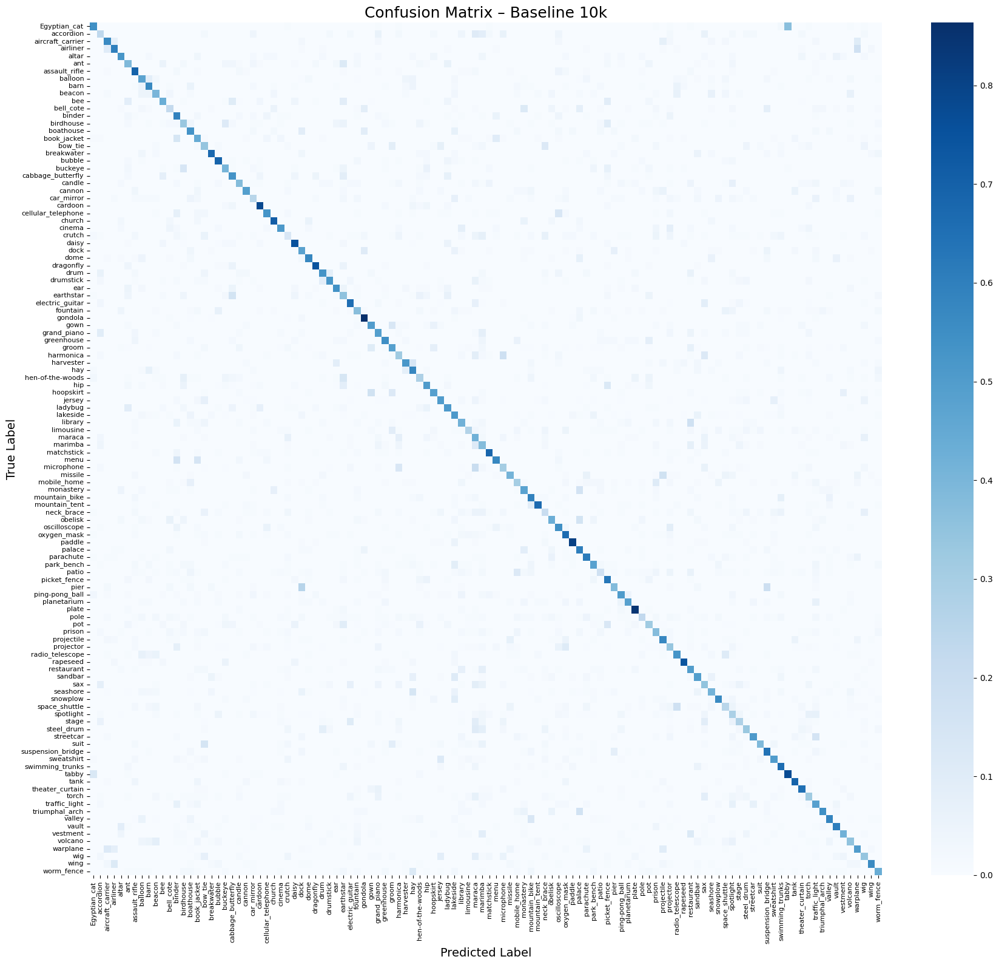

In [ ]:
plot_confusion_matrix_pretty(b10_all_labels, b10_all_preds, class_names, "Confusion Matrix – Baseline 10k")

📈 6.3 Resnet 18 + Baseline head 10k ADATOK

In [ ]:
print("📋 Baseline modell 10k – osztályonkénti metrikák:\n")
b10_df_baseline = export_classification_report(b10_all_labels, b10_all_preds, class_names, "stage_3_resnet18_baseline_10k")
display(b10_df_baseline.head())

📋 Baseline modell 10k – osztályonkénti metrikák:


📄 Exportálva: stage_3_resnet18_baseline_10k


,precision,recall,f1-score,support
Egyptian_cat,0.718182,0.544828,0.619608,145.0
accordion,0.038328,0.234043,0.065868,47.0
aircraft_carrier,0.148649,0.564103,0.235294,39.0
airliner,0.335664,0.600000,0.430493,80.0
altar,0.455882,0.525424,0.488189,59.0


📈 6.3 Resnet 18 + Baseline head 10k ADATOK – leggyengébb osztályok

In [ ]:
print_worst_classes(b10_df_baseline, "ResNet18 + Baseline 10k fej")


📉 ResNet18 + Baseline 10k fej – Top 10 leggyengébb osztály (F1-score alapján):



,precision,recall,f1-score
accordion,0.038328,0.234043,0.065868
maraca,0.058282,0.422222,0.102426
sax,0.074004,0.348214,0.122066
crutch,0.128440,0.133333,0.130841
marimba,0.100671,0.379747,0.159151
harmonica,0.108844,0.320000,0.162437
spotlight,0.159341,0.287129,0.204947
neck_brace,0.243478,0.204380,0.222222
wig,0.169014,0.342857,0.226415
space_shuttle,0.216495,0.250000,0.232044


✅ 6.3 GPU memóriahasználat, batch sebesség statisztika

In [ ]:
# --- GPU memóriahasználat ---
gpu_mem_allocated = torch.cuda.memory_allocated() / (1024 ** 3)
gpu_mem_reserved = torch.cuda.memory_reserved() / (1024 ** 3)

print(f"💾 GPU memória (lefoglalt): {gpu_mem_reserved:.2f} GB")
print(f"💾 GPU memória (használt):  {gpu_mem_allocated:.2f} GB")

💾 GPU memória (lefoglalt): 3.82 GB
💾 GPU memória (használt):  1.74 GB


📊 6.4 Resnet 18 + Baseline head 25k learning


---

[ResNet18-Baseline-25k] Epoch 1/10 - val: 100%|██████████| 282/282 [00:15<00:00, 17.63it/s]


📊 [ResNet18-Baseline-25k] Epoch 1: Train loss=3.3194, acc=0.2445 | Val loss=2.3045, acc=0.4164


[ResNet18-Baseline-25k] Epoch 2/10 - val: 100%|██████████| 282/282 [00:16<00:00, 17.58it/s]


📊 [ResNet18-Baseline-25k] Epoch 2: Train loss=2.1057, acc=0.4619 | Val loss=1.9860, acc=0.4710


[ResNet18-Baseline-25k] Epoch 3/10 - val: 100%|██████████| 282/282 [00:16<00:00, 17.32it/s]


📊 [ResNet18-Baseline-25k] Epoch 3: Train loss=1.5077, acc=0.6044 | Val loss=1.9030, acc=0.4831


[ResNet18-Baseline-25k] Epoch 4/10 - val: 100%|██████████| 282/282 [00:15<00:00, 17.68it/s]


📊 [ResNet18-Baseline-25k] Epoch 4: Train loss=1.0181, acc=0.7330 | Val loss=1.8814, acc=0.5002


[ResNet18-Baseline-25k] Epoch 5/10 - val: 100%|██████████| 282/282 [00:15<00:00, 17.96it/s]


📊 [ResNet18-Baseline-25k] Epoch 5: Train loss=0.6182, acc=0.8441 | Val loss=2.1540, acc=0.4695


[ResNet18-Baseline-25k] Epoch 6/10 - val: 100%|██████████| 282/282 [00:15<00:00, 18.10it/s]


📊 [ResNet18-Baseline-25k] Epoch 6: Train loss=0.3512, acc=0.9195 | Val loss=2.1417, acc=0.5017


[ResNet18-Baseline-25k] Epoch 7/10 - val: 100%|██████████| 282/282 [00:15<00:00, 18.15it/s]


📊 [ResNet18-Baseline-25k] Epoch 7: Train loss=0.2307, acc=0.9501 | Val loss=2.1360, acc=0.5111


[ResNet18-Baseline-25k] Epoch 8/10 - val: 100%|██████████| 282/282 [00:15<00:00, 17.76it/s]


📊 [ResNet18-Baseline-25k] Epoch 8: Train loss=0.1372, acc=0.9728 | Val loss=2.3455, acc=0.5054


[ResNet18-Baseline-25k] Epoch 9/10 - val: 100%|██████████| 282/282 [00:15<00:00, 17.74it/s]


📊 [ResNet18-Baseline-25k] Epoch 9: Train loss=0.0946, acc=0.9823 | Val loss=2.3789, acc=0.5013


[ResNet18-Baseline-25k] Epoch 10/10 - val: 100%|██████████| 282/282 [00:16<00:00, 17.53it/s]


📊 [ResNet18-Baseline-25k] Epoch 10: Train loss=0.1103, acc=0.9763 | Val loss=2.5380, acc=0.4915


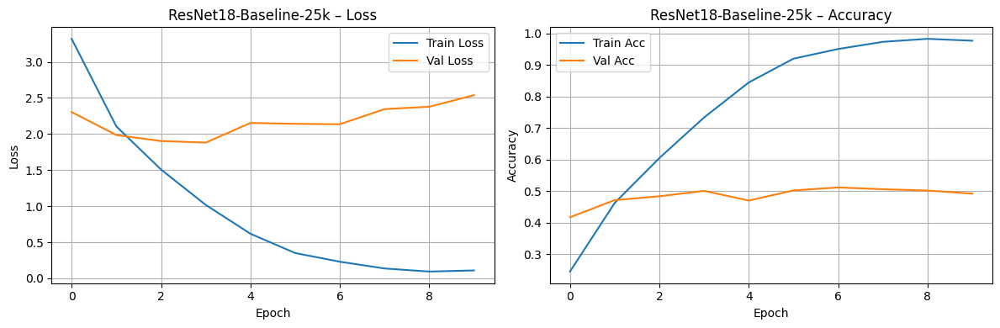

In [ ]:
model_resnet18_baseline_25K = get_resnet18_baseline()
subset_25k = train_subsets["25000"]
b25_model, b25_train_loss_hist, b25_val_loss_hist, b25_train_acc_hist, b25_val_acc_hist = train_model_on_subset(model_resnet18_baseline_25K, "ResNet18-Baseline-25k", subset_25k, num_epochs=10, plot_results=True)


📊 6.4 Resnet 18 + Baseline head 25k TESTING

In [ ]:
b25_model.eval()
b25_all_preds, b25_all_labels, b25_all_probs = [], [], []

b25_start_time = time.time()

with torch.no_grad():
    for inputs, labels in tqdm(test_loader, desc="🔍 Baseline modell 25k – tesztelés"):
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = b25_model(inputs)
        probs = torch.softmax(outputs, dim=1)
        preds = torch.argmax(probs, dim=1)

        b25_all_preds.extend(preds.cpu().numpy())
        b25_all_labels.extend(labels.cpu().numpy())
        b25_all_probs.extend(probs.cpu().numpy())

b25_inference_time_baseline = time.time() - b25_start_time

🔍 Baseline modell 25k – tesztelés: 100%|██████████| 284/284 [00:16<00:00, 16.71it/s]


📈 6.4 Resnet 18 + Baseline head 25k METRIKÁK

In [ ]:
b25_metrics_baseline = evaluate_metrics(
    np.array(b25_all_labels), np.array(b25_all_preds), np.array(b25_all_probs),
    "ResNet18 + Baseline fej 25k", b25_inference_time_baseline
)


🔍 Vizsgálat eredményei (ResNet18 + Baseline fej 25k):
✅ Top-1 Accuracy:  0.4917
✅ Top-5 Accuracy:  0.7758
🎯 Precision:       0.4865
🎯 Recall:          0.5520
🎯 F1-score:        0.4944
⏱️ Inference time:  17.00 sec


📈 6.4 Resnet 18 + Baseline head 25k Confusion Matrix

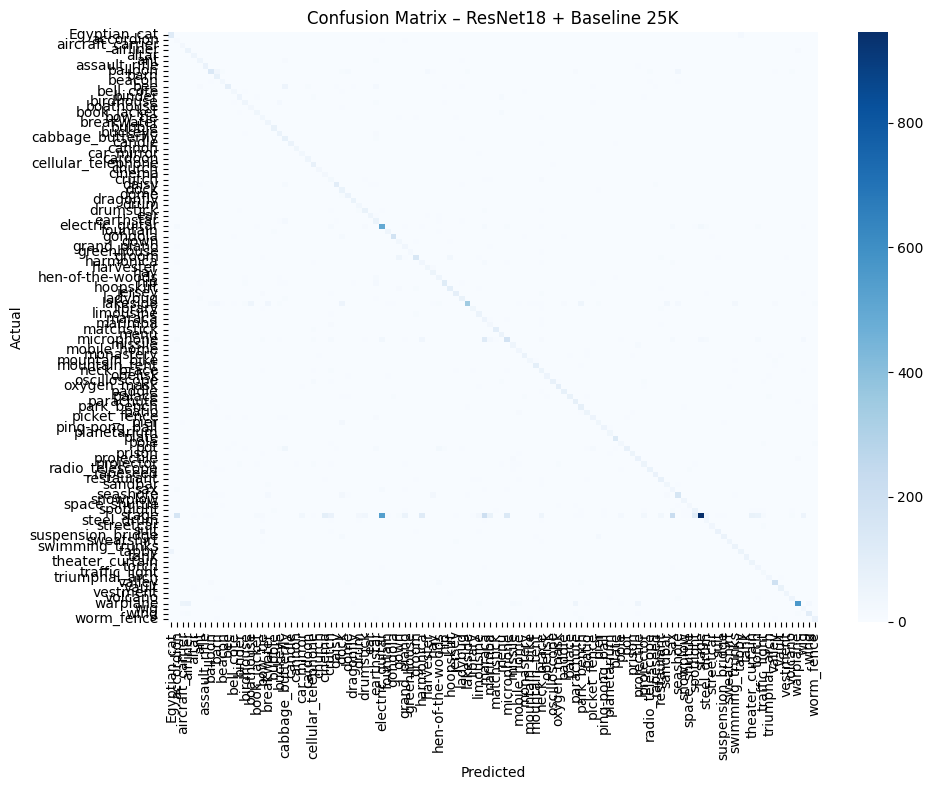

In [ ]:
plot_confusion_matrix(b25_all_labels, b25_all_preds, class_names, "Confusion Matrix – ResNet18 + Baseline 25K")

📈 6.4 Resnet 18 + Baseline head 25k Confusion Matrix Szebb

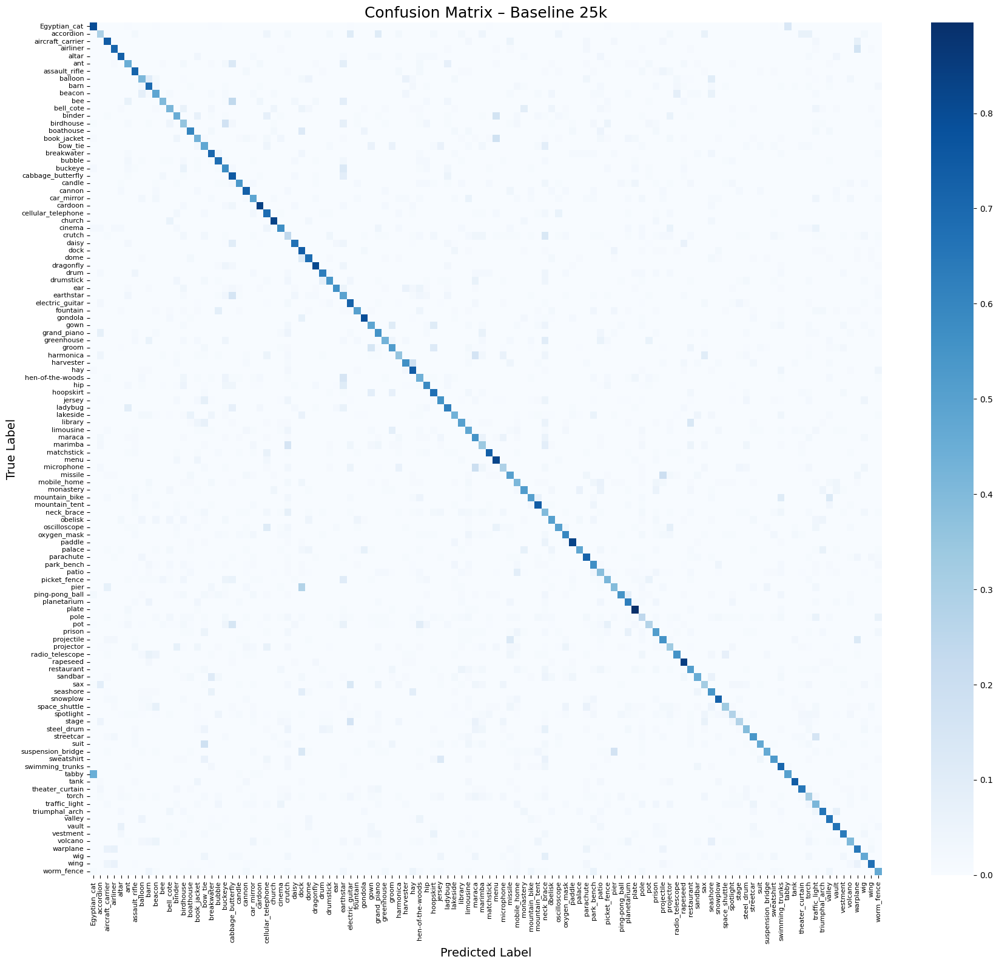

In [ ]:
plot_confusion_matrix_pretty(b25_all_labels, b25_all_preds, class_names, "Confusion Matrix – Baseline 25k")

📈 6.4 Resnet 18 + Baseline head 25k ADATOK

In [ ]:
print("📋 Baseline modell 25k – osztályonkénti metrikák:\n")
b25_df_baseline = export_classification_report(b25_all_labels, b25_all_preds, class_names, "stage_3_resnet18_baseline_25k")
display(b25_df_baseline.head())

📋 Baseline modell 25k – osztályonkénti metrikák:


📄 Exportálva: stage_3_resnet18_baseline_25k


,precision,recall,f1-score,support
Egyptian_cat,0.655367,0.800000,0.720497,145.0
accordion,0.058577,0.297872,0.097902,47.0
aircraft_carrier,0.237705,0.743590,0.360248,39.0
airliner,0.419118,0.712500,0.527778,80.0
altar,0.589041,0.728814,0.651515,59.0


📈 6.4 Resnet 18 + Baseline head 25k ADATOK – leggyengébb osztályok

In [ ]:
print_worst_classes(b25_df_baseline, "ResNet18 + Baseline 25k fej")


📉 ResNet18 + Baseline 25k fej – Top 10 leggyengébb osztály (F1-score alapján):



,precision,recall,f1-score
accordion,0.058577,0.297872,0.097902
crutch,0.103734,0.238095,0.144509
sax,0.110769,0.321429,0.164760
maraca,0.110375,0.555556,0.184162
marimba,0.151685,0.341772,0.210117
harmonica,0.169811,0.360000,0.230769
pole,0.248120,0.242647,0.245353
torch,0.204545,0.310345,0.246575
traffic_light,0.188976,0.413793,0.259459
neck_brace,0.203704,0.401460,0.270270


✅ 6.4 GPU memóriahasználat, batch sebesség statisztika

In [ ]:
# --- GPU memóriahasználat ---
gpu_mem_allocated = torch.cuda.memory_allocated() / (1024 ** 3)
gpu_mem_reserved = torch.cuda.memory_reserved() / (1024 ** 3)

print(f"💾 GPU memória (lefoglalt): {gpu_mem_reserved:.2f} GB")
print(f"💾 GPU memória (használt):  {gpu_mem_allocated:.2f} GB")

💾 GPU memória (lefoglalt): 3.83 GB
💾 GPU memória (használt):  1.83 GB


📊 6.4 Resnet 18 + Baseline head összesítő statisztikák!


---



<ipython-input-76-c151538c9832>:51: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


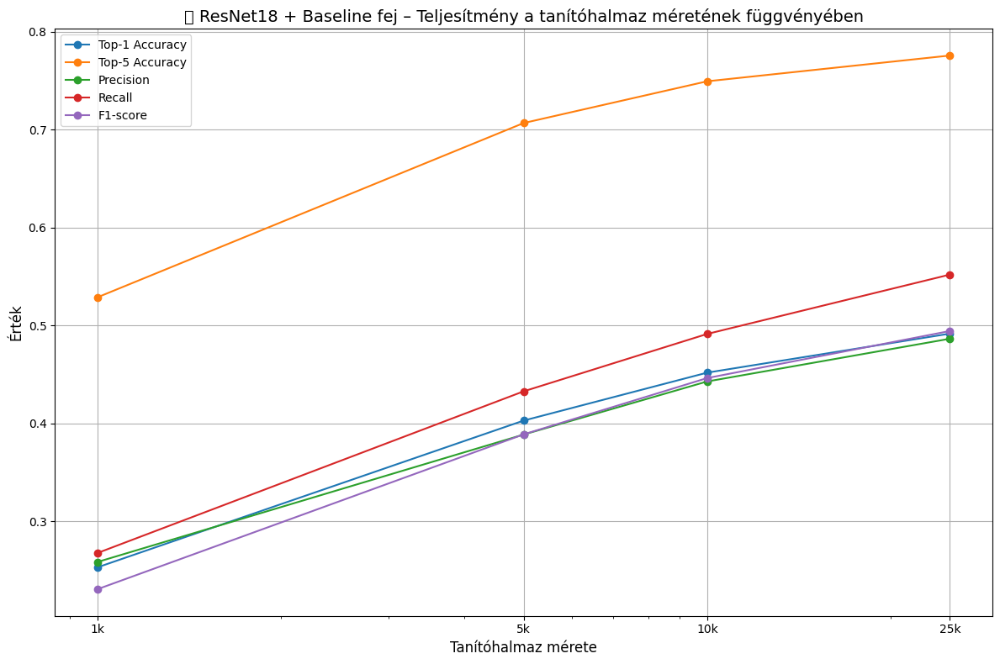

In [ ]:
# --- 📊 Összesített metrikák begyűjtése ---
metric_data = {
    "Train Size": [1000, 5000, 10000, 25000],
    "Top-1 Accuracy": [
        b1_metrics_baseline["top1"],
        b5_metrics_baseline["top1"],
        b10_metrics_baseline["top1"],
        b25_metrics_baseline["top1"]
    ],
    "Top-5 Accuracy": [
        b1_metrics_baseline["top5"],
        b5_metrics_baseline["top5"],
        b10_metrics_baseline["top5"],
        b25_metrics_baseline["top5"]
    ],
    "Precision": [
        b1_metrics_baseline["precision"],
        b5_metrics_baseline["precision"],
        b10_metrics_baseline["precision"],
        b25_metrics_baseline["precision"]
    ],
    "Recall": [
        b1_metrics_baseline["recall"],
        b5_metrics_baseline["recall"],
        b10_metrics_baseline["recall"],
        b25_metrics_baseline["recall"]
    ],
    "F1-score": [
        b1_metrics_baseline["f1"],
        b5_metrics_baseline["f1"],
        b10_metrics_baseline["f1"],
        b25_metrics_baseline["f1"]
    ]
}

# --- 📊 DataFrame-be rendezés ---
df_metrics = pd.DataFrame(metric_data)

# --- 📈 Grafikon rajzolása ---
plt.figure(figsize=(12, 8))
for metric in ["Top-1 Accuracy", "Top-5 Accuracy", "Precision", "Recall", "F1-score"]:
    plt.plot(df_metrics["Train Size"], df_metrics[metric], marker='o', label=metric)

plt.title("📊 ResNet18 + Baseline fej – Teljesítmény a tanítóhalmaz méretének függvényében", fontsize=14)
plt.xlabel("Tanítóhalmaz mérete", fontsize=12)
plt.ylabel("Érték", fontsize=12)
plt.xscale("log")
plt.xticks(df_metrics["Train Size"], labels=[f"{int(x/1000)}k" for x in df_metrics["Train Size"]])
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


<ipython-input-77-bce15225f7cc>:41: UserWarning: Glyph 128201 (\N{CHART WITH DOWNWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-77-bce15225f7cc>:41: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128201 (\N{CHART WITH DOWNWARDS TREND}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


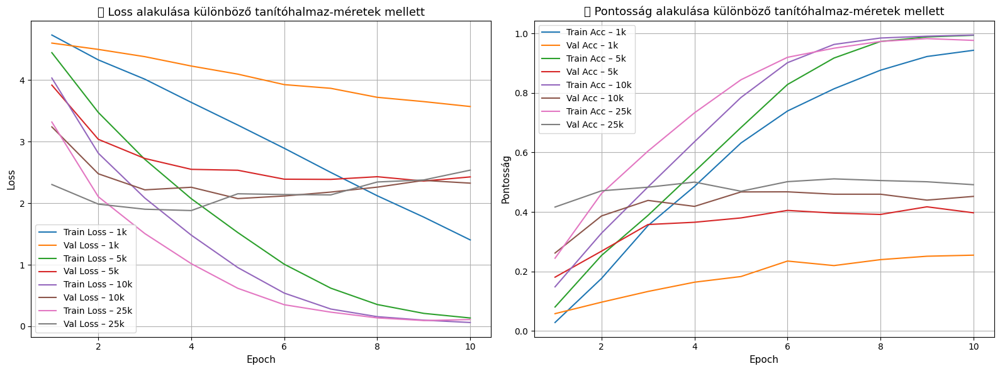

In [ ]:
import matplotlib.pyplot as plt

# --- Epoch tengely ---
epochs = list(range(1, len(b1_train_loss_hist) + 1))

# --- 🎨 Ábra beállítás ---
plt.figure(figsize=(16, 6))

# --- 📉 Loss görbék ---
plt.subplot(1, 2, 1)
plt.plot(epochs, b1_train_loss_hist, label="Train Loss – 1k")
plt.plot(epochs, b1_val_loss_hist, label="Val Loss – 1k")
plt.plot(epochs, b5_train_loss_hist, label="Train Loss – 5k")
plt.plot(epochs, b5_val_loss_hist, label="Val Loss – 5k")
plt.plot(epochs, b10_train_loss_hist, label="Train Loss – 10k")
plt.plot(epochs, b10_val_loss_hist, label="Val Loss – 10k")
plt.plot(epochs, b25_train_loss_hist, label="Train Loss – 25k")
plt.plot(epochs, b25_val_loss_hist, label="Val Loss – 25k")
plt.title("📉 Loss alakulása különböző tanítóhalmaz-méretek mellett", fontsize=13)
plt.xlabel("Epoch", fontsize=11)
plt.ylabel("Loss", fontsize=11)
plt.legend()
plt.grid(True)

# --- 📈 Accuracy görbék ---
plt.subplot(1, 2, 2)
plt.plot(epochs, b1_train_acc_hist, label="Train Acc – 1k")
plt.plot(epochs, b1_val_acc_hist, label="Val Acc – 1k")
plt.plot(epochs, b5_train_acc_hist, label="Train Acc – 5k")
plt.plot(epochs, b5_val_acc_hist, label="Val Acc – 5k")
plt.plot(epochs, b10_train_acc_hist, label="Train Acc – 10k")
plt.plot(epochs, b10_val_acc_hist, label="Val Acc – 10k")
plt.plot(epochs, b25_train_acc_hist, label="Train Acc – 25k")
plt.plot(epochs, b25_val_acc_hist, label="Val Acc – 25k")
plt.title("📈 Pontosság alakulása különböző tanítóhalmaz-méretek mellett", fontsize=13)
plt.xlabel("Epoch", fontsize=11)
plt.ylabel("Pontosság", fontsize=11)
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


<ipython-input-78-dc3c697c0623>:25: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


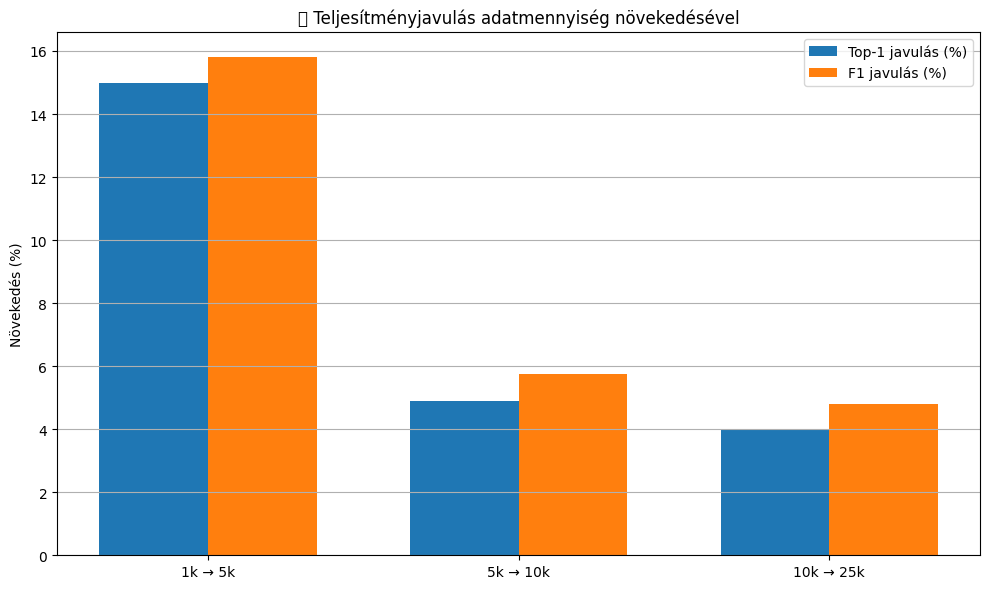

In [ ]:
# 4️⃣ Metrikák arányos növekedése (pl. megtérülés-elemzés)
import matplotlib.pyplot as plt
import numpy as np

train_sizes = [1000, 5000, 10000, 25000]
top1s  = [b1_metrics_baseline["top1"], b5_metrics_baseline["top1"], b10_metrics_baseline["top1"], b25_metrics_baseline["top1"]]
f1s    = [b1_metrics_baseline["f1"],   b5_metrics_baseline["f1"],   b10_metrics_baseline["f1"],   b25_metrics_baseline["f1"]]

top1_gains = [100 * (b - a) for a, b in zip(top1s[:-1], top1s[1:])]
f1_gains   = [100 * (b - a) for a, b in zip(f1s[:-1],   f1s[1:])]

labels = ["1k → 5k", "5k → 10k", "10k → 25k"]
x = np.arange(len(labels))
width = 0.35

plt.figure(figsize=(10, 6))
plt.bar(x - width/2, top1_gains, width, label='Top-1 javulás (%)')
plt.bar(x + width/2, f1_gains, width, label='F1 javulás (%)')

plt.ylabel('Növekedés (%)')
plt.title('📈 Teljesítményjavulás adatmennyiség növekedésével')
plt.xticks(x, labels)
plt.legend()
plt.grid(axis='y')
plt.tight_layout()
plt.show()


<ipython-input-85-5649391fb376>:19: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0, 0, 1, 0.95])
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


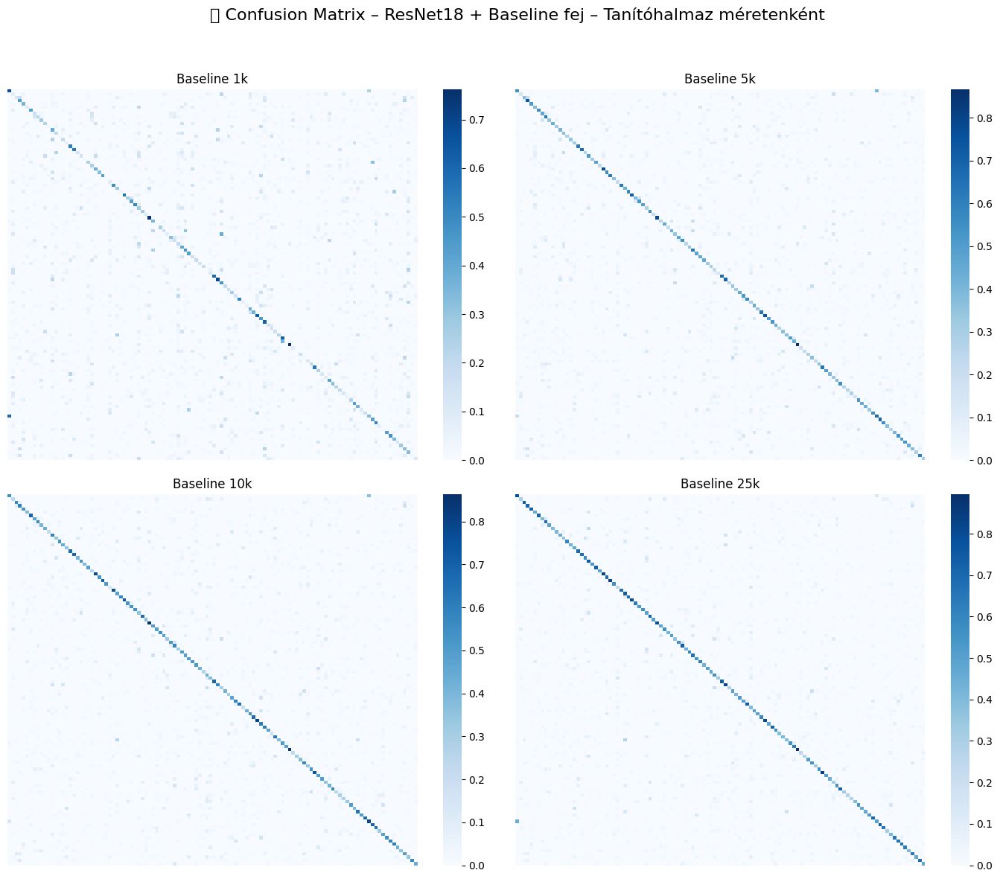

In [ ]:
# 5️⃣ Confusion Matrix összehasonlító ábra – szépített 2x2-ben, kicsiben
fig, axes = plt.subplots(2, 2, figsize=(14, 12))

# Egyedi subplotokba ágyazás
plt.sca(axes[0, 0])
plot_confusion_matrix_pretty(b1_all_labels, b1_all_preds, class_names, "Baseline 1k", show=False, small=True)

plt.sca(axes[0, 1])
plot_confusion_matrix_pretty(b5_all_labels, b5_all_preds, class_names, "Baseline 5k", show=False, small=True)

plt.sca(axes[1, 0])
plot_confusion_matrix_pretty(b10_all_labels, b10_all_preds, class_names, "Baseline 10k", show=False, small=True)

plt.sca(axes[1, 1])
plot_confusion_matrix_pretty(b25_all_labels, b25_all_preds, class_names, "Baseline 25k", show=False, small=True)

# Közös cím
plt.suptitle("📊 Confusion Matrix – ResNet18 + Baseline fej – Tanítóhalmaz méretenként", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


In [ ]:
# 6️⃣ Leggyengébb osztályok F1-score alakulása
def extract_worst_f1(df, top_n=5):
    df = df.reset_index().rename(columns={"index": "class"})
    return df.sort_values("f1-score").head(top_n)[["class", "f1-score"]].reset_index(drop=True)

worst_1k  = extract_worst_f1(b1_df_baseline)
worst_5k  = extract_worst_f1(b5_df_baseline)
worst_10k = extract_worst_f1(b10_df_baseline)
worst_25k = extract_worst_f1(b25_df_baseline)

# Keresztösszehasonlítás (az 1k legrosszabb osztályait követjük végig)
common_classes = worst_1k["class"].tolist()

rows = []
for cls in common_classes:
    row = {"class": cls}
    for label, df in [("1k", b1_df_baseline), ("5k", b5_df_baseline), ("10k", b10_df_baseline), ("25k", b25_df_baseline)]:
        df_ = df.reset_index().rename(columns={"index": "class"})  # 🧠 Itt a javítás!
        f1 = df_[df_["class"] == cls]["f1-score"].values[0] if cls in df_["class"].values else np.nan
        row[f"F1-{label}"] = f1
    rows.append(row)

import pandas as pd
df_worst = pd.DataFrame(rows)
print("📋 Leggyengébb osztályok alakulása F1-score alapján:")
display(df_worst)


📋 Leggyengébb osztályok alakulása F1-score alapján:


,class,F1-1k,F1-5k,F1-10k,F1-25k
0,cinema,0.000000,0.233129,0.317073,0.277512
1,planetarium,0.000000,0.453782,0.451128,0.484472
2,accordion,0.012103,0.033816,0.065868,0.097902
3,pot,0.015209,0.320700,0.414322,0.400000
4,maraca,0.016949,0.105820,0.102426,0.184162


<ipython-input-88-d9fa40d75189>:36: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


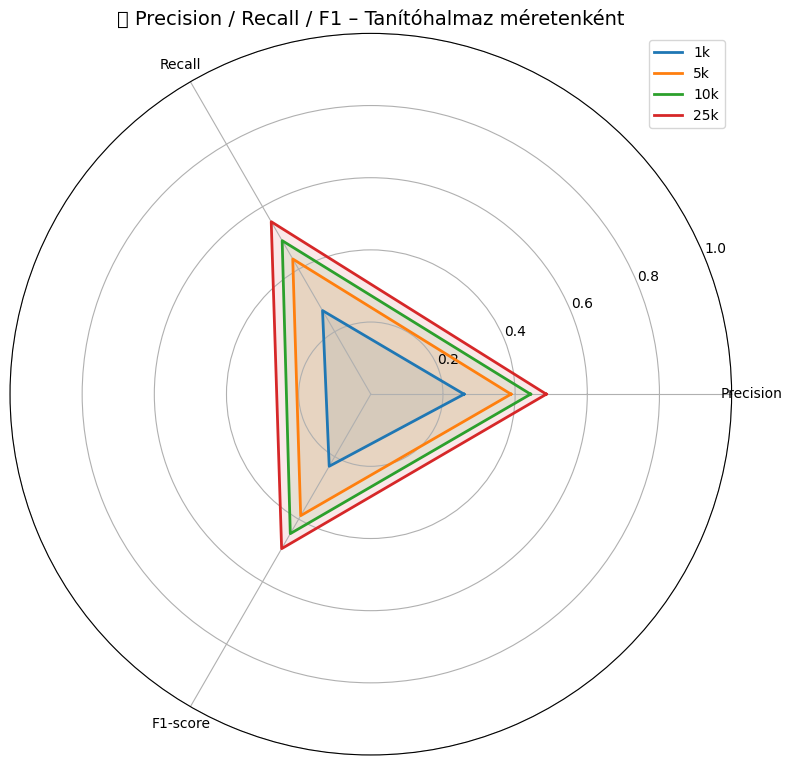

In [ ]:
# 7️⃣ Radar chart – Precision / Recall / F1 különböző méreteknél
import numpy as np
import matplotlib.pyplot as plt

labels = ["Precision", "Recall", "F1-score"]
metrics_1k = [b1_metrics_baseline["precision"], b1_metrics_baseline["recall"], b1_metrics_baseline["f1"]]
metrics_5k = [b5_metrics_baseline["precision"], b5_metrics_baseline["recall"], b5_metrics_baseline["f1"]]
metrics_10k = [b10_metrics_baseline["precision"], b10_metrics_baseline["recall"], b10_metrics_baseline["f1"]]
metrics_25k = [b25_metrics_baseline["precision"], b25_metrics_baseline["recall"], b25_metrics_baseline["f1"]]

# Radar plot setup
angles = np.linspace(0, 2 * np.pi, len(labels), endpoint=False).tolist()
metrics_1k += [metrics_1k[0]]
metrics_5k += [metrics_5k[0]]
metrics_10k += [metrics_10k[0]]
metrics_25k += [metrics_25k[0]]
angles += [angles[0]]

fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))

ax.plot(angles, metrics_1k, label="1k", linewidth=2)
ax.plot(angles, metrics_5k, label="5k", linewidth=2)
ax.plot(angles, metrics_10k, label="10k", linewidth=2)
ax.plot(angles, metrics_25k, label="25k", linewidth=2)

ax.fill(angles, metrics_1k, alpha=0.1)
ax.fill(angles, metrics_5k, alpha=0.1)
ax.fill(angles, metrics_10k, alpha=0.1)
ax.fill(angles, metrics_25k, alpha=0.1)

ax.set_title("📊 Precision / Recall / F1 – Tanítóhalmaz méretenként", size=14)
ax.set_thetagrids(np.degrees(angles[:-1]), labels)
ax.set_ylim(0, 1)
ax.grid(True)
ax.legend(loc="upper right")
plt.tight_layout()
plt.show()


📊 6.5 ResNet18 + Deep head 1k learning


---

[ResNet18-Deep-1k] Epoch 1/10 - val: 100%|██████████| 282/282 [00:16<00:00, 17.27it/s]


📊 [ResNet18-Deep-1k] Epoch 1: Train loss=4.7329, acc=0.0077 | Val loss=4.7134, acc=0.0176


[ResNet18-Deep-1k] Epoch 2/10 - val: 100%|██████████| 282/282 [00:16<00:00, 17.50it/s]


📊 [ResNet18-Deep-1k] Epoch 2: Train loss=4.6134, acc=0.0570 | Val loss=4.6648, acc=0.0311


[ResNet18-Deep-1k] Epoch 3/10 - val: 100%|██████████| 282/282 [00:16<00:00, 17.34it/s]


📊 [ResNet18-Deep-1k] Epoch 3: Train loss=4.5014, acc=0.0998 | Val loss=4.6149, acc=0.0711


[ResNet18-Deep-1k] Epoch 4/10 - val: 100%|██████████| 282/282 [00:16<00:00, 17.32it/s]


📊 [ResNet18-Deep-1k] Epoch 4: Train loss=4.3482, acc=0.1886 | Val loss=4.5323, acc=0.1065


[ResNet18-Deep-1k] Epoch 5/10 - val: 100%|██████████| 282/282 [00:16<00:00, 17.38it/s]


📊 [ResNet18-Deep-1k] Epoch 5: Train loss=4.1654, acc=0.2357 | Val loss=4.4334, acc=0.1314


[ResNet18-Deep-1k] Epoch 6/10 - val: 100%|██████████| 282/282 [00:16<00:00, 17.37it/s]


📊 [ResNet18-Deep-1k] Epoch 6: Train loss=3.9367, acc=0.2544 | Val loss=4.3114, acc=0.1403


[ResNet18-Deep-1k] Epoch 7/10 - val: 100%|██████████| 282/282 [00:15<00:00, 17.87it/s]


📊 [ResNet18-Deep-1k] Epoch 7: Train loss=3.6295, acc=0.3575 | Val loss=4.1782, acc=0.1479


[ResNet18-Deep-1k] Epoch 8/10 - val: 100%|██████████| 282/282 [00:15<00:00, 17.69it/s]


📊 [ResNet18-Deep-1k] Epoch 8: Train loss=3.3596, acc=0.4013 | Val loss=4.0493, acc=0.1599


[ResNet18-Deep-1k] Epoch 9/10 - val: 100%|██████████| 282/282 [00:15<00:00, 17.71it/s]


📊 [ResNet18-Deep-1k] Epoch 9: Train loss=3.0445, acc=0.4539 | Val loss=3.9093, acc=0.1795


[ResNet18-Deep-1k] Epoch 10/10 - val: 100%|██████████| 282/282 [00:15<00:00, 17.85it/s]


📊 [ResNet18-Deep-1k] Epoch 10: Train loss=2.7299, acc=0.5307 | Val loss=3.8021, acc=0.1813


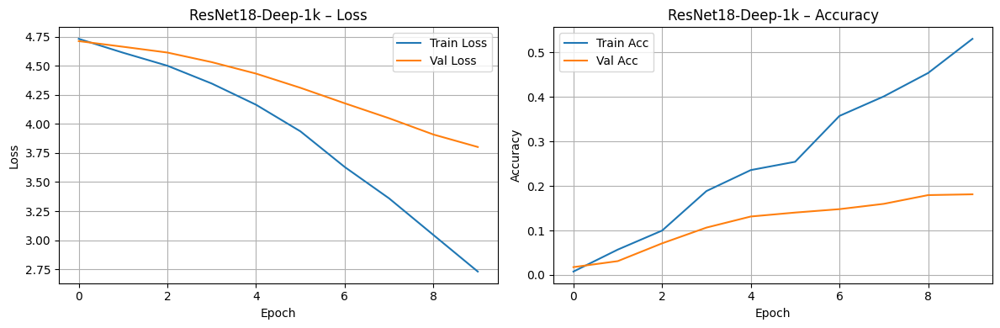

In [ ]:
model_resnet18_deep_1K = get_resnet18_deep()
subset_1k = train_subsets["1000"]
d1_model, d1_train_loss_hist, d1_val_loss_hist, d1_train_acc_hist, d1_val_acc_hist = train_model_on_subset(model_resnet18_deep_1K, "ResNet18-Deep-1k", subset_1k, num_epochs=10, plot_results=True)


📊 6.5 Resnet 18 + Deep head 1k TESTING

In [ ]:
d1_model.eval()
d1_all_preds, d1_all_labels, d1_all_probs = [], [], []

d1_start_time = time.time()

with torch.no_grad():
    for inputs, labels in tqdm(test_loader, desc="🔍 Deep modell 1k – tesztelés"):
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = d1_model(inputs)
        probs = torch.softmax(outputs, dim=1)
        preds = torch.argmax(probs, dim=1)

        d1_all_preds.extend(preds.cpu().numpy())
        d1_all_labels.extend(labels.cpu().numpy())
        d1_all_probs.extend(probs.cpu().numpy())

d1_inference_time_baseline = time.time() - d1_start_time


🔍 Deep modell 1k – tesztelés: 100%|██████████| 284/284 [00:16<00:00, 16.89it/s]


📈 6.5 Resnet 18 + Deep head 1k METRIKÁK

In [ ]:
d1_metrics_baseline = evaluate_metrics(
    np.array(d1_all_labels), np.array(d1_all_preds), np.array(d1_all_probs),
    "ResNet18 + Deep fej 1k", d1_inference_time_baseline
)


🔍 Vizsgálat eredményei (ResNet18 + Deep fej 1k):
✅ Top-1 Accuracy:  0.1796
✅ Top-5 Accuracy:  0.4040
🎯 Precision:       0.2572
🎯 Recall:          0.2252
🎯 F1-score:        0.1683
⏱️ Inference time:  16.82 sec


📈 6.5 Resnet 18 + Deep head 1k Confusion Matrix

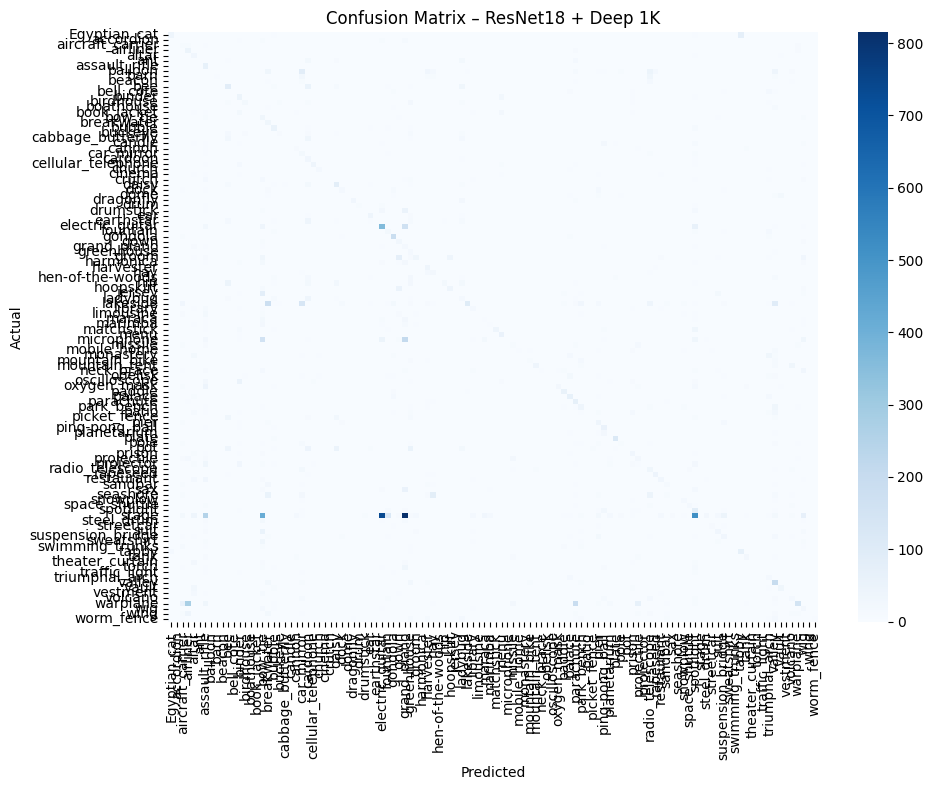

In [ ]:
plot_confusion_matrix(d1_all_labels, d1_all_preds, class_names, "Confusion Matrix – ResNet18 + Deep 1K")

📈 6.5 Resnet 18 + Deep head 1k Confusion Matrix Szebb

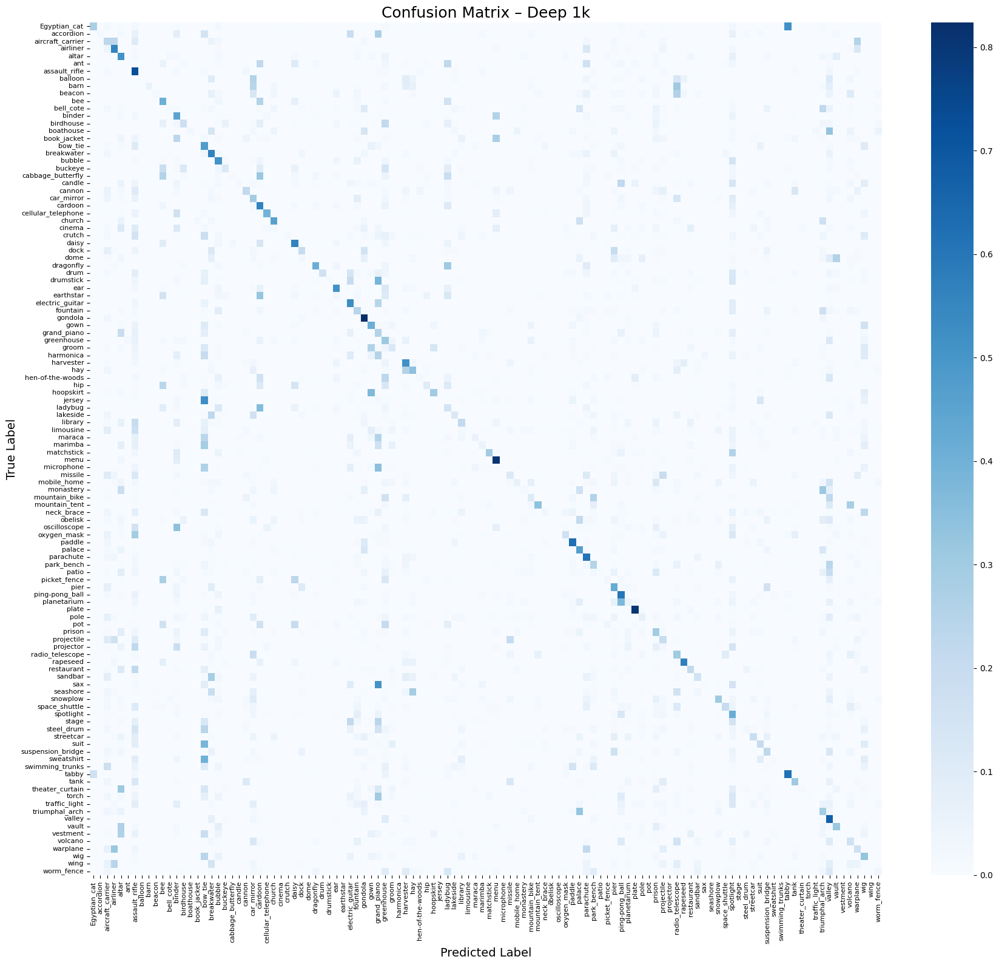

In [ ]:
plot_confusion_matrix_pretty(d1_all_labels, d1_all_preds, class_names, "Confusion Matrix – Deep 1k")

📈 6.5 Resnet 18 + Baseline Deep 1k ADATOK

In [ ]:
print("📋 Deep modell 1k – osztályonkénti metrikák:\n")
d1_df_baseline = export_classification_report(d1_all_labels, d1_all_preds, class_names, "stage_3_resnet18_deep_1k")
display(d1_df_baseline.head())

📋 Deep modell 1k – osztályonkénti metrikák:


📄 Exportálva: stage_3_resnet18_deep_1k


,precision,recall,f1-score,support
Egyptian_cat,0.689655,0.275862,0.394089,145.0
accordion,0.250000,0.021277,0.039216,47.0
aircraft_carrier,0.028939,0.230769,0.051429,39.0
airliner,0.108696,0.562500,0.182186,80.0
altar,0.095847,0.508475,0.161290,59.0


📈 6.5 Resnet 18 + Deep head 1k ADATOK – leggyengébb osztályok

In [ ]:
print_worst_classes(d1_df_baseline, "ResNet18 + Deep 1k fej")


📉 ResNet18 + Deep 1k fej – Top 10 leggyengébb osztály (F1-score alapján):



,precision,recall,f1-score
balloon,0.0,0.0,0.0
ant,0.0,0.0,0.0
book_jacket,0.0,0.0,0.0
dome,0.0,0.0,0.0
cinema,0.0,0.0,0.0
microphone,0.0,0.0,0.0
harmonica,0.0,0.0,0.0
earthstar,0.0,0.0,0.0
jersey,0.0,0.0,0.0
traffic_light,0.0,0.0,0.0


✅ 6.5 GPU memóriahasználat, batch sebesség statisztika

In [ ]:
# --- GPU memóriahasználat ---
gpu_mem_allocated = torch.cuda.memory_allocated() / (1024 ** 3)
gpu_mem_reserved = torch.cuda.memory_reserved() / (1024 ** 3)

print(f"💾 GPU memória (lefoglalt): {gpu_mem_reserved:.2f} GB")
print(f"💾 GPU memória (használt):  {gpu_mem_allocated:.2f} GB")

💾 GPU memória (lefoglalt): 3.83 GB
💾 GPU memória (használt):  0.62 GB


📊 6.6 ResNet18 + Deep head 5k learning


---

[ResNet18-Deep-5k] Epoch 1/10 - val: 100%|██████████| 282/282 [00:16<00:00, 17.52it/s]


📊 [ResNet18-Deep-5k] Epoch 1: Train loss=4.6221, acc=0.0457 | Val loss=4.3560, acc=0.1343


[ResNet18-Deep-5k] Epoch 2/10 - val: 100%|██████████| 282/282 [00:15<00:00, 17.71it/s]


📊 [ResNet18-Deep-5k] Epoch 2: Train loss=4.0263, acc=0.1353 | Val loss=3.5103, acc=0.2004


[ResNet18-Deep-5k] Epoch 3/10 - val: 100%|██████████| 282/282 [00:16<00:00, 17.50it/s]


📊 [ResNet18-Deep-5k] Epoch 3: Train loss=3.2942, acc=0.2150 | Val loss=2.8685, acc=0.3011


[ResNet18-Deep-5k] Epoch 4/10 - val: 100%|██████████| 282/282 [00:16<00:00, 17.32it/s]


📊 [ResNet18-Deep-5k] Epoch 4: Train loss=2.6522, acc=0.3327 | Val loss=2.6159, acc=0.3292


[ResNet18-Deep-5k] Epoch 5/10 - val: 100%|██████████| 282/282 [00:16<00:00, 17.27it/s]


📊 [ResNet18-Deep-5k] Epoch 5: Train loss=2.0985, acc=0.4482 | Val loss=2.6668, acc=0.3209


[ResNet18-Deep-5k] Epoch 6/10 - val: 100%|██████████| 282/282 [00:16<00:00, 17.40it/s]


📊 [ResNet18-Deep-5k] Epoch 6: Train loss=1.5815, acc=0.5849 | Val loss=2.3881, acc=0.3738


[ResNet18-Deep-5k] Epoch 7/10 - val: 100%|██████████| 282/282 [00:16<00:00, 17.50it/s]


📊 [ResNet18-Deep-5k] Epoch 7: Train loss=1.1139, acc=0.7169 | Val loss=2.4890, acc=0.3749


[ResNet18-Deep-5k] Epoch 8/10 - val: 100%|██████████| 282/282 [00:16<00:00, 17.55it/s]


📊 [ResNet18-Deep-5k] Epoch 8: Train loss=0.7443, acc=0.8268 | Val loss=2.4912, acc=0.3768


[ResNet18-Deep-5k] Epoch 9/10 - val: 100%|██████████| 282/282 [00:16<00:00, 17.45it/s]


📊 [ResNet18-Deep-5k] Epoch 9: Train loss=0.4593, acc=0.9123 | Val loss=2.5027, acc=0.3857


[ResNet18-Deep-5k] Epoch 10/10 - val: 100%|██████████| 282/282 [00:16<00:00, 17.59it/s]


📊 [ResNet18-Deep-5k] Epoch 10: Train loss=0.3084, acc=0.9506 | Val loss=2.5369, acc=0.3909


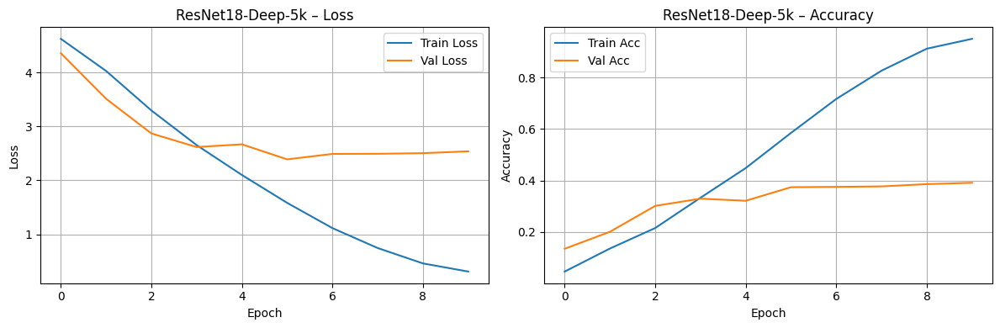

In [ ]:
model_resnet18_deep_5K = get_resnet18_deep()
subset_5k = train_subsets["5000"]
d5_model, d5_train_loss_hist, d5_val_loss_hist, d5_train_acc_hist, d5_val_acc_hist = train_model_on_subset(model_resnet18_deep_5K, "ResNet18-Deep-5k", subset_5k, num_epochs=10, plot_results=True)


📊 6.6 Resnet 18 + Deep head 5k TESTING

In [ ]:
d5_model.eval()
d5_all_preds, d5_all_labels, d5_all_probs = [], [], []

d5_start_time = time.time()

with torch.no_grad():
    for inputs, labels in tqdm(test_loader, desc="🔍 Deep modell 5k – tesztelés"):
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = d5_model(inputs)
        probs = torch.softmax(outputs, dim=1)
        preds = torch.argmax(probs, dim=1)

        d5_all_preds.extend(preds.cpu().numpy())
        d5_all_labels.extend(labels.cpu().numpy())
        d5_all_probs.extend(probs.cpu().numpy())

d5_inference_time_baseline = time.time() - d5_start_time

🔍 Deep modell 5k – tesztelés: 100%|██████████| 284/284 [00:15<00:00, 17.85it/s]


📈 6.6 Resnet 18 + Deep head 5k METRIKÁK

In [ ]:
d5_metrics_baseline = evaluate_metrics(
    np.array(d5_all_labels), np.array(d5_all_preds), np.array(d5_all_probs),
    "ResNet18 + Deep fej 5k", d5_inference_time_baseline
)


🔍 Vizsgálat eredményei (ResNet18 + Deep fej 5k):
✅ Top-1 Accuracy:  0.3973
✅ Top-5 Accuracy:  0.6979
🎯 Precision:       0.3680
🎯 Recall:          0.4073
🎯 F1-score:        0.3666
⏱️ Inference time:  15.92 sec


📈 6.6 Resnet 18 + Deep head 5k Confusion Matrix

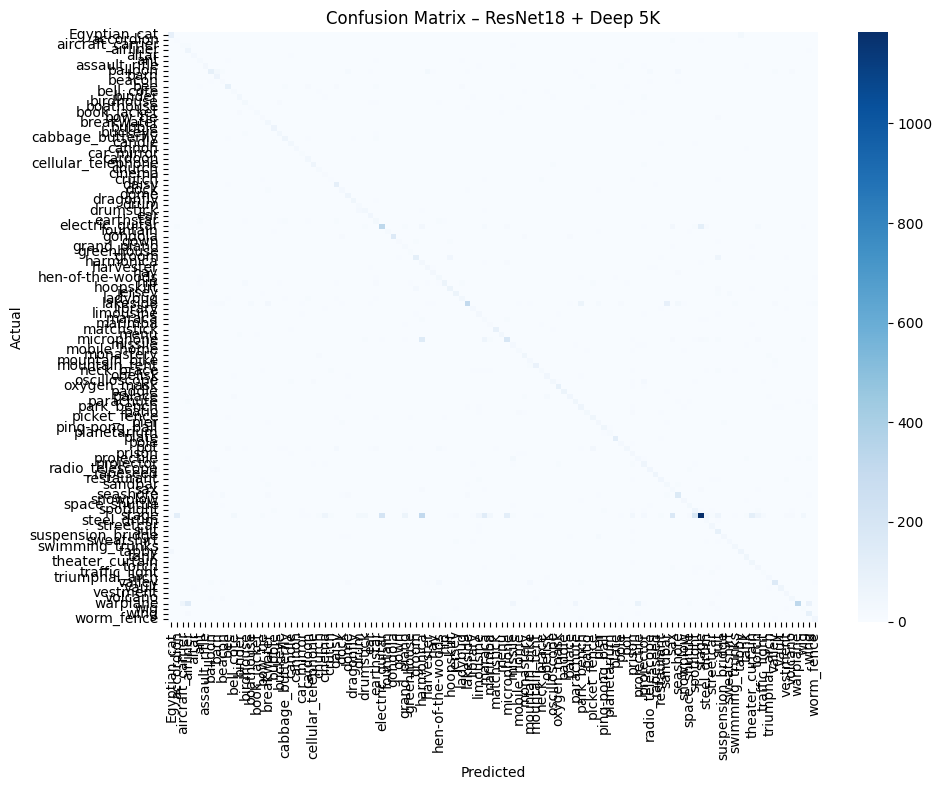

In [ ]:
plot_confusion_matrix(d5_all_labels, d5_all_preds, class_names, "Confusion Matrix – ResNet18 + Deep 5K")

📈 6.6 Resnet 18 + Deep head 5k Confusion Matrix Szebb

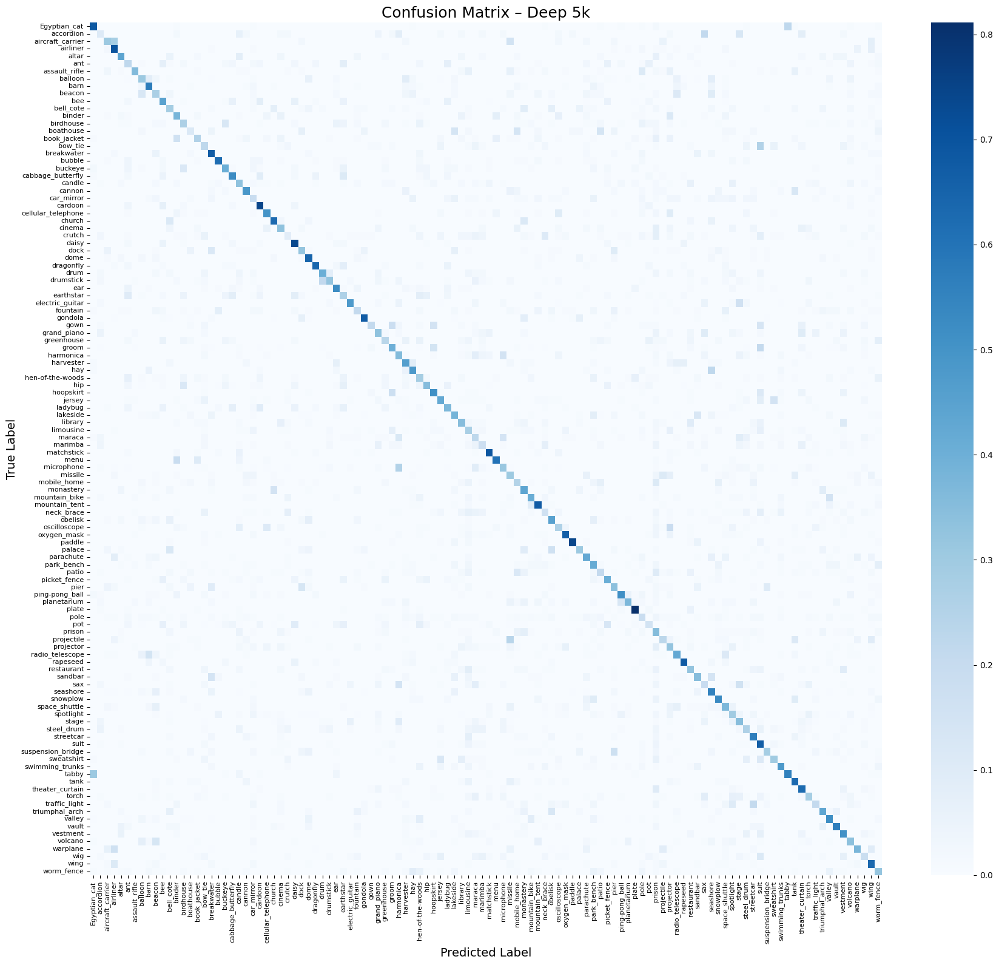

In [ ]:
plot_confusion_matrix_pretty(d5_all_labels, d5_all_preds, class_names, "Confusion Matrix – Deep 5k")

📈 6.6 Resnet 18 + Baseline Deep 5k ADATOK

In [ ]:
print("📋 Deep modell 5k – osztályonkénti metrikák:\n")
d5_df_baseline = export_classification_report(d5_all_labels, d5_all_preds, class_names, "stage_3_resnet18_deep_5k")
display(d5_df_baseline.head())

📋 Deep modell 5k – osztályonkénti metrikák:


📄 Exportálva: stage_3_resnet18_deep_5k


,precision,recall,f1-score,support
Egyptian_cat,0.673469,0.682759,0.678082,145.0
accordion,0.028736,0.106383,0.045249,47.0
aircraft_carrier,0.118812,0.307692,0.171429,39.0
airliner,0.217054,0.700000,0.331361,80.0
altar,0.419355,0.440678,0.429752,59.0


📈 6.6 Resnet 18 + Deep head 5k ADATOK – leggyengébb osztályok

In [ ]:
print_worst_classes(d5_df_baseline, "ResNet18 + Deep 5k fej")


📉 ResNet18 + Deep 5k fej – Top 10 leggyengébb osztály (F1-score alapján):



,precision,recall,f1-score
accordion,0.028736,0.106383,0.045249
maraca,0.063291,0.222222,0.098522
boathouse,0.090909,0.116279,0.102041
harmonica,0.061017,0.360000,0.104348
crutch,0.136364,0.085714,0.105263
sax,0.074324,0.196429,0.107843
car_mirror,0.103175,0.191176,0.134021
marimba,0.113821,0.177215,0.138614
wig,0.116071,0.185714,0.142857
beacon,0.119718,0.274194,0.166667


✅ 6.6 GPU memóriahasználat, batch sebesség statisztika

In [ ]:
# --- GPU memóriahasználat ---
gpu_mem_allocated = torch.cuda.memory_allocated() / (1024 ** 3)
gpu_mem_reserved = torch.cuda.memory_reserved() / (1024 ** 3)

print(f"💾 GPU memória (lefoglalt): {gpu_mem_reserved:.2f} GB")
print(f"💾 GPU memória (használt):  {gpu_mem_allocated:.2f} GB")

💾 GPU memória (lefoglalt): 3.84 GB
💾 GPU memória (használt):  0.71 GB


📊 6.7 ResNet18 + Deep head 10k learning


---


[ResNet18-Deep-10k] Epoch 1/10 - val: 100%|██████████| 282/282 [00:15<00:00, 18.21it/s]


📊 [ResNet18-Deep-10k] Epoch 1: Train loss=4.3726, acc=0.0698 | Val loss=3.5222, acc=0.1620


[ResNet18-Deep-10k] Epoch 2/10 - val: 100%|██████████| 282/282 [00:15<00:00, 18.40it/s]


📊 [ResNet18-Deep-10k] Epoch 2: Train loss=3.2279, acc=0.2149 | Val loss=2.7546, acc=0.2789


[ResNet18-Deep-10k] Epoch 3/10 - val: 100%|██████████| 282/282 [00:15<00:00, 18.13it/s]


📊 [ResNet18-Deep-10k] Epoch 3: Train loss=2.5076, acc=0.3391 | Val loss=2.4576, acc=0.3659


[ResNet18-Deep-10k] Epoch 4/10 - val: 100%|██████████| 282/282 [00:15<00:00, 18.27it/s]


📊 [ResNet18-Deep-10k] Epoch 4: Train loss=1.9226, acc=0.4739 | Val loss=2.3482, acc=0.3996


[ResNet18-Deep-10k] Epoch 5/10 - val: 100%|██████████| 282/282 [00:15<00:00, 18.03it/s]


📊 [ResNet18-Deep-10k] Epoch 5: Train loss=1.3810, acc=0.6147 | Val loss=2.2770, acc=0.4203


[ResNet18-Deep-10k] Epoch 6/10 - val: 100%|██████████| 282/282 [00:15<00:00, 18.35it/s]


📊 [ResNet18-Deep-10k] Epoch 6: Train loss=0.9176, acc=0.7461 | Val loss=2.4418, acc=0.4103


[ResNet18-Deep-10k] Epoch 7/10 - val: 100%|██████████| 282/282 [00:15<00:00, 17.95it/s]


📊 [ResNet18-Deep-10k] Epoch 7: Train loss=0.5818, acc=0.8485 | Val loss=2.4470, acc=0.4418


[ResNet18-Deep-10k] Epoch 8/10 - val: 100%|██████████| 282/282 [00:15<00:00, 17.75it/s]


📊 [ResNet18-Deep-10k] Epoch 8: Train loss=0.3610, acc=0.9178 | Val loss=2.4458, acc=0.4348


[ResNet18-Deep-10k] Epoch 9/10 - val: 100%|██████████| 282/282 [00:16<00:00, 17.27it/s]


📊 [ResNet18-Deep-10k] Epoch 9: Train loss=0.2254, acc=0.9505 | Val loss=2.7053, acc=0.4207


[ResNet18-Deep-10k] Epoch 10/10 - val: 100%|██████████| 282/282 [00:15<00:00, 17.80it/s]


📊 [ResNet18-Deep-10k] Epoch 10: Train loss=0.1564, acc=0.9692 | Val loss=2.6998, acc=0.4346


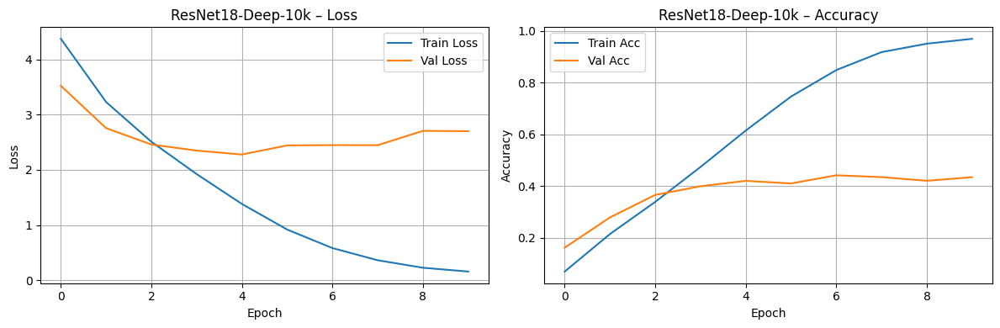

In [ ]:
model_resnet18_deep_10K = get_resnet18_deep()
subset_10k = train_subsets["10000"]
d10_model, d10_train_loss_hist, d10_val_loss_hist, d10_train_acc_hist, d10_val_acc_hist = train_model_on_subset(model_resnet18_deep_10K, "ResNet18-Deep-10k", subset_10k, num_epochs=10, plot_results=True)


📊 6.7 Resnet 18 + Deep head 10k TESTING

In [ ]:
d10_model.eval()
d10_all_preds, d10_all_labels, d10_all_probs = [], [], []

d10_start_time = time.time()

with torch.no_grad():
    for inputs, labels in tqdm(test_loader, desc="🔍 Deep modell 10k – tesztelés"):
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = d10_model(inputs)
        probs = torch.softmax(outputs, dim=1)
        preds = torch.argmax(probs, dim=1)

        d10_all_preds.extend(preds.cpu().numpy())
        d10_all_labels.extend(labels.cpu().numpy())
        d10_all_probs.extend(probs.cpu().numpy())

d10_inference_time_baseline = time.time() - d10_start_time


🔍 Deep modell 10k – tesztelés: 100%|██████████| 284/284 [00:16<00:00, 17.55it/s]


📈 6.7 Resnet 18 + Deep head 10k METRIKÁK

In [ ]:
d10_metrics_baseline = evaluate_metrics(
    np.array(d10_all_labels), np.array(d10_all_preds), np.array(d10_all_probs),
    "ResNet18 + Deep fej 10k", d10_inference_time_baseline
)


🔍 Vizsgálat eredményei (ResNet18 + Deep fej 10k):
✅ Top-1 Accuracy:  0.4419
✅ Top-5 Accuracy:  0.7167
🎯 Precision:       0.4210
🎯 Recall:          0.4651
🎯 F1-score:        0.4211
⏱️ Inference time:  16.19 sec


📈 6.7 Resnet 18 + Deep head 10k Confusion Matrix

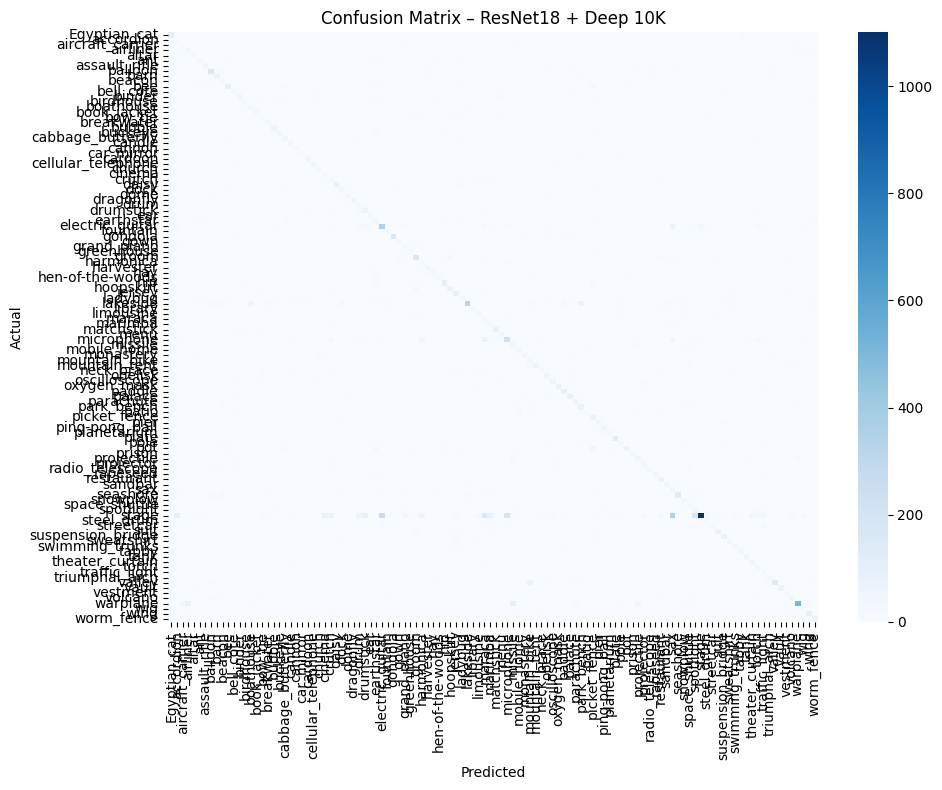

In [ ]:
plot_confusion_matrix(d10_all_labels, d10_all_preds, class_names, "Confusion Matrix – ResNet18 + Deep 10K")

📈 6.7 Resnet 18 + Deep head 10k Confusion Matrix Szebb

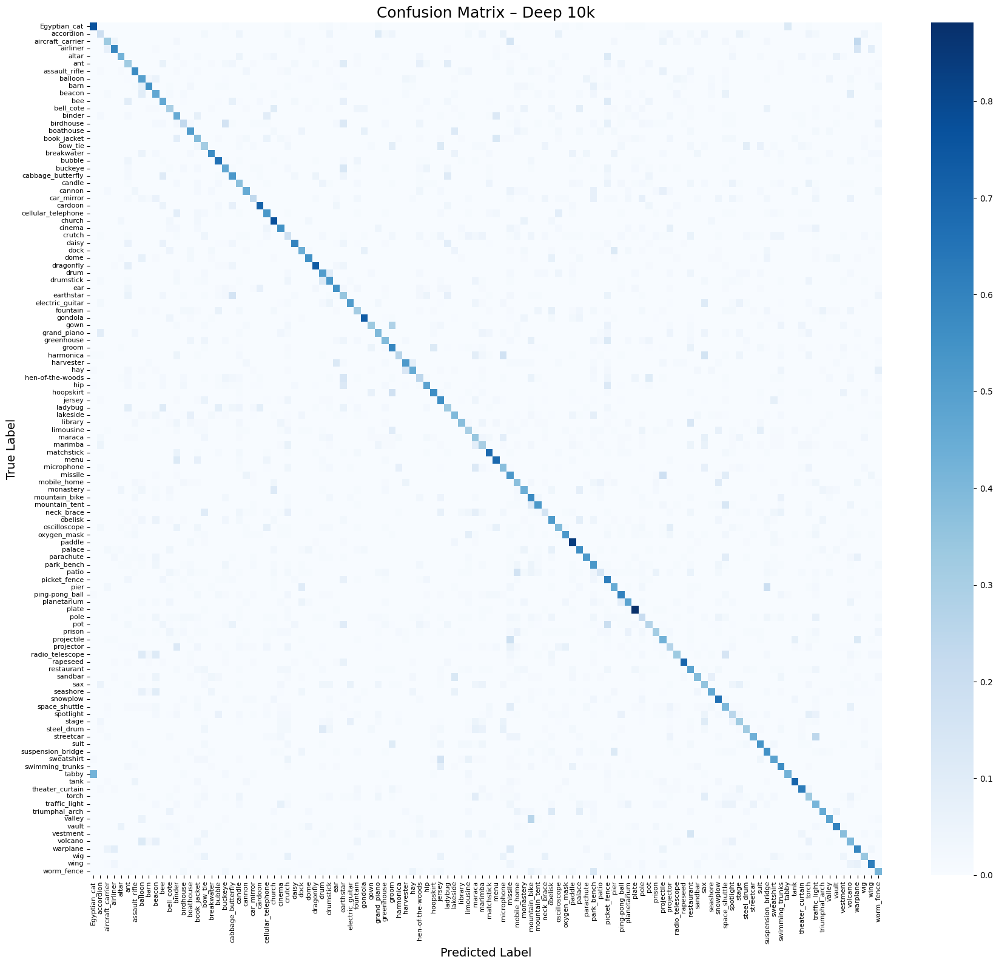

In [ ]:
plot_confusion_matrix_pretty(d10_all_labels, d10_all_preds, class_names, "Confusion Matrix – Deep 10k")

📈 6.7 Resnet 18 + Baseline Deep 10k ADATOK

In [ ]:
print("📋 Deep modell 10k – osztályonkénti metrikák:\n")
d10_df_baseline = export_classification_report(d10_all_labels, d10_all_preds, class_names, "stage_3_resnet18_deep_10k")
display(d10_df_baseline.head())

📋 Deep modell 10k – osztályonkénti metrikák:


📄 Exportálva: stage_3_resnet18_deep_10k


,precision,recall,f1-score,support
Egyptian_cat,0.689441,0.765517,0.725490,145.0
accordion,0.051724,0.191489,0.081448,47.0
aircraft_carrier,0.160494,0.333333,0.216667,39.0
airliner,0.326389,0.587500,0.419643,80.0
altar,0.520833,0.423729,0.467290,59.0


📈 6.7 Resnet 18 + Deep head 10k ADATOK – leggyengébb osztályok

In [ ]:
print_worst_classes(d10_df_baseline, "ResNet18 + Deep 10k fej")


📉 ResNet18 + Deep 10k fej – Top 10 leggyengébb osztály (F1-score alapján):



,precision,recall,f1-score
accordion,0.051724,0.191489,0.081448
crutch,0.078838,0.180952,0.109827
sax,0.068259,0.357143,0.114613
maraca,0.082228,0.344444,0.132762
marimba,0.125654,0.303797,0.177778
patio,0.392157,0.138889,0.205128
spotlight,0.176471,0.252475,0.207739
traffic_light,0.139535,0.413793,0.208696
neck_brace,0.318841,0.160584,0.213592
bow_tie,0.165354,0.313433,0.216495


✅ 6.7 GPU memóriahasználat, batch sebesség statisztika

In [ ]:
# --- GPU memóriahasználat ---
gpu_mem_allocated = torch.cuda.memory_allocated() / (1024 ** 3)
gpu_mem_reserved = torch.cuda.memory_reserved() / (1024 ** 3)

print(f"💾 GPU memória (lefoglalt): {gpu_mem_reserved:.2f} GB")
print(f"💾 GPU memória (használt):  {gpu_mem_allocated:.2f} GB")

💾 GPU memória (lefoglalt): 3.85 GB
💾 GPU memória (használt):  0.80 GB


📊 6.8 ResNet18 + Deep head 25k learning


---

[ResNet18-Deep-25k] Epoch 1/10 - val: 100%|██████████| 282/282 [00:15<00:00, 18.23it/s]


📊 [ResNet18-Deep-25k] Epoch 1: Train loss=3.6364, acc=0.1600 | Val loss=2.6169, acc=0.3358


[ResNet18-Deep-25k] Epoch 2/10 - val: 100%|██████████| 282/282 [00:15<00:00, 17.66it/s]


📊 [ResNet18-Deep-25k] Epoch 2: Train loss=2.4433, acc=0.3538 | Val loss=2.1583, acc=0.4206


[ResNet18-Deep-25k] Epoch 3/10 - val: 100%|██████████| 282/282 [00:15<00:00, 17.76it/s]


📊 [ResNet18-Deep-25k] Epoch 3: Train loss=1.8136, acc=0.5002 | Val loss=2.1214, acc=0.4406


[ResNet18-Deep-25k] Epoch 4/10 - val: 100%|██████████| 282/282 [00:15<00:00, 17.93it/s]


📊 [ResNet18-Deep-25k] Epoch 4: Train loss=1.3192, acc=0.6263 | Val loss=2.0850, acc=0.4729


[ResNet18-Deep-25k] Epoch 5/10 - val: 100%|██████████| 282/282 [00:15<00:00, 17.89it/s]


📊 [ResNet18-Deep-25k] Epoch 5: Train loss=0.8860, acc=0.7446 | Val loss=2.0040, acc=0.4998


[ResNet18-Deep-25k] Epoch 6/10 - val: 100%|██████████| 282/282 [00:16<00:00, 17.11it/s]


📊 [ResNet18-Deep-25k] Epoch 6: Train loss=0.5819, acc=0.8329 | Val loss=2.2884, acc=0.4822


[ResNet18-Deep-25k] Epoch 7/10 - val: 100%|██████████| 282/282 [00:16<00:00, 17.15it/s]


📊 [ResNet18-Deep-25k] Epoch 7: Train loss=0.3892, acc=0.8868 | Val loss=2.6389, acc=0.4640


[ResNet18-Deep-25k] Epoch 8/10 - val: 100%|██████████| 282/282 [00:16<00:00, 17.10it/s]


📊 [ResNet18-Deep-25k] Epoch 8: Train loss=0.2903, acc=0.9184 | Val loss=2.8345, acc=0.4563


[ResNet18-Deep-25k] Epoch 9/10 - val: 100%|██████████| 282/282 [00:16<00:00, 17.23it/s]


📊 [ResNet18-Deep-25k] Epoch 9: Train loss=0.2174, acc=0.9416 | Val loss=2.7148, acc=0.4853


[ResNet18-Deep-25k] Epoch 10/10 - val: 100%|██████████| 282/282 [00:16<00:00, 17.53it/s]


📊 [ResNet18-Deep-25k] Epoch 10: Train loss=0.1521, acc=0.9595 | Val loss=2.8552, acc=0.4923


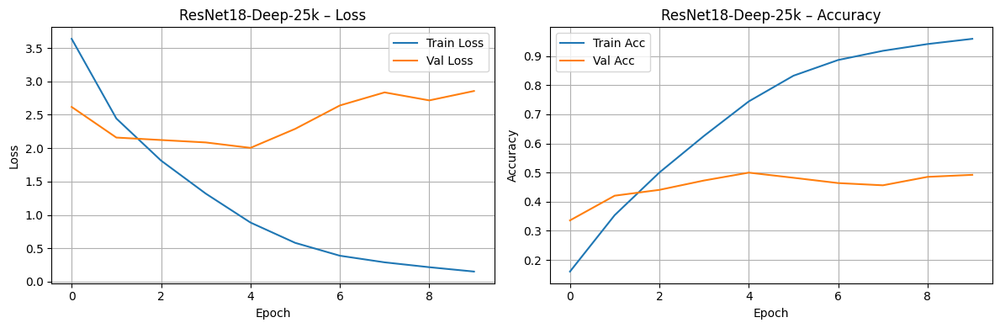

In [ ]:
model_resnet18_deep_25K = get_resnet18_deep()
subset_25k = train_subsets["25000"]
d25_model, d25_train_loss_hist, d25_val_loss_hist, d25_train_acc_hist, d25_val_acc_hist = train_model_on_subset(model_resnet18_deep_25K, "ResNet18-Deep-25k", subset_25k, num_epochs=10, plot_results=True)

📊 6.8 Resnet 18 + Deep head 25k TESTING

In [ ]:
d25_model.eval()
d25_all_preds, d25_all_labels, d25_all_probs = [], [], []

d25_start_time = time.time()

with torch.no_grad():
    for inputs, labels in tqdm(test_loader, desc="🔍 Deep modell 25k – tesztelés"):
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = d25_model(inputs)
        probs = torch.softmax(outputs, dim=1)
        preds = torch.argmax(probs, dim=1)

        d25_all_preds.extend(preds.cpu().numpy())
        d25_all_labels.extend(labels.cpu().numpy())
        d25_all_probs.extend(probs.cpu().numpy())

d25_inference_time_baseline = time.time() - d25_start_time


🔍 Deep modell 25k – tesztelés: 100%|██████████| 284/284 [00:16<00:00, 17.70it/s]


📈 6.8 Resnet 18 + Deep head 25k METRIKÁK

In [ ]:
d25_metrics_baseline = evaluate_metrics(
    np.array(d25_all_labels), np.array(d25_all_preds), np.array(d25_all_probs),
    "ResNet18 + Deep fej 25k", d25_inference_time_baseline
)



🔍 Vizsgálat eredményei (ResNet18 + Deep fej 25k):
✅ Top-1 Accuracy:  0.5046
✅ Top-5 Accuracy:  0.7782
🎯 Precision:       0.4873
🎯 Recall:          0.5486
🎯 F1-score:        0.4995
⏱️ Inference time:  16.05 sec


📈 6.8 Resnet 18 + Deep head 25k Confusion Matrix

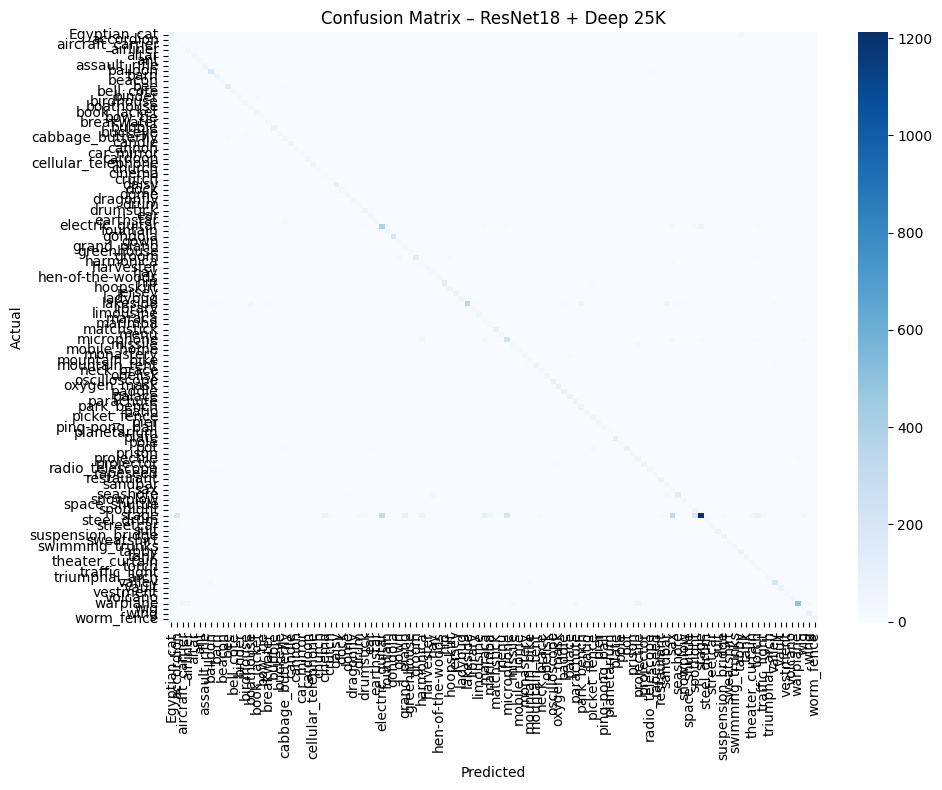

In [ ]:
plot_confusion_matrix(d25_all_labels, d25_all_preds, class_names, "Confusion Matrix – ResNet18 + Deep 25K")

📈 6.8 Resnet 18 + Deep head 25k Confusion Matrix Szebb

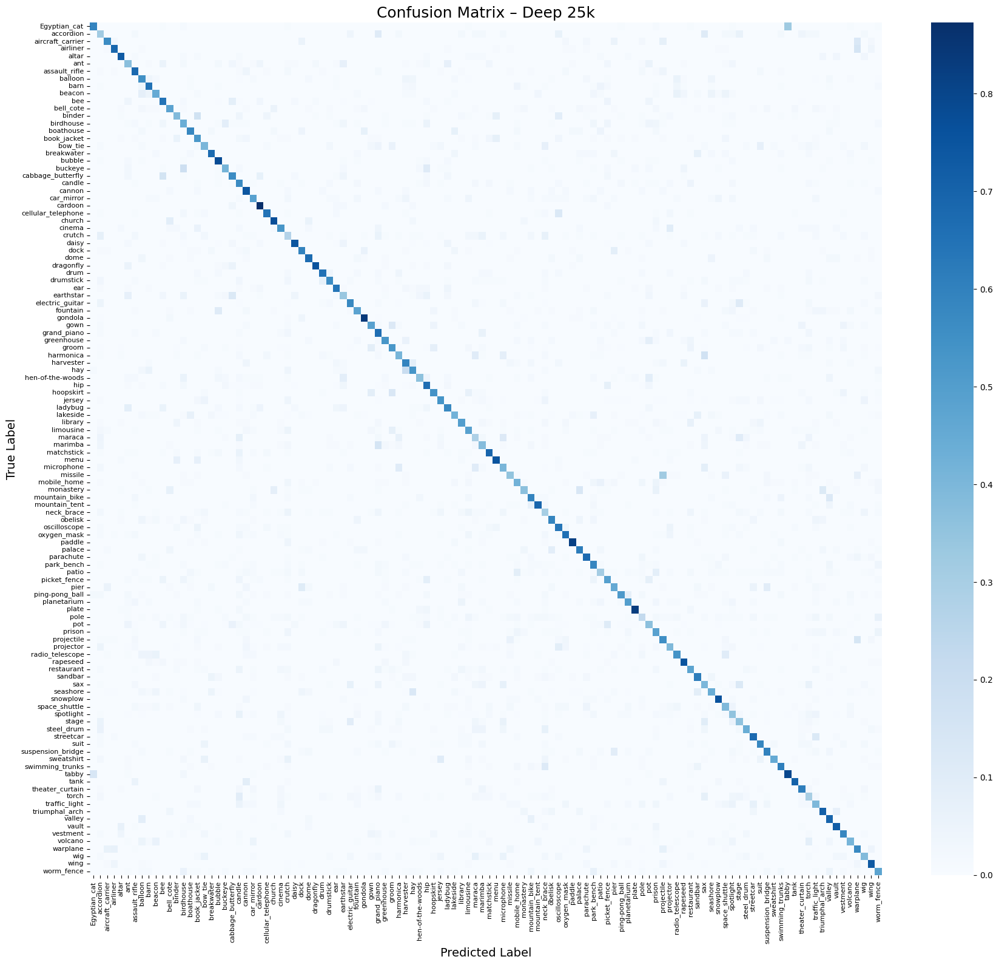

In [ ]:
plot_confusion_matrix_pretty(d25_all_labels, d25_all_preds, class_names, "Confusion Matrix – Deep 25k")

📈 6.8 Resnet 18 + Baseline Deep 25k **ADATOK**

In [ ]:
print("📋 Deep modell 25k – osztályonkénti metrikák:\n")
d25_df_baseline = export_classification_report(d25_all_labels, d25_all_preds, class_names, "stage_3_resnet18_deep_25k")
display(d25_df_baseline.head())

📋 Deep modell 25k – osztályonkénti metrikák:


📄 Exportálva: stage_3_resnet18_deep_25k


,precision,recall,f1-score,support
Egyptian_cat,0.826923,0.593103,0.690763,145.0
accordion,0.044510,0.319149,0.078125,47.0
aircraft_carrier,0.236559,0.564103,0.333333,39.0
airliner,0.436508,0.687500,0.533981,80.0
altar,0.623188,0.728814,0.671875,59.0


📈 6.8 Resnet 18 + Deep head 25k ADATOK – leggyengébb osztályok

In [ ]:
print_worst_classes(d25_df_baseline, "ResNet18 + Deep 25k fej")


📉 ResNet18 + Deep 25k fej – Top 10 leggyengébb osztály (F1-score alapján):



,precision,recall,f1-score
accordion,0.044510,0.319149,0.078125
sax,0.085066,0.401786,0.140406
maraca,0.095238,0.288889,0.143251
torch,0.150215,0.301724,0.200573
crutch,0.179487,0.266667,0.214559
traffic_light,0.178295,0.396552,0.245989
marimba,0.186335,0.379747,0.250000
grand_piano,0.156716,0.666667,0.253776
spotlight,0.203966,0.356436,0.259459
wig,0.200000,0.385714,0.263415


✅ 6.8 GPU memóriahasználat, batch sebesség statisztika

In [ ]:
# --- GPU memóriahasználat ---
gpu_mem_allocated = torch.cuda.memory_allocated() / (1024 ** 3)
gpu_mem_reserved = torch.cuda.memory_reserved() / (1024 ** 3)

print(f"💾 GPU memória (lefoglalt): {gpu_mem_reserved:.2f} GB")
print(f"💾 GPU memória (használt):  {gpu_mem_allocated:.2f} GB")

💾 GPU memória (lefoglalt): 3.86 GB
💾 GPU memória (használt):  0.89 GB


📊 6.8 Resnet 18 + Deep head összesítő statisztikák!


---

<ipython-input-124-a64e4e950d57>:51: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


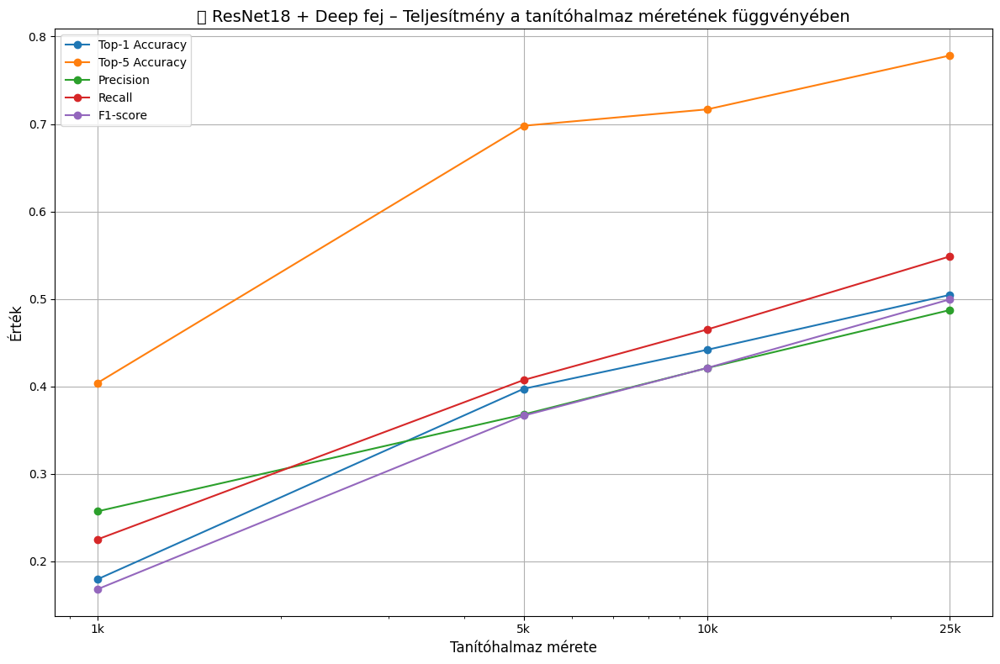

In [ ]:
# --- 📊 Összesített metrikák begyűjtése ---
metric_data = {
    "Train Size": [1000, 5000, 10000, 25000],
    "Top-1 Accuracy": [
        d1_metrics_baseline["top1"],
        d5_metrics_baseline["top1"],
        d10_metrics_baseline["top1"],
        d25_metrics_baseline["top1"]
    ],
    "Top-5 Accuracy": [
        d1_metrics_baseline["top5"],
        d5_metrics_baseline["top5"],
        d10_metrics_baseline["top5"],
        d25_metrics_baseline["top5"]
    ],
    "Precision": [
        d1_metrics_baseline["precision"],
        d5_metrics_baseline["precision"],
        d10_metrics_baseline["precision"],
        d25_metrics_baseline["precision"]
    ],
    "Recall": [
        d1_metrics_baseline["recall"],
        d5_metrics_baseline["recall"],
        d10_metrics_baseline["recall"],
        d25_metrics_baseline["recall"]
    ],
    "F1-score": [
        d1_metrics_baseline["f1"],
        d5_metrics_baseline["f1"],
        d10_metrics_baseline["f1"],
        d25_metrics_baseline["f1"]
    ]
}

# --- 📊 DataFrame-be rendezés ---
df_metrics = pd.DataFrame(metric_data)

# --- 📈 Grafikon rajzolása ---
plt.figure(figsize=(12, 8))
for metric in ["Top-1 Accuracy", "Top-5 Accuracy", "Precision", "Recall", "F1-score"]:
    plt.plot(df_metrics["Train Size"], df_metrics[metric], marker='o', label=metric)

plt.title("📊 ResNet18 + Deep fej – Teljesítmény a tanítóhalmaz méretének függvényében", fontsize=14)
plt.xlabel("Tanítóhalmaz mérete", fontsize=12)
plt.ylabel("Érték", fontsize=12)
plt.xscale("log")
plt.xticks(df_metrics["Train Size"], labels=[f"{int(x/1000)}k" for x in df_metrics["Train Size"]])
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

<ipython-input-125-0c13a07b024b>:41: UserWarning: Glyph 128201 (\N{CHART WITH DOWNWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-125-0c13a07b024b>:41: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128201 (\N{CHART WITH DOWNWARDS TREND}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


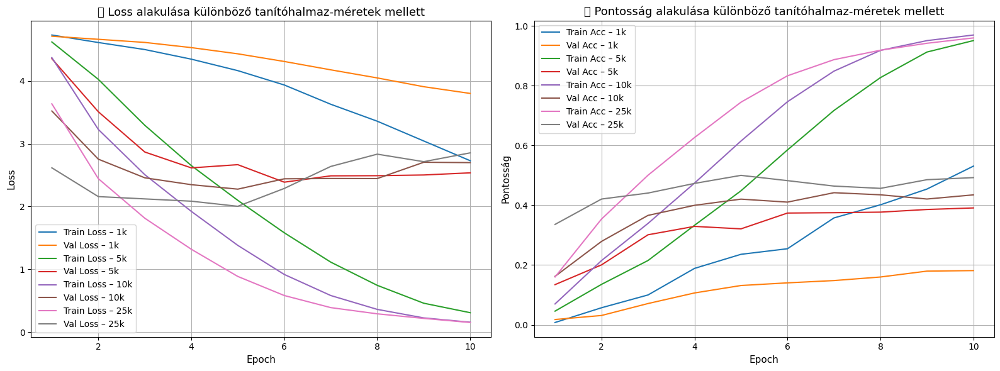

In [ ]:
import matplotlib.pyplot as plt

# --- Epoch tengely ---
epochs = list(range(1, len(d1_train_loss_hist) + 1))

# --- 🎨 Ábra beállítás ---
plt.figure(figsize=(16, 6))

# --- 📉 Loss görbék ---
plt.subplot(1, 2, 1)
plt.plot(epochs, d1_train_loss_hist, label="Train Loss – 1k")
plt.plot(epochs, d1_val_loss_hist, label="Val Loss – 1k")
plt.plot(epochs, d5_train_loss_hist, label="Train Loss – 5k")
plt.plot(epochs, d5_val_loss_hist, label="Val Loss – 5k")
plt.plot(epochs, d10_train_loss_hist, label="Train Loss – 10k")
plt.plot(epochs, d10_val_loss_hist, label="Val Loss – 10k")
plt.plot(epochs, d25_train_loss_hist, label="Train Loss – 25k")
plt.plot(epochs, d25_val_loss_hist, label="Val Loss – 25k")
plt.title("📉 Loss alakulása különböző tanítóhalmaz-méretek mellett", fontsize=13)
plt.xlabel("Epoch", fontsize=11)
plt.ylabel("Loss", fontsize=11)
plt.legend()
plt.grid(True)

# --- 📈 Accuracy görbék ---
plt.subplot(1, 2, 2)
plt.plot(epochs, d1_train_acc_hist, label="Train Acc – 1k")
plt.plot(epochs, d1_val_acc_hist, label="Val Acc – 1k")
plt.plot(epochs, d5_train_acc_hist, label="Train Acc – 5k")
plt.plot(epochs, d5_val_acc_hist, label="Val Acc – 5k")
plt.plot(epochs, d10_train_acc_hist, label="Train Acc – 10k")
plt.plot(epochs, d10_val_acc_hist, label="Val Acc – 10k")
plt.plot(epochs, d25_train_acc_hist, label="Train Acc – 25k")
plt.plot(epochs, d25_val_acc_hist, label="Val Acc – 25k")
plt.title("📈 Pontosság alakulása különböző tanítóhalmaz-méretek mellett", fontsize=13)
plt.xlabel("Epoch", fontsize=11)
plt.ylabel("Pontosság", fontsize=11)
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

<ipython-input-126-0436efac6acf>:25: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


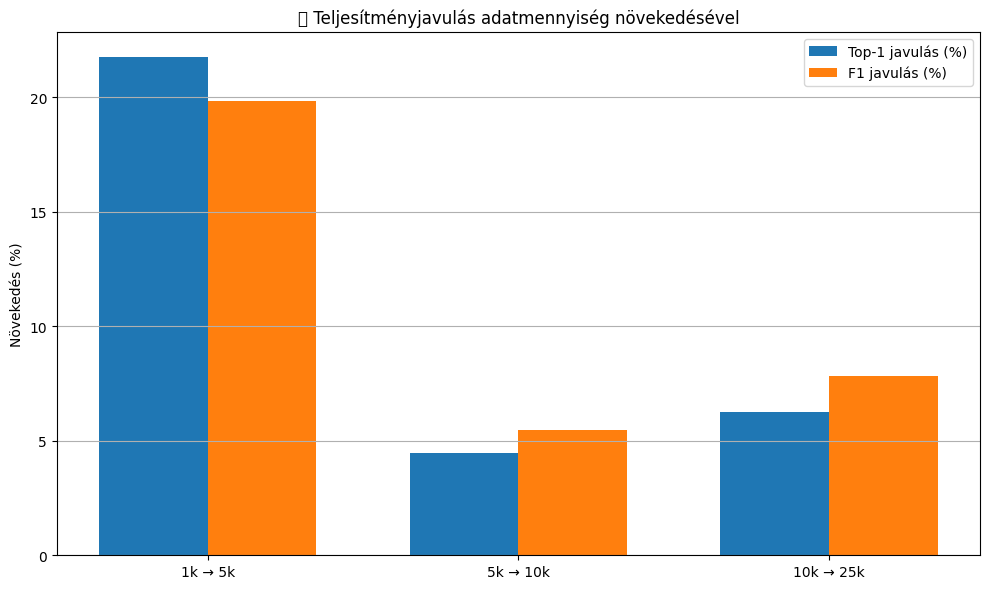

In [ ]:
# 4️⃣ Metrikák arányos növekedése (pl. megtérülés-elemzés)
import matplotlib.pyplot as plt
import numpy as np

train_sizes = [1000, 5000, 10000, 25000]
top1s  = [d1_metrics_baseline["top1"], d5_metrics_baseline["top1"], d10_metrics_baseline["top1"], d25_metrics_baseline["top1"]]
f1s    = [d1_metrics_baseline["f1"],   d5_metrics_baseline["f1"],   d10_metrics_baseline["f1"],   d25_metrics_baseline["f1"]]

top1_gains = [100 * (b - a) for a, b in zip(top1s[:-1], top1s[1:])]
f1_gains   = [100 * (b - a) for a, b in zip(f1s[:-1],   f1s[1:])]

labels = ["1k → 5k", "5k → 10k", "10k → 25k"]
x = np.arange(len(labels))
width = 0.35

plt.figure(figsize=(10, 6))
plt.bar(x - width/2, top1_gains, width, label='Top-1 javulás (%)')
plt.bar(x + width/2, f1_gains, width, label='F1 javulás (%)')

plt.ylabel('Növekedés (%)')
plt.title('📈 Teljesítményjavulás adatmennyiség növekedésével')
plt.xticks(x, labels)
plt.legend()
plt.grid(axis='y')
plt.tight_layout()
plt.show()

<ipython-input-127-0b63d4fba5c3>:19: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0, 0, 1, 0.95])
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


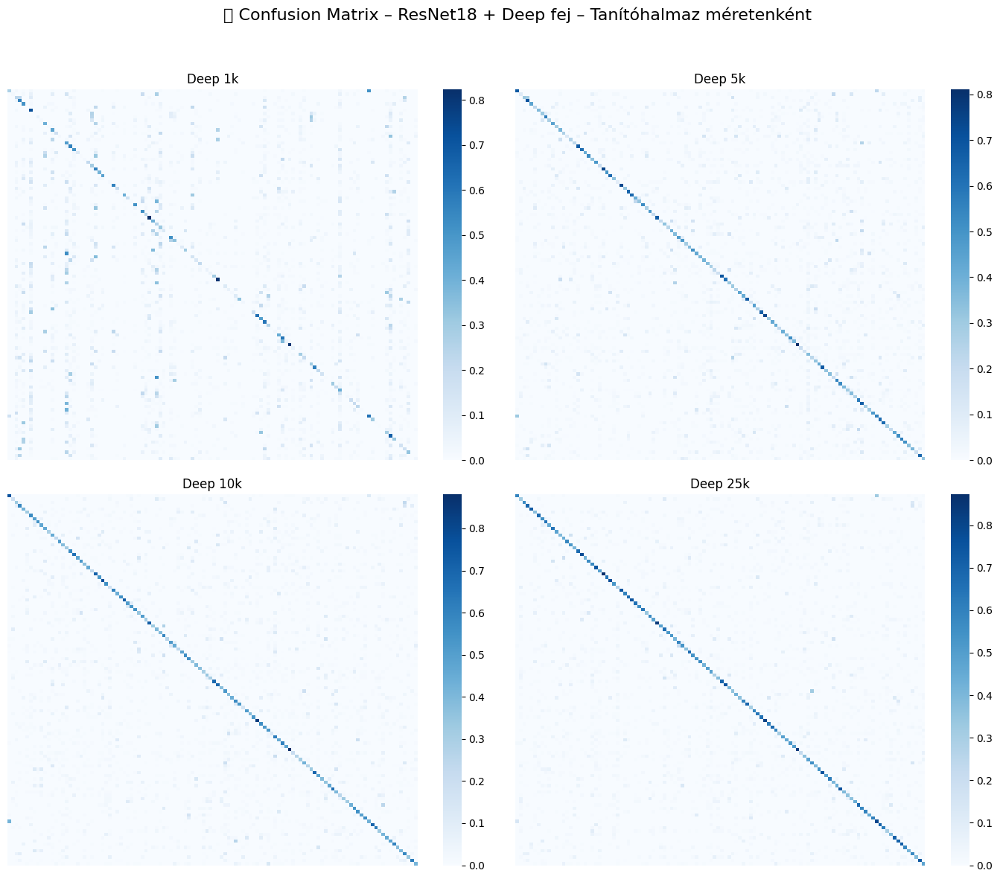

In [ ]:
# 5️⃣ Confusion Matrix összehasonlító ábra – szépített 2x2-ben, kicsiben
fig, axes = plt.subplots(2, 2, figsize=(14, 12))

# Egyedi subplotokba ágyazás
plt.sca(axes[0, 0])
plot_confusion_matrix_pretty(d1_all_labels, d1_all_preds, class_names, "Deep 1k", show=False, small=True)

plt.sca(axes[0, 1])
plot_confusion_matrix_pretty(d5_all_labels, d5_all_preds, class_names, "Deep 5k", show=False, small=True)

plt.sca(axes[1, 0])
plot_confusion_matrix_pretty(d10_all_labels, d10_all_preds, class_names, "Deep 10k", show=False, small=True)

plt.sca(axes[1, 1])
plot_confusion_matrix_pretty(d25_all_labels, d25_all_preds, class_names, "Deep 25k", show=False, small=True)

# Közös cím
plt.suptitle("📊 Confusion Matrix – ResNet18 + Deep fej – Tanítóhalmaz méretenként", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

In [ ]:
# 6️⃣ Leggyengébb osztályok F1-score alakulása
def extract_worst_f1(df, top_n=5):
    df = df.reset_index().rename(columns={"index": "class"})
    return df.sort_values("f1-score").head(top_n)[["class", "f1-score"]].reset_index(drop=True)

worst_1k  = extract_worst_f1(d1_df_baseline)
worst_5k  = extract_worst_f1(d5_df_baseline)
worst_10k = extract_worst_f1(d10_df_baseline)
worst_25k = extract_worst_f1(d25_df_baseline)

# Keresztösszehasonlítás (az 1k legrosszabb osztályait követjük végig)
common_classes = worst_1k["class"].tolist()

rows = []
for cls in common_classes:
    row = {"class": cls}
    for label, df in [("1k", b1_df_baseline), ("5k", b5_df_baseline), ("10k", b10_df_baseline), ("25k", b25_df_baseline)]:
        df_ = df.reset_index().rename(columns={"index": "class"})  # 🧠 Itt a javítás!
        f1 = df_[df_["class"] == cls]["f1-score"].values[0] if cls in df_["class"].values else np.nan
        row[f"F1-{label}"] = f1
    rows.append(row)

import pandas as pd
df_worst = pd.DataFrame(rows)
print("📋 Leggyengébb osztályok alakulása F1-score alapján:")
display(df_worst)

📋 Leggyengébb osztályok alakulása F1-score alapján:


,class,F1-1k,F1-5k,F1-10k,F1-25k
0,balloon,0.207940,0.488818,0.542373,0.502712
1,ant,0.099448,0.262411,0.336364,0.413462
2,book_jacket,0.161137,0.306931,0.373832,0.390000
3,dome,0.048387,0.387097,0.553672,0.574257
4,cinema,0.000000,0.233129,0.317073,0.277512


<ipython-input-129-49429f11bf8f>:36: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


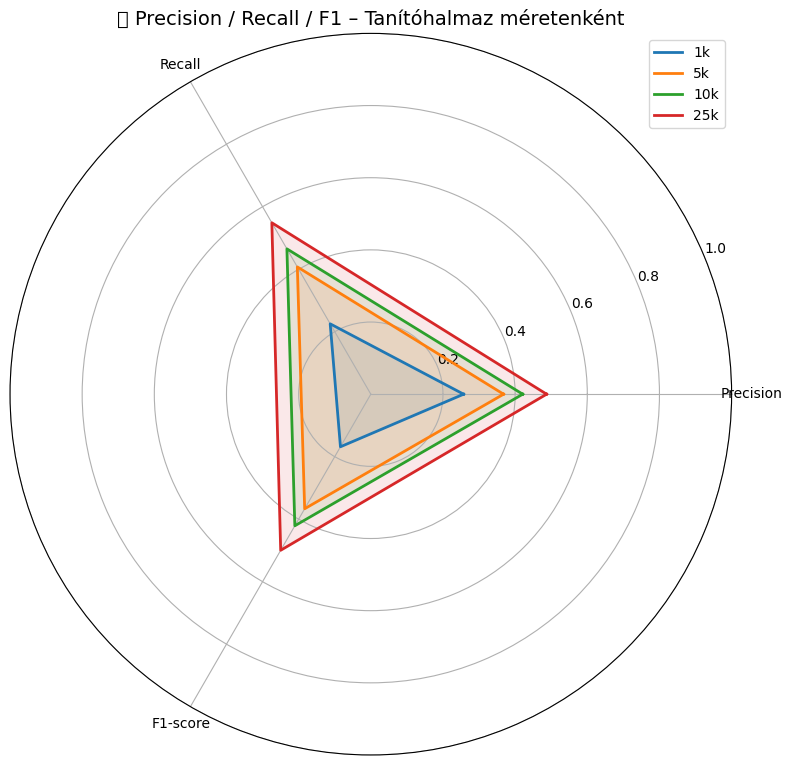

In [ ]:
# 7️⃣ Radar chart – Precision / Recall / F1 különböző méreteknél
import numpy as np
import matplotlib.pyplot as plt

labels = ["Precision", "Recall", "F1-score"]
metrics_1k  = [d1_metrics_baseline["precision"],  d1_metrics_baseline["recall"],  d1_metrics_baseline["f1"]]
metrics_5k  = [d5_metrics_baseline["precision"],  d5_metrics_baseline["recall"],  d5_metrics_baseline["f1"]]
metrics_10k = [d10_metrics_baseline["precision"], d10_metrics_baseline["recall"], d10_metrics_baseline["f1"]]
metrics_25k = [d25_metrics_baseline["precision"], d25_metrics_baseline["recall"], d25_metrics_baseline["f1"]]

# Radar plot setup
angles = np.linspace(0, 2 * np.pi, len(labels), endpoint=False).tolist()
metrics_1k  += [metrics_1k[0]]
metrics_5k  += [metrics_5k[0]]
metrics_10k += [metrics_10k[0]]
metrics_25k += [metrics_25k[0]]
angles += [angles[0]]

fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))

ax.plot(angles, metrics_1k, label="1k", linewidth=2)
ax.plot(angles, metrics_5k, label="5k", linewidth=2)
ax.plot(angles, metrics_10k, label="10k", linewidth=2)
ax.plot(angles, metrics_25k, label="25k", linewidth=2)

ax.fill(angles, metrics_1k, alpha=0.1)
ax.fill(angles, metrics_5k, alpha=0.1)
ax.fill(angles, metrics_10k, alpha=0.1)
ax.fill(angles, metrics_25k, alpha=0.1)

ax.set_title("📊 Precision / Recall / F1 – Tanítóhalmaz méretenként", size=14)
ax.set_thetagrids(np.degrees(angles[:-1]), labels)
ax.set_ylim(0, 1)
ax.grid(True)
ax.legend(loc="upper right")
plt.tight_layout()
plt.show()

📊 6.9 ResNet18 + Hybrid head 1k learning


---

[ResNet18-Hybrid-1k] Epoch 1/10 - val: 100%|██████████| 282/282 [00:15<00:00, 17.95it/s]


📊 [ResNet18-Hybrid-1k] Epoch 1: Train loss=4.7299, acc=0.0230 | Val loss=4.5660, acc=0.0499


[ResNet18-Hybrid-1k] Epoch 2/10 - val: 100%|██████████| 282/282 [00:15<00:00, 18.25it/s]


📊 [ResNet18-Hybrid-1k] Epoch 2: Train loss=3.9660, acc=0.4309 | Val loss=4.3361, acc=0.1201


[ResNet18-Hybrid-1k] Epoch 3/10 - val: 100%|██████████| 282/282 [00:15<00:00, 17.91it/s]


📊 [ResNet18-Hybrid-1k] Epoch 3: Train loss=3.3336, acc=0.8235 | Val loss=4.1940, acc=0.1688


[ResNet18-Hybrid-1k] Epoch 4/10 - val: 100%|██████████| 282/282 [00:15<00:00, 17.91it/s]


📊 [ResNet18-Hybrid-1k] Epoch 4: Train loss=2.7771, acc=0.9660 | Val loss=4.1405, acc=0.1896


[ResNet18-Hybrid-1k] Epoch 5/10 - val: 100%|██████████| 282/282 [00:15<00:00, 17.67it/s]


📊 [ResNet18-Hybrid-1k] Epoch 5: Train loss=2.3037, acc=0.9890 | Val loss=4.0717, acc=0.2070


[ResNet18-Hybrid-1k] Epoch 6/10 - val: 100%|██████████| 282/282 [00:15<00:00, 17.96it/s]


📊 [ResNet18-Hybrid-1k] Epoch 6: Train loss=1.9177, acc=0.9967 | Val loss=4.0273, acc=0.2126


[ResNet18-Hybrid-1k] Epoch 7/10 - val: 100%|██████████| 282/282 [00:15<00:00, 17.93it/s]


📊 [ResNet18-Hybrid-1k] Epoch 7: Train loss=1.6074, acc=0.9989 | Val loss=4.0018, acc=0.2222


[ResNet18-Hybrid-1k] Epoch 8/10 - val: 100%|██████████| 282/282 [00:15<00:00, 17.99it/s]


📊 [ResNet18-Hybrid-1k] Epoch 8: Train loss=1.3600, acc=1.0000 | Val loss=3.9713, acc=0.2234


[ResNet18-Hybrid-1k] Epoch 9/10 - val: 100%|██████████| 282/282 [00:15<00:00, 17.86it/s]


📊 [ResNet18-Hybrid-1k] Epoch 9: Train loss=1.1531, acc=1.0000 | Val loss=3.9463, acc=0.2256


[ResNet18-Hybrid-1k] Epoch 10/10 - val: 100%|██████████| 282/282 [00:16<00:00, 17.55it/s]


📊 [ResNet18-Hybrid-1k] Epoch 10: Train loss=0.9737, acc=1.0000 | Val loss=3.9282, acc=0.2289


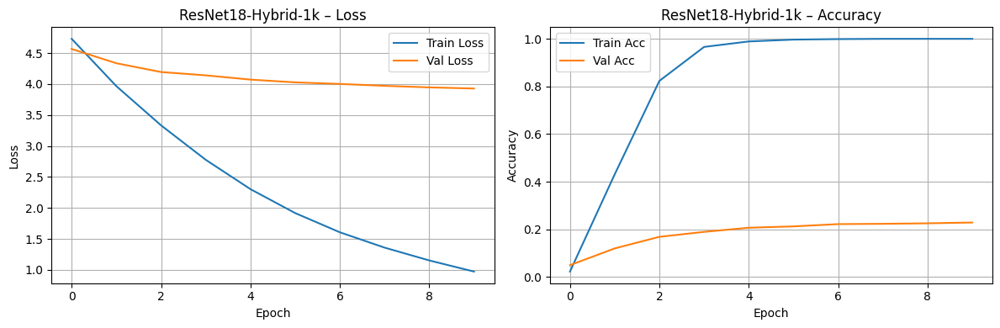

In [ ]:
model_resnet18_hybrid_1K = get_resnet18_hybrid()
subset_1k = train_subsets["1000"]
h1_model, h1_train_loss_hist, h1_val_loss_hist, h1_train_acc_hist, h1_val_acc_hist = train_model_on_subset(model_resnet18_hybrid_1K, "ResNet18-Hybrid-1k", subset_1k, num_epochs=10, plot_results=True)

📊 6.9 Resnet 18 + Hybrid head 5k TESTING

In [ ]:
h1_model.eval()
h1_all_preds, h1_all_labels, h1_all_probs = [], [], []

h1_start_time = time.time()

with torch.no_grad():
    for inputs, labels in tqdm(test_loader, desc="🔍 Hybrid modell 1k – tesztelés"):
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = h1_model(inputs)
        probs = torch.softmax(outputs, dim=1)
        preds = torch.argmax(probs, dim=1)

        h1_all_preds.extend(preds.cpu().numpy())
        h1_all_labels.extend(labels.cpu().numpy())
        h1_all_probs.extend(probs.cpu().numpy())

h1_inference_time_baseline = time.time() - h1_start_time

🔍 Hybrid modell 1k – tesztelés: 100%|██████████| 284/284 [00:15<00:00, 18.00it/s]


📈 6.9 Resnet 18 + Hybrid head 1k METRIKÁK

In [ ]:
h1_metrics_baseline = evaluate_metrics(
    np.array(h1_all_labels), np.array(h1_all_preds), np.array(h1_all_probs),
    "ResNet18 + Hybrid fej 1k", h1_inference_time_baseline
)


🔍 Vizsgálat eredményei (ResNet18 + Hybrid fej 1k):
✅ Top-1 Accuracy:  0.2288
✅ Top-5 Accuracy:  0.4398
🎯 Precision:       0.2143
🎯 Recall:          0.2491
🎯 F1-score:        0.2100
⏱️ Inference time:  15.78 sec


📈 6.9 Resnet 18 + Hybrid head 1k Confusion Matrix

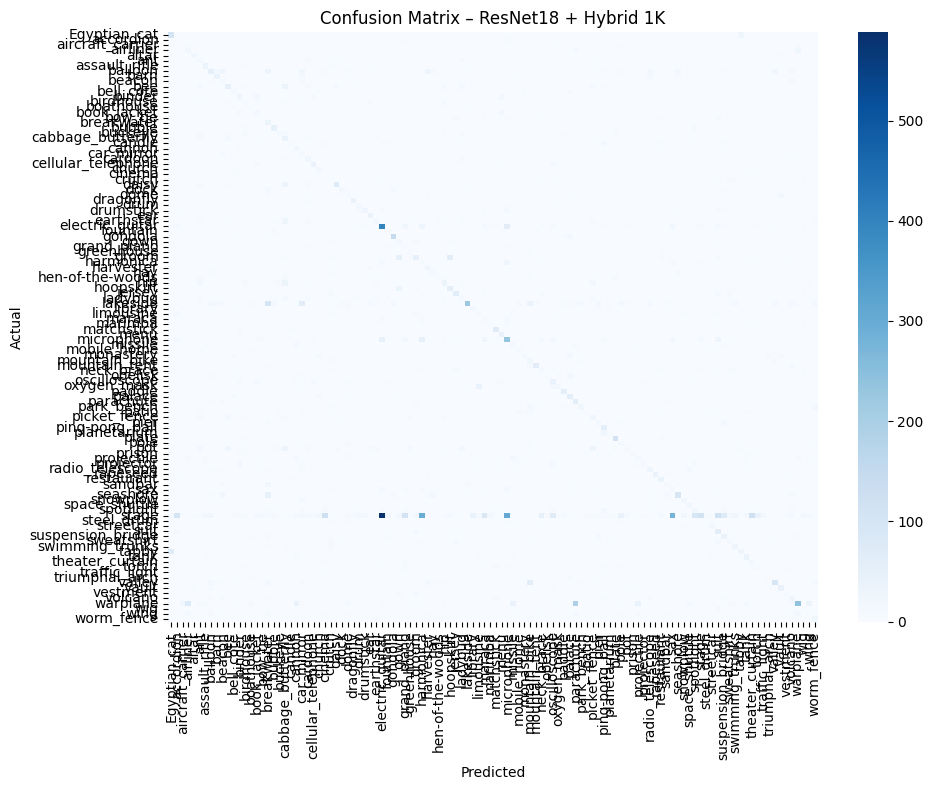

In [ ]:
plot_confusion_matrix(h1_all_labels, h1_all_preds, class_names, "Confusion Matrix – ResNet18 + Hybrid 1K")

📈 6.9 Resnet 18 + Hybrid head 1k Confusion Matrix Szebb

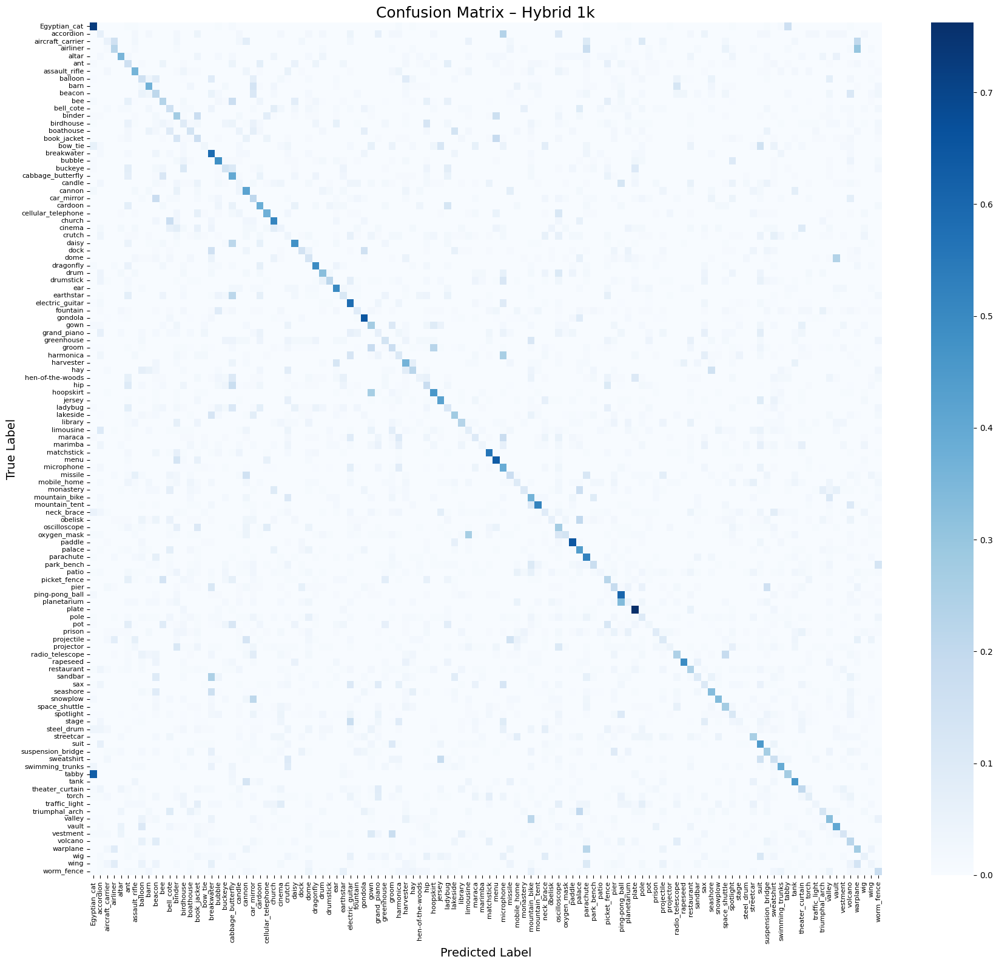

In [ ]:
plot_confusion_matrix_pretty(h1_all_labels, h1_all_preds, class_names, "Confusion Matrix – Hybrid 1k")

📈 6.9 Resnet 18 + Hybrid 1k ADATOK

In [ ]:
print("📋 Hybrid modell 1k – osztályonkénti metrikák:\n")
h1_df_baseline = export_classification_report(h1_all_labels, h1_all_preds, class_names, "stage_3_resnet18_hybrid_1k")
display(h1_df_baseline.head())

📋 Hybrid modell 1k – osztályonkénti metrikák:


📄 Exportálva: stage_3_resnet18_hybrid_1k


,precision,recall,f1-score,support
Egyptian_cat,0.444915,0.724138,0.551181,145.0
accordion,0.013393,0.063830,0.022140,47.0
aircraft_carrier,0.034483,0.051282,0.041237,39.0
airliner,0.133333,0.225000,0.167442,80.0
altar,0.355932,0.355932,0.355932,59.0


📈 6.9 Resnet 18 + Hybrid head 1k ADATOK – leggyengébb osztályok

In [ ]:
print_worst_classes(h1_df_baseline, "ResNet18 + Hybrid 1k fej")


📉 ResNet18 + Hybrid 1k fej – Top 10 leggyengébb osztály (F1-score alapján):



,precision,recall,f1-score
cinema,0.010204,0.039216,0.016194
steel_drum,0.027027,0.011905,0.016529
accordion,0.013393,0.063830,0.022140
grand_piano,0.017544,0.063492,0.027491
crutch,0.029412,0.038095,0.033195
bow_tie,0.041667,0.029851,0.034783
planetarium,0.032609,0.048387,0.038961
harmonica,0.024017,0.110000,0.039427
traffic_light,0.050000,0.034483,0.040816
wing,0.052083,0.033784,0.040984


✅ 6.9 GPU memóriahasználat, batch sebesség statisztika

In [ ]:
# --- GPU memóriahasználat ---
gpu_mem_allocated = torch.cuda.memory_allocated() / (1024 ** 3)
gpu_mem_reserved = torch.cuda.memory_reserved() / (1024 ** 3)

print(f"💾 GPU memória (lefoglalt): {gpu_mem_reserved:.2f} GB")
print(f"💾 GPU memória (használt):  {gpu_mem_allocated:.2f} GB")

💾 GPU memória (lefoglalt): 3.87 GB
💾 GPU memória (használt):  0.97 GB


📊 6.10 ResNet18 + Hybrid head 5k learning


---


[ResNet18-Hybrid-5k] Epoch 1/10 - val: 100%|██████████| 282/282 [00:16<00:00, 17.47it/s]


📊 [ResNet18-Hybrid-5k] Epoch 1: Train loss=4.2716, acc=0.1414 | Val loss=3.7087, acc=0.3083


[ResNet18-Hybrid-5k] Epoch 2/10 - val: 100%|██████████| 282/282 [00:16<00:00, 17.31it/s]


📊 [ResNet18-Hybrid-5k] Epoch 2: Train loss=3.2577, acc=0.4663 | Val loss=3.3079, acc=0.3720


[ResNet18-Hybrid-5k] Epoch 3/10 - val: 100%|██████████| 282/282 [00:16<00:00, 17.48it/s]


📊 [ResNet18-Hybrid-5k] Epoch 3: Train loss=2.4950, acc=0.7026 | Val loss=3.0137, acc=0.4062


[ResNet18-Hybrid-5k] Epoch 4/10 - val: 100%|██████████| 282/282 [00:16<00:00, 17.41it/s]


📊 [ResNet18-Hybrid-5k] Epoch 4: Train loss=1.7988, acc=0.8739 | Val loss=2.8618, acc=0.4018


[ResNet18-Hybrid-5k] Epoch 5/10 - val: 100%|██████████| 282/282 [00:16<00:00, 17.48it/s]


📊 [ResNet18-Hybrid-5k] Epoch 5: Train loss=1.1853, acc=0.9565 | Val loss=2.7902, acc=0.3981


[ResNet18-Hybrid-5k] Epoch 6/10 - val: 100%|██████████| 282/282 [00:16<00:00, 17.33it/s]


📊 [ResNet18-Hybrid-5k] Epoch 6: Train loss=0.7255, acc=0.9874 | Val loss=2.6985, acc=0.4109


[ResNet18-Hybrid-5k] Epoch 7/10 - val: 100%|██████████| 282/282 [00:16<00:00, 16.96it/s]


📊 [ResNet18-Hybrid-5k] Epoch 7: Train loss=0.4289, acc=0.9959 | Val loss=2.6378, acc=0.4162


[ResNet18-Hybrid-5k] Epoch 8/10 - val: 100%|██████████| 282/282 [00:16<00:00, 17.44it/s]


📊 [ResNet18-Hybrid-5k] Epoch 8: Train loss=0.2649, acc=0.9978 | Val loss=2.6241, acc=0.4128


[ResNet18-Hybrid-5k] Epoch 9/10 - val: 100%|██████████| 282/282 [00:16<00:00, 17.20it/s]


📊 [ResNet18-Hybrid-5k] Epoch 9: Train loss=0.1766, acc=0.9988 | Val loss=2.6187, acc=0.4088


[ResNet18-Hybrid-5k] Epoch 10/10 - val: 100%|██████████| 282/282 [00:16<00:00, 17.06it/s]


📊 [ResNet18-Hybrid-5k] Epoch 10: Train loss=0.1301, acc=0.9992 | Val loss=2.6068, acc=0.4106


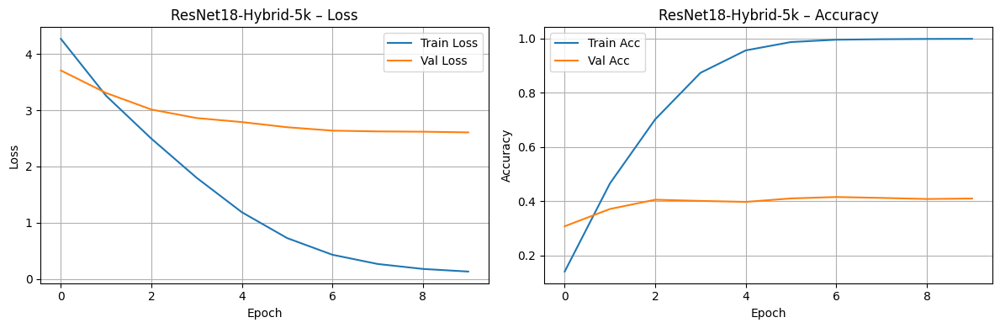

In [ ]:
model_resnet18_hybrid_5K = get_resnet18_hybrid()
subset_5k = train_subsets["5000"]
h5_model, h5_train_loss_hist, h5_val_loss_hist, h5_train_acc_hist, h5_val_acc_hist = train_model_on_subset(model_resnet18_hybrid_5K, "ResNet18-Hybrid-5k", subset_5k, num_epochs=10, plot_results=True)


📊 6.10 Resnet 18 + Hybrid head 5k TESTING

In [ ]:
h5_model.eval()
h5_all_preds, h5_all_labels, h5_all_probs = [], [], []

h5_start_time = time.time()

with torch.no_grad():
    for inputs, labels in tqdm(test_loader, desc="🔍 Hybrid modell 5k – tesztelés"):
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = h5_model(inputs)
        probs = torch.softmax(outputs, dim=1)
        preds = torch.argmax(probs, dim=1)

        h5_all_preds.extend(preds.cpu().numpy())
        h5_all_labels.extend(labels.cpu().numpy())
        h5_all_probs.extend(probs.cpu().numpy())

h5_inference_time_baseline = time.time() - h5_start_time

🔍 Hybrid modell 5k – tesztelés: 100%|██████████| 284/284 [00:15<00:00, 17.86it/s]


📈 6.10 Resnet 18 + Hybrid head 5k METRIKÁK

In [ ]:
h5_metrics_baseline = evaluate_metrics(
    np.array(h5_all_labels), np.array(h5_all_preds), np.array(h5_all_probs),
    "ResNet18 + Hybrid fej 5k", h5_inference_time_baseline
)


🔍 Vizsgálat eredményei (ResNet18 + Hybrid fej 5k):
✅ Top-1 Accuracy:  0.4081
✅ Top-5 Accuracy:  0.7018
🎯 Precision:       0.3763
🎯 Recall:          0.4324
🎯 F1-score:        0.3854
⏱️ Inference time:  15.91 sec


📈 6.10 Resnet 18 + Hybrid head 5k Confusion Matrix

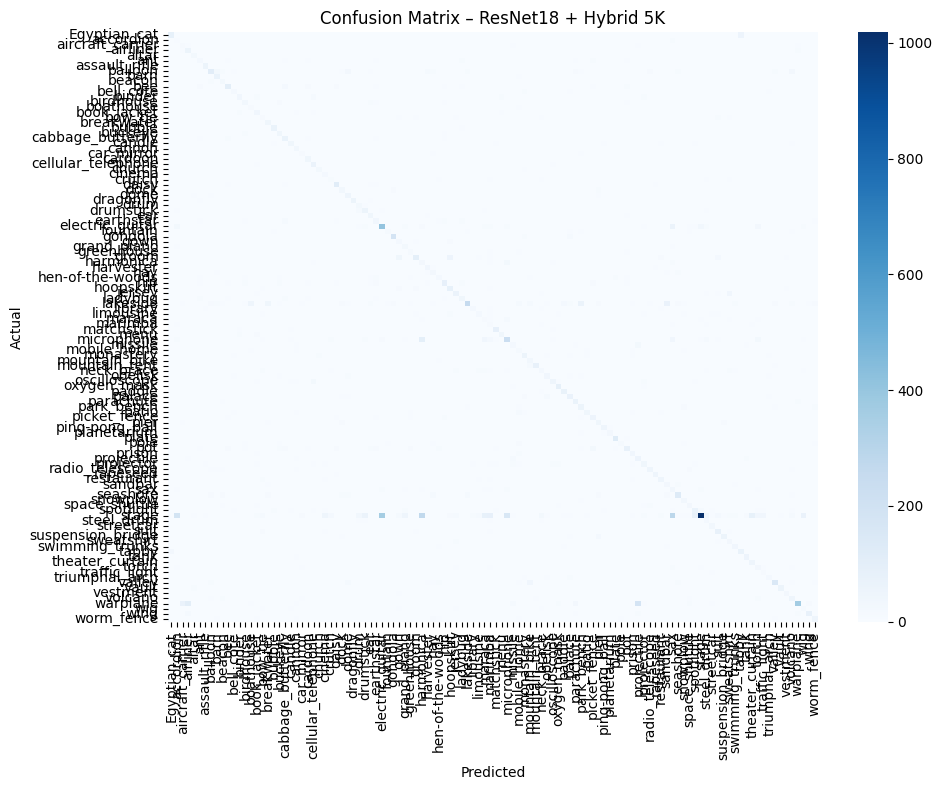

In [ ]:
plot_confusion_matrix(h5_all_labels, h5_all_preds, class_names, "Confusion Matrix – ResNet18 + Hybrid 5K")

📈 6.10 Resnet 18 + Hybrid head 5k Confusion Matrix Szebb

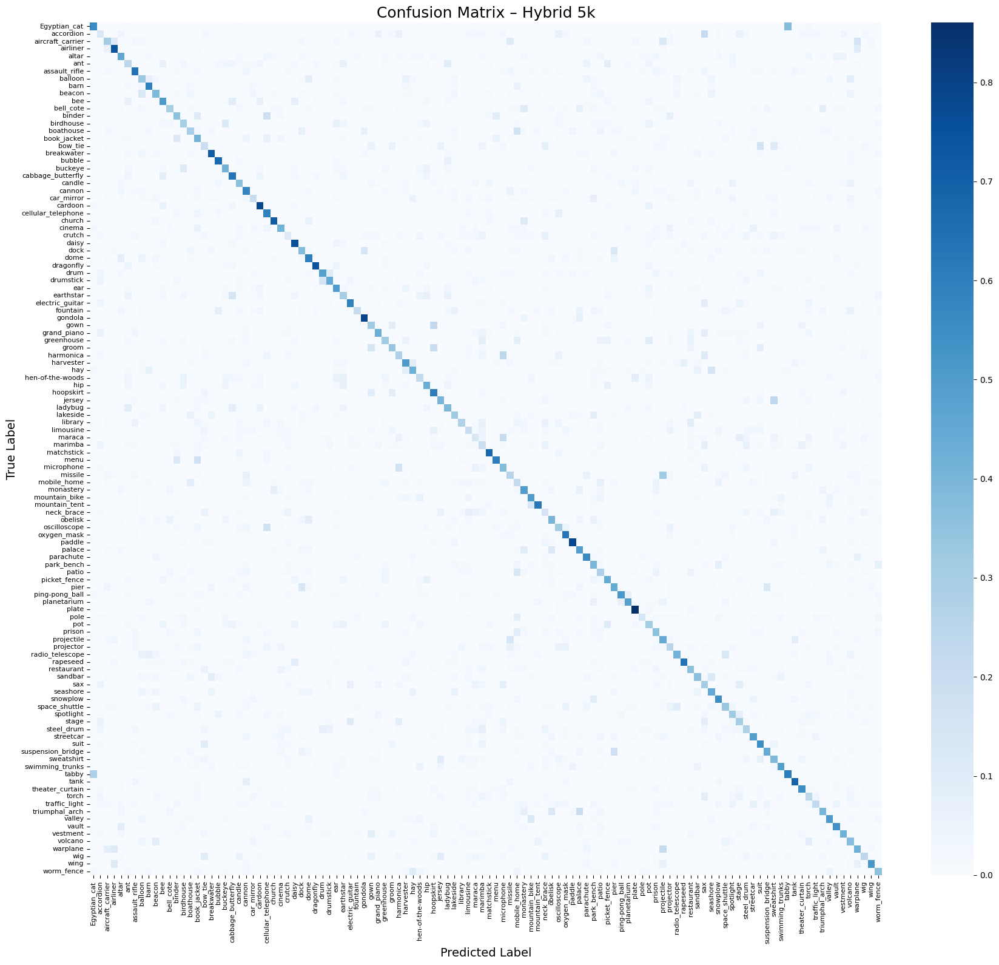

In [ ]:
plot_confusion_matrix_pretty(h5_all_labels, h5_all_preds, class_names, "Confusion Matrix – Hybrid 5k")

📈 6.10 Resnet 18 + Hybrid 5k ADATOK

In [ ]:
print("📋 Hybrid modell 5k – osztályonkénti metrikák:\n")
h5_df_baseline = export_classification_report(h5_all_labels, h5_all_preds, class_names, "stage_3_resnet18_hybrid_5k")
display(h5_df_baseline.head())

📋 Hybrid modell 5k – osztályonkénti metrikák:


📄 Exportálva: stage_3_resnet18_hybrid_5k


,precision,recall,f1-score,support
Egyptian_cat,0.618321,0.558621,0.586957,145.0
accordion,0.021898,0.127660,0.037383,47.0
aircraft_carrier,0.096000,0.307692,0.146341,39.0
airliner,0.299492,0.737500,0.425993,80.0
altar,0.321429,0.457627,0.377622,59.0


📈 6.10 Resnet 18 + Hybrid head 5k ADATOK – leggyengébb osztályok

In [ ]:
print_worst_classes(h5_df_baseline, "ResNet18 + Hybrid 5k fej")


📉 ResNet18 + Hybrid 5k fej – Top 10 leggyengébb osztály (F1-score alapján):



,precision,recall,f1-score
accordion,0.021898,0.127660,0.037383
maraca,0.065657,0.144444,0.090278
marimba,0.065217,0.189873,0.097087
harmonica,0.063348,0.280000,0.103321
crutch,0.111111,0.104762,0.107843
sax,0.068273,0.303571,0.111475
bow_tie,0.109244,0.194030,0.139785
aircraft_carrier,0.096000,0.307692,0.146341
mobile_home,0.114650,0.216867,0.150000
neck_brace,0.153285,0.153285,0.153285


✅ 6.10 GPU memóriahasználat, batch sebesség statisztika

In [ ]:
# --- GPU memóriahasználat ---
gpu_mem_allocated = torch.cuda.memory_allocated() / (1024 ** 3)
gpu_mem_reserved = torch.cuda.memory_reserved() / (1024 ** 3)

print(f"💾 GPU memória (lefoglalt): {gpu_mem_reserved:.2f} GB")
print(f"💾 GPU memória (használt):  {gpu_mem_allocated:.2f} GB")

💾 GPU memória (lefoglalt): 3.87 GB
💾 GPU memória (használt):  1.06 GB


📊 6.11 ResNet18 + Hybrid head 10k learning


---

[ResNet18-Hybrid-10k] Epoch 1/10 - val: 100%|██████████| 282/282 [00:16<00:00, 17.26it/s]


📊 [ResNet18-Hybrid-10k] Epoch 1: Train loss=3.8767, acc=0.2373 | Val loss=3.4472, acc=0.2730


[ResNet18-Hybrid-10k] Epoch 2/10 - val: 100%|██████████| 282/282 [00:16<00:00, 16.93it/s]


📊 [ResNet18-Hybrid-10k] Epoch 2: Train loss=2.7309, acc=0.4897 | Val loss=2.8071, acc=0.3924


[ResNet18-Hybrid-10k] Epoch 3/10 - val: 100%|██████████| 282/282 [00:16<00:00, 16.63it/s]


📊 [ResNet18-Hybrid-10k] Epoch 3: Train loss=1.9327, acc=0.6927 | Val loss=2.4873, acc=0.4377


[ResNet18-Hybrid-10k] Epoch 4/10 - val: 100%|██████████| 282/282 [00:17<00:00, 16.51it/s]


📊 [ResNet18-Hybrid-10k] Epoch 4: Train loss=1.2118, acc=0.8603 | Val loss=2.3039, acc=0.4593


[ResNet18-Hybrid-10k] Epoch 5/10 - val: 100%|██████████| 282/282 [00:16<00:00, 17.41it/s]


📊 [ResNet18-Hybrid-10k] Epoch 5: Train loss=0.6425, acc=0.9570 | Val loss=2.2062, acc=0.4749


[ResNet18-Hybrid-10k] Epoch 6/10 - val: 100%|██████████| 282/282 [00:16<00:00, 17.00it/s]


📊 [ResNet18-Hybrid-10k] Epoch 6: Train loss=0.3097, acc=0.9880 | Val loss=2.1661, acc=0.4793


[ResNet18-Hybrid-10k] Epoch 7/10 - val: 100%|██████████| 282/282 [00:15<00:00, 17.66it/s]


📊 [ResNet18-Hybrid-10k] Epoch 7: Train loss=0.1596, acc=0.9942 | Val loss=2.2224, acc=0.4611


[ResNet18-Hybrid-10k] Epoch 8/10 - val: 100%|██████████| 282/282 [00:16<00:00, 16.87it/s]


📊 [ResNet18-Hybrid-10k] Epoch 8: Train loss=0.0950, acc=0.9968 | Val loss=2.2190, acc=0.4670


[ResNet18-Hybrid-10k] Epoch 9/10 - val: 100%|██████████| 282/282 [00:16<00:00, 17.22it/s]


📊 [ResNet18-Hybrid-10k] Epoch 9: Train loss=0.0624, acc=0.9988 | Val loss=2.2564, acc=0.4633


[ResNet18-Hybrid-10k] Epoch 10/10 - val: 100%|██████████| 282/282 [00:16<00:00, 16.95it/s]


📊 [ResNet18-Hybrid-10k] Epoch 10: Train loss=0.0505, acc=0.9979 | Val loss=2.2423, acc=0.4660


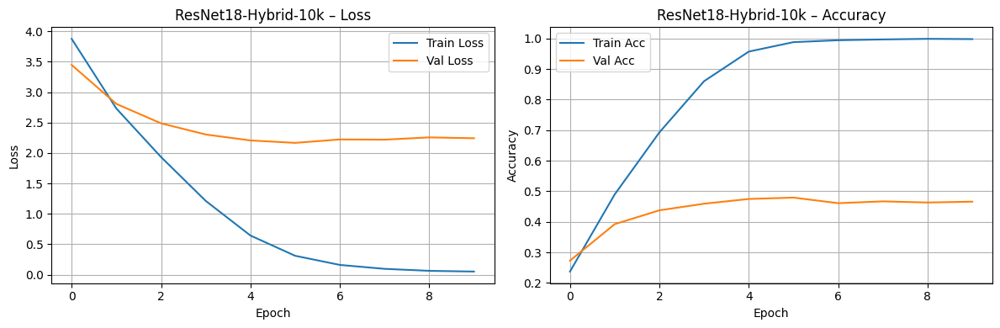

In [ ]:
model_resnet18_hybrid_10K = get_resnet18_hybrid()
subset_10k = train_subsets["10000"]
h10_model, h10_train_loss_hist, h10_val_loss_hist, h10_train_acc_hist, h10_val_acc_hist = train_model_on_subset(model_resnet18_hybrid_10K, "ResNet18-Hybrid-10k", subset_10k, num_epochs=10, plot_results=True)

📊 6.11 Resnet 18 + Hybrid head 10k TESTING

In [ ]:
h10_model.eval()
h10_all_preds, h10_all_labels, h10_all_probs = [], [], []

h10_start_time = time.time()

with torch.no_grad():
    for inputs, labels in tqdm(test_loader, desc="🔍 Hybrid modell 10k – tesztelés"):
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = h10_model(inputs)
        probs = torch.softmax(outputs, dim=1)
        preds = torch.argmax(probs, dim=1)

        h10_all_preds.extend(preds.cpu().numpy())
        h10_all_labels.extend(labels.cpu().numpy())
        h10_all_probs.extend(probs.cpu().numpy())

h10_inference_time_baseline = time.time() - h10_start_time

🔍 Hybrid modell 10k – tesztelés: 100%|██████████| 284/284 [00:16<00:00, 17.67it/s]


📈 6.11 Resnet 18 + Hybrid head 10k METRIKÁK

In [ ]:
h10_metrics_baseline = evaluate_metrics(
    np.array(h10_all_labels), np.array(h10_all_preds), np.array(h10_all_probs),
    "ResNet18 + Hybrid fej 10k", h10_inference_time_baseline
)


🔍 Vizsgálat eredményei (ResNet18 + Hybrid fej 10k):
✅ Top-1 Accuracy:  0.4715
✅ Top-5 Accuracy:  0.7583
🎯 Precision:       0.4383
🎯 Recall:          0.5061
🎯 F1-score:        0.4521
⏱️ Inference time:  16.08 sec


📈 6.11 Resnet 18 + Hybrid head 10k Confusion Matrix

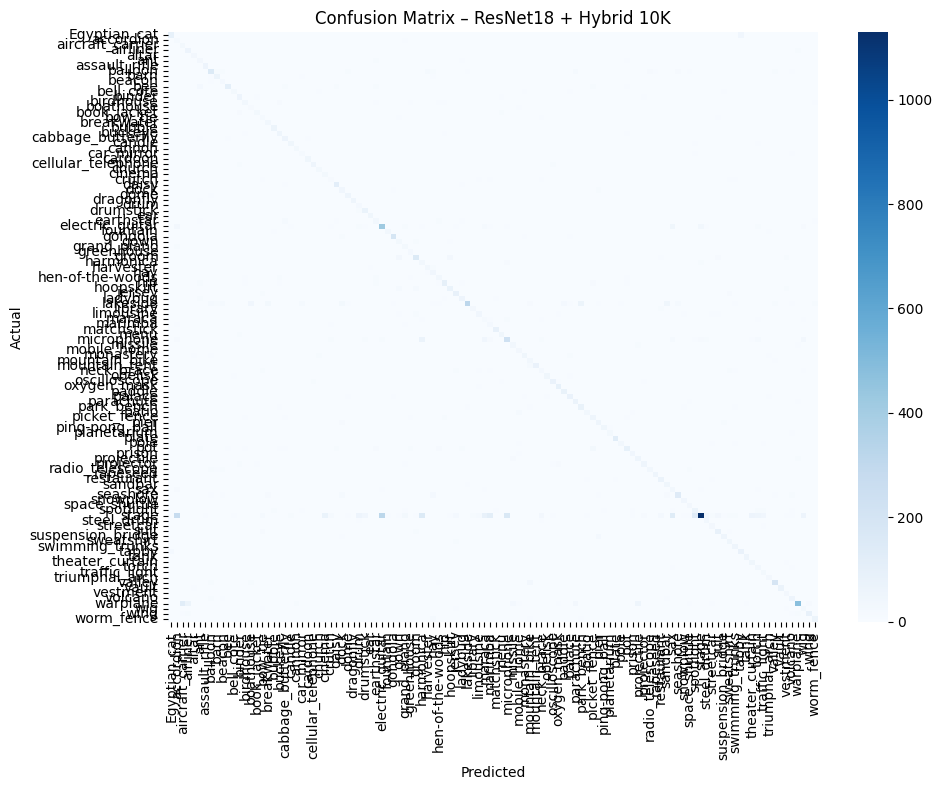

In [ ]:
plot_confusion_matrix(h10_all_labels, h10_all_preds, class_names, "Confusion Matrix – ResNet18 + Hybrid 10K")

📈 6.11 Resnet 18 + Hybrid head 10k Confusion Matrix Szebb

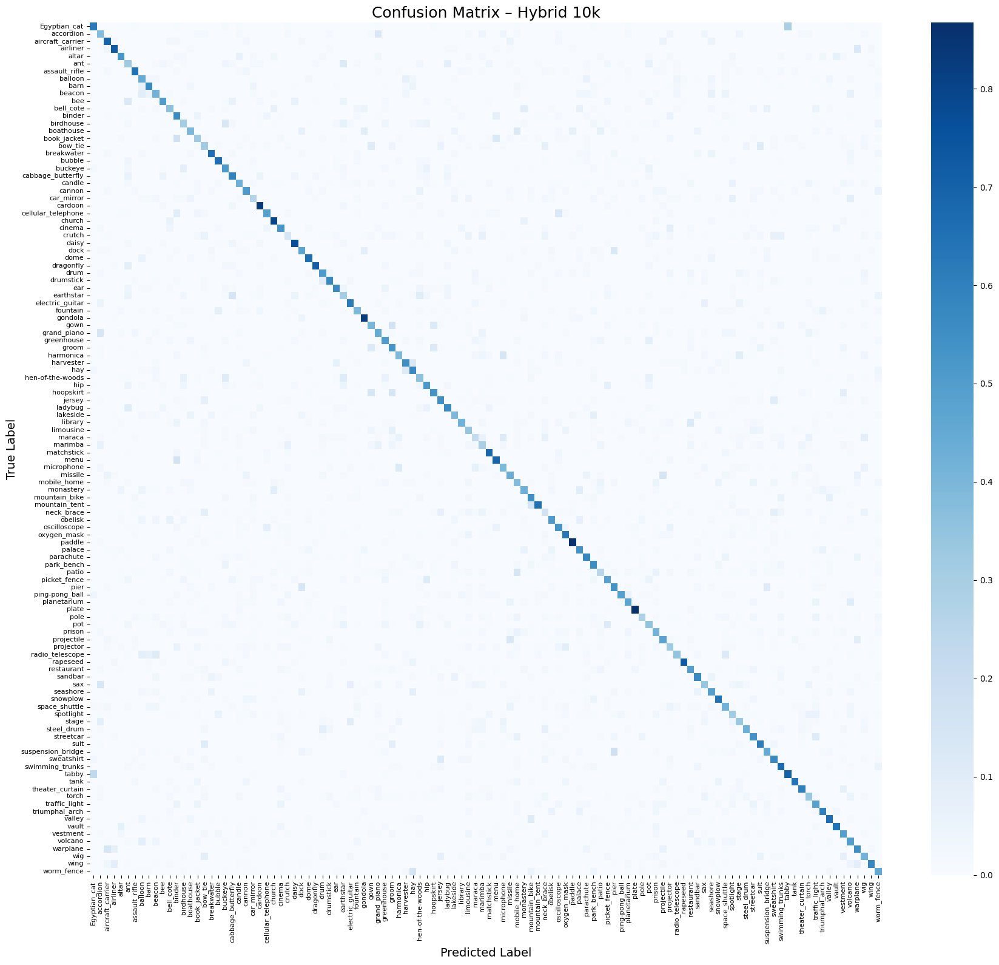

In [ ]:
plot_confusion_matrix_pretty(h10_all_labels, h10_all_preds, class_names, "Confusion Matrix – Hybrid 10k")

📈 6.11 Resnet 18 + Hybrid 10k ADATOK

In [ ]:
print("📋 Hybrid modell 10k – osztályonkénti metrikák:\n")
h10_df_baseline = export_classification_report(h10_all_labels, h10_all_preds, class_names, "stage_3_resnet18_hybrid_10k")
display(h10_df_baseline.head())

📋 Hybrid modell 10k – osztályonkénti metrikák:


📄 Exportálva: stage_3_resnet18_hybrid_10k


,precision,recall,f1-score,support
Egyptian_cat,0.681818,0.620690,0.649819,145.0
accordion,0.045918,0.382979,0.082005,47.0
aircraft_carrier,0.142105,0.692308,0.235808,39.0
airliner,0.376623,0.725000,0.495726,80.0
altar,0.469697,0.525424,0.496000,59.0


📈 6.11 Resnet 18 + Hybrid head 10k ADATOK – leggyengébb osztályok

In [ ]:
print_worst_classes(h10_df_baseline, "ResNet18 + Hybrid 10k fej")


📉 ResNet18 + Hybrid 10k fej – Top 10 leggyengébb osztály (F1-score alapján):



,precision,recall,f1-score
accordion,0.045918,0.382979,0.082005
maraca,0.101010,0.222222,0.138889
crutch,0.141509,0.142857,0.142180
marimba,0.100000,0.291139,0.148867
neck_brace,0.155405,0.167883,0.161404
harmonica,0.133562,0.390000,0.198980
sax,0.142322,0.339286,0.200528
bow_tie,0.156716,0.313433,0.208955
car_mirror,0.181818,0.264706,0.215569
boathouse,0.151786,0.395349,0.219355


✅ 6.11 GPU memóriahasználat, batch sebesség statisztika

In [ ]:
# --- GPU memóriahasználat ---
gpu_mem_allocated = torch.cuda.memory_allocated() / (1024 ** 3)
gpu_mem_reserved = torch.cuda.memory_reserved() / (1024 ** 3)

print(f"💾 GPU memória (lefoglalt): {gpu_mem_reserved:.2f} GB")
print(f"💾 GPU memória (használt):  {gpu_mem_allocated:.2f} GB")

💾 GPU memória (lefoglalt): 3.88 GB
💾 GPU memória (használt):  1.15 GB


📊 6.12 ResNet18 + Hybrid head 25k learning


---

[ResNet18-Hybrid-25k] Epoch 1/10 - val: 100%|██████████| 282/282 [00:16<00:00, 17.33it/s]


📊 [ResNet18-Hybrid-25k] Epoch 1: Train loss=3.2745, acc=0.3216 | Val loss=2.5685, acc=0.4252


[ResNet18-Hybrid-25k] Epoch 2/10 - val: 100%|██████████| 282/282 [00:16<00:00, 17.35it/s]


📊 [ResNet18-Hybrid-25k] Epoch 2: Train loss=2.0184, acc=0.5558 | Val loss=2.0306, acc=0.4931


[ResNet18-Hybrid-25k] Epoch 3/10 - val: 100%|██████████| 282/282 [00:16<00:00, 17.53it/s]


📊 [ResNet18-Hybrid-25k] Epoch 3: Train loss=1.2938, acc=0.7162 | Val loss=1.9346, acc=0.5032


[ResNet18-Hybrid-25k] Epoch 4/10 - val: 100%|██████████| 282/282 [00:16<00:00, 17.60it/s]


📊 [ResNet18-Hybrid-25k] Epoch 4: Train loss=0.7412, acc=0.8525 | Val loss=1.9804, acc=0.4881


[ResNet18-Hybrid-25k] Epoch 5/10 - val: 100%|██████████| 282/282 [00:15<00:00, 17.98it/s]


📊 [ResNet18-Hybrid-25k] Epoch 5: Train loss=0.3509, acc=0.9456 | Val loss=1.9719, acc=0.4994


[ResNet18-Hybrid-25k] Epoch 6/10 - val: 100%|██████████| 282/282 [00:15<00:00, 17.96it/s]


📊 [ResNet18-Hybrid-25k] Epoch 6: Train loss=0.1850, acc=0.9742 | Val loss=1.9780, acc=0.5174


[ResNet18-Hybrid-25k] Epoch 7/10 - val: 100%|██████████| 282/282 [00:16<00:00, 17.50it/s]


📊 [ResNet18-Hybrid-25k] Epoch 7: Train loss=0.0840, acc=0.9892 | Val loss=2.1407, acc=0.4998


[ResNet18-Hybrid-25k] Epoch 8/10 - val: 100%|██████████| 282/282 [00:15<00:00, 18.15it/s]


📊 [ResNet18-Hybrid-25k] Epoch 8: Train loss=0.0650, acc=0.9906 | Val loss=2.1091, acc=0.5098


[ResNet18-Hybrid-25k] Epoch 9/10 - val: 100%|██████████| 282/282 [00:15<00:00, 17.70it/s]


📊 [ResNet18-Hybrid-25k] Epoch 9: Train loss=0.0653, acc=0.9904 | Val loss=2.1739, acc=0.5001


[ResNet18-Hybrid-25k] Epoch 10/10 - val: 100%|██████████| 282/282 [00:15<00:00, 18.30it/s]


📊 [ResNet18-Hybrid-25k] Epoch 10: Train loss=0.0548, acc=0.9905 | Val loss=2.2590, acc=0.5012


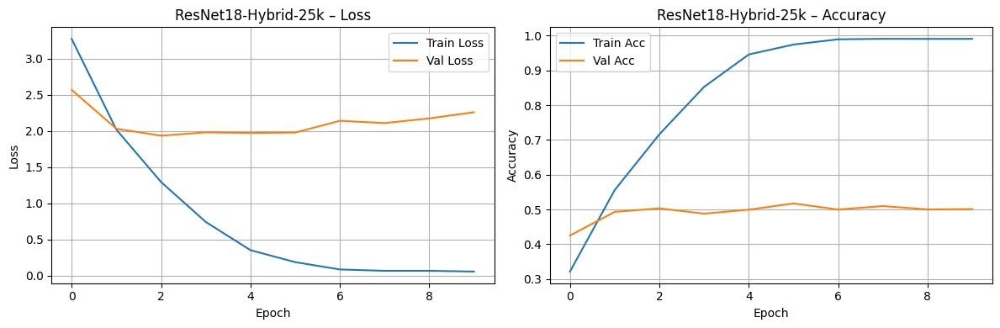

In [ ]:
model_resnet18_hybrid_25K = get_resnet18_hybrid()
subset_25k = train_subsets["25000"]
h25_model, h25_train_loss_hist, h25_val_loss_hist, h25_train_acc_hist, h25_val_acc_hist = train_model_on_subset(model_resnet18_hybrid_25K, "ResNet18-Hybrid-25k", subset_25k, num_epochs=10, plot_results=True)

📊 6.12 Resnet 18 + Hybrid head 25k TESTING

In [ ]:
h25_model.eval()
h25_all_preds, h25_all_labels, h25_all_probs = [], [], []

h25_start_time = time.time()

with torch.no_grad():
    for inputs, labels in tqdm(test_loader, desc="🔍 Hybrid modell 25k – tesztelés"):
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = h25_model(inputs)
        probs = torch.softmax(outputs, dim=1)
        preds = torch.argmax(probs, dim=1)

        h25_all_preds.extend(preds.cpu().numpy())
        h25_all_labels.extend(labels.cpu().numpy())
        h25_all_probs.extend(probs.cpu().numpy())

h25_inference_time_baseline = time.time() - h25_start_time

🔍 Hybrid modell 25k – tesztelés: 100%|██████████| 284/284 [00:16<00:00, 17.70it/s]


📈 6.12 Resnet 18 + Hybrid head 25k METRIKÁK

In [ ]:
h25_metrics_baseline = evaluate_metrics(
    np.array(h25_all_labels), np.array(h25_all_preds), np.array(h25_all_probs),
    "ResNet18 + Hybrid fej 25k", h25_inference_time_baseline
)


🔍 Vizsgálat eredményei (ResNet18 + Hybrid fej 25k):
✅ Top-1 Accuracy:  0.5061
✅ Top-5 Accuracy:  0.7904
🎯 Precision:       0.4944
🎯 Recall:          0.5585
🎯 F1-score:        0.5038
⏱️ Inference time:  16.06 sec


📈 6.12 Resnet 18 + Hybrid head 25k Confusion Matrix

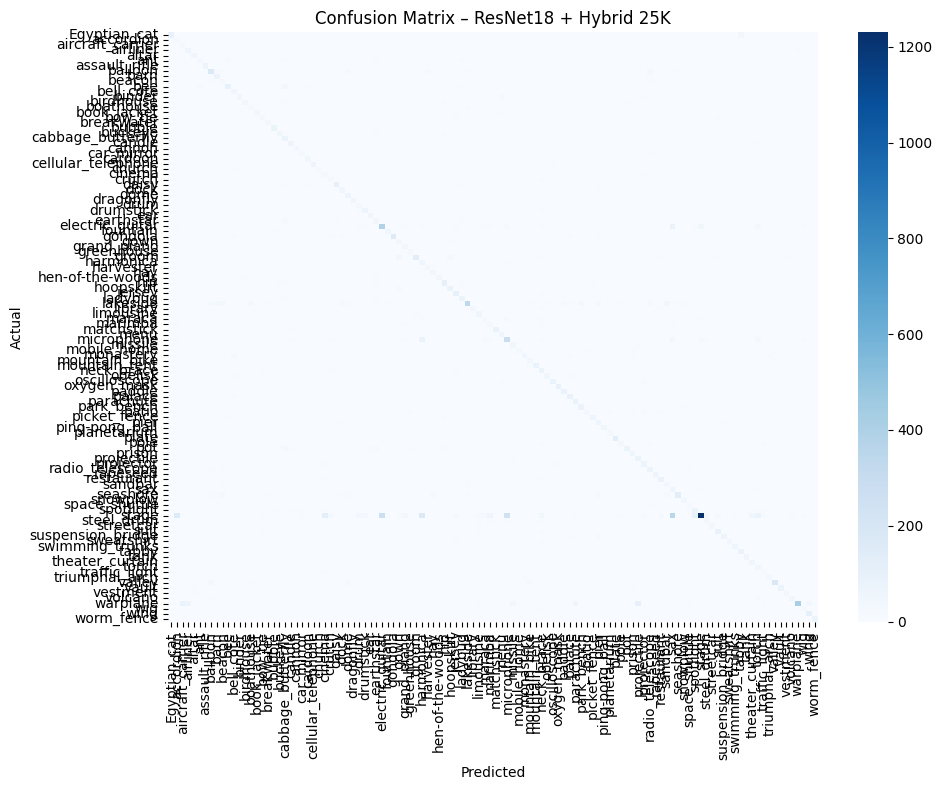

In [ ]:
plot_confusion_matrix(h25_all_labels, h25_all_preds, class_names, "Confusion Matrix – ResNet18 + Hybrid 25K")

📈 6.12 Resnet 18 + Hybrid head 25k Confusion Matrix Szebb

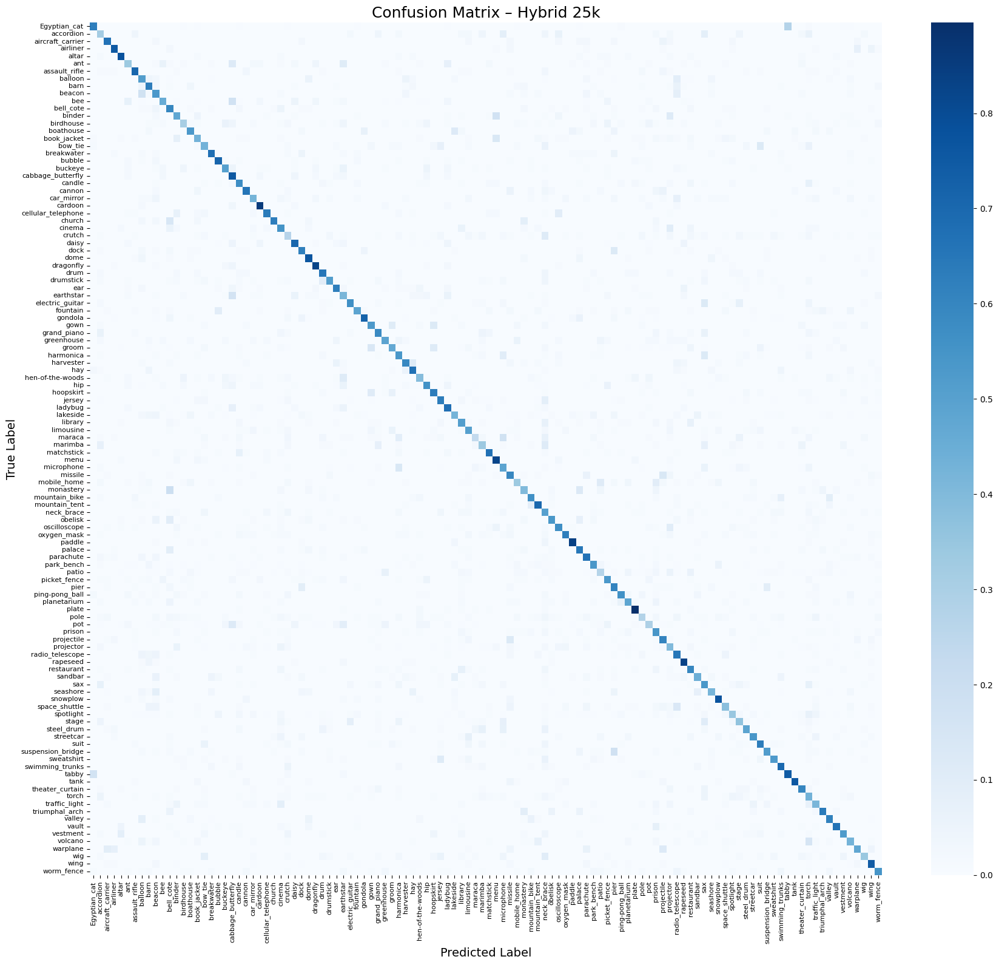

In [ ]:
plot_confusion_matrix_pretty(h25_all_labels, h25_all_preds, class_names, "Confusion Matrix – Hybrid 25k")

📈 6.12 Resnet 18 + Hybrid 25k ADATOK

In [ ]:
print("📋 Hybrid modell 25k – osztályonkénti metrikák:\n")
h25_df_baseline = export_classification_report(h25_all_labels, h25_all_preds, class_names, "stage_3_resnet18_hybrid_25k")
display(h25_df_baseline.head())

📋 Hybrid modell 25k – osztályonkénti metrikák:


📄 Exportálva: stage_3_resnet18_hybrid_25k


,precision,recall,f1-score,support
Egyptian_cat,0.777778,0.627586,0.694656,145.0
accordion,0.058366,0.319149,0.098684,47.0
aircraft_carrier,0.204724,0.666667,0.313253,39.0
airliner,0.419580,0.750000,0.538117,80.0
altar,0.686567,0.779661,0.730159,59.0


📈 6.12 Resnet 18 + Hybrid head 25k ADATOK – leggyengébb osztályok

In [ ]:
print_worst_classes(h25_df_baseline, "ResNet18 + Hybrid 25k fej")


📉 ResNet18 + Hybrid 25k fej – Top 10 leggyengébb osztály (F1-score alapján):



,precision,recall,f1-score
accordion,0.058366,0.319149,0.098684
sax,0.101010,0.535714,0.169972
cinema,0.116667,0.549020,0.192440
crutch,0.189189,0.266667,0.221344
maraca,0.212121,0.233333,0.222222
harmonica,0.145946,0.540000,0.229787
torch,0.159744,0.431034,0.233100
marimba,0.182432,0.341772,0.237885
beacon,0.170984,0.532258,0.258824
traffic_light,0.210526,0.413793,0.279070


✅ 6.12 GPU memóriahasználat, batch sebesség statisztika

In [ ]:
# --- GPU memóriahasználat ---
gpu_mem_allocated = torch.cuda.memory_allocated() / (1024 ** 3)
gpu_mem_reserved = torch.cuda.memory_reserved() / (1024 ** 3)

print(f"💾 GPU memória (lefoglalt): {gpu_mem_reserved:.2f} GB")
print(f"💾 GPU memória (használt):  {gpu_mem_allocated:.2f} GB")

💾 GPU memória (lefoglalt): 3.89 GB
💾 GPU memória (használt):  1.23 GB


📊 6.12 Resnet 18 + Hybrid head összesítő statisztikák!


---

<ipython-input-162-5b74b0f31af7>:51: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


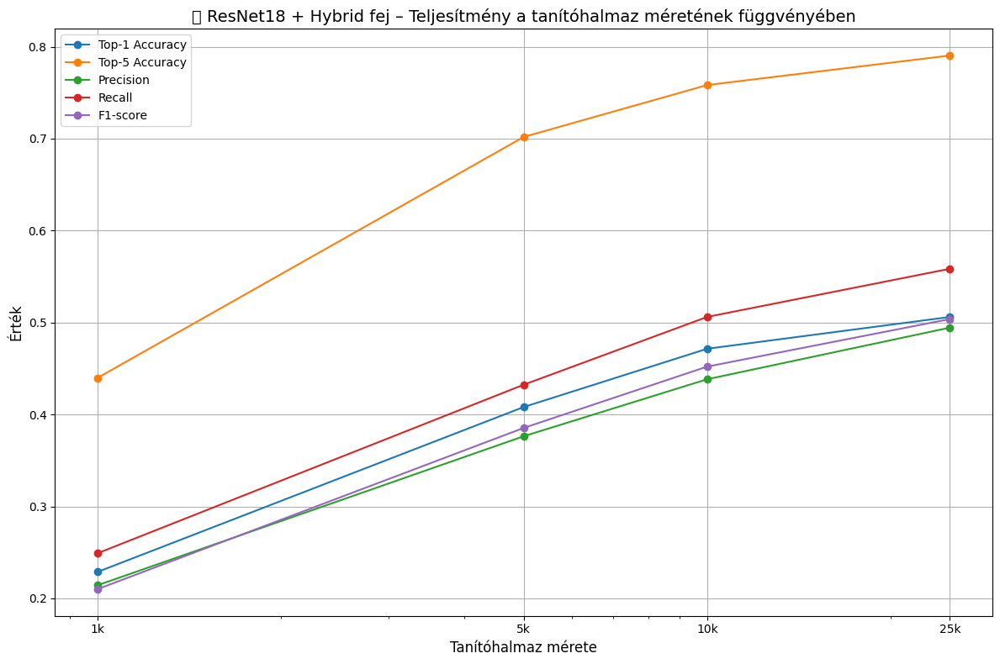

In [ ]:
# --- 📊 Összesített metrikák begyűjtése ---
metric_data = {
    "Train Size": [1000, 5000, 10000, 25000],
    "Top-1 Accuracy": [
        h1_metrics_baseline["top1"],
        h5_metrics_baseline["top1"],
        h10_metrics_baseline["top1"],
        h25_metrics_baseline["top1"]
    ],
    "Top-5 Accuracy": [
        h1_metrics_baseline["top5"],
        h5_metrics_baseline["top5"],
        h10_metrics_baseline["top5"],
        h25_metrics_baseline["top5"]
    ],
    "Precision": [
        h1_metrics_baseline["precision"],
        h5_metrics_baseline["precision"],
        h10_metrics_baseline["precision"],
        h25_metrics_baseline["precision"]
    ],
    "Recall": [
        h1_metrics_baseline["recall"],
        h5_metrics_baseline["recall"],
        h10_metrics_baseline["recall"],
        h25_metrics_baseline["recall"]
    ],
    "F1-score": [
        h1_metrics_baseline["f1"],
        h5_metrics_baseline["f1"],
        h10_metrics_baseline["f1"],
        h25_metrics_baseline["f1"]
    ]
}

# --- 📊 DataFrame-be rendezés ---
df_metrics = pd.DataFrame(metric_data)

# --- 📈 Grafikon rajzolása ---
plt.figure(figsize=(12, 8))
for metric in ["Top-1 Accuracy", "Top-5 Accuracy", "Precision", "Recall", "F1-score"]:
    plt.plot(df_metrics["Train Size"], df_metrics[metric], marker='o', label=metric)

plt.title("📊 ResNet18 + Hybrid fej – Teljesítmény a tanítóhalmaz méretének függvényében", fontsize=14)
plt.xlabel("Tanítóhalmaz mérete", fontsize=12)
plt.ylabel("Érték", fontsize=12)
plt.xscale("log")
plt.xticks(df_metrics["Train Size"], labels=[f"{int(x/1000)}k" for x in df_metrics["Train Size"]])
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

<ipython-input-163-627ca277277e>:41: UserWarning: Glyph 128201 (\N{CHART WITH DOWNWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-163-627ca277277e>:41: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128201 (\N{CHART WITH DOWNWARDS TREND}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


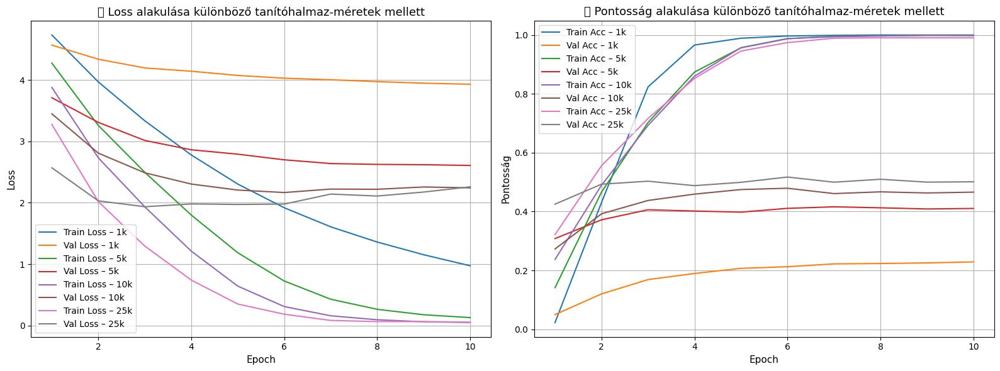

In [ ]:
import matplotlib.pyplot as plt

# --- Epoch tengely ---
epochs = list(range(1, len(h1_train_loss_hist) + 1))

# --- 🎨 Ábra beállítás ---
plt.figure(figsize=(16, 6))

# --- 📉 Loss görbék ---
plt.subplot(1, 2, 1)
plt.plot(epochs, h1_train_loss_hist, label="Train Loss – 1k")
plt.plot(epochs, h1_val_loss_hist, label="Val Loss – 1k")
plt.plot(epochs, h5_train_loss_hist, label="Train Loss – 5k")
plt.plot(epochs, h5_val_loss_hist, label="Val Loss – 5k")
plt.plot(epochs, h10_train_loss_hist, label="Train Loss – 10k")
plt.plot(epochs, h10_val_loss_hist, label="Val Loss – 10k")
plt.plot(epochs, h25_train_loss_hist, label="Train Loss – 25k")
plt.plot(epochs, h25_val_loss_hist, label="Val Loss – 25k")
plt.title("📉 Loss alakulása különböző tanítóhalmaz-méretek mellett", fontsize=13)
plt.xlabel("Epoch", fontsize=11)
plt.ylabel("Loss", fontsize=11)
plt.legend()
plt.grid(True)

# --- 📈 Accuracy görbék ---
plt.subplot(1, 2, 2)
plt.plot(epochs, h1_train_acc_hist, label="Train Acc – 1k")
plt.plot(epochs, h1_val_acc_hist, label="Val Acc – 1k")
plt.plot(epochs, h5_train_acc_hist, label="Train Acc – 5k")
plt.plot(epochs, h5_val_acc_hist, label="Val Acc – 5k")
plt.plot(epochs, h10_train_acc_hist, label="Train Acc – 10k")
plt.plot(epochs, h10_val_acc_hist, label="Val Acc – 10k")
plt.plot(epochs, h25_train_acc_hist, label="Train Acc – 25k")
plt.plot(epochs, h25_val_acc_hist, label="Val Acc – 25k")
plt.title("📈 Pontosság alakulása különböző tanítóhalmaz-méretek mellett", fontsize=13)
plt.xlabel("Epoch", fontsize=11)
plt.ylabel("Pontosság", fontsize=11)
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

<ipython-input-164-319ec352b43a>:25: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


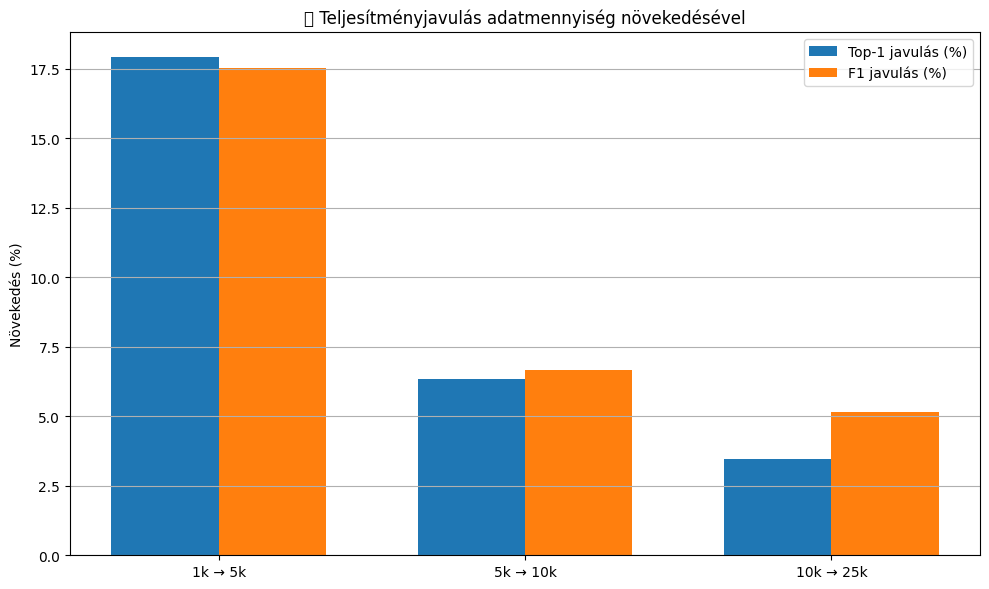

In [ ]:
# 4️⃣ Metrikák arányos növekedése (pl. megtérülés-elemzés)
import matplotlib.pyplot as plt
import numpy as np

train_sizes = [1000, 5000, 10000, 25000]
top1s  = [h1_metrics_baseline["top1"], h5_metrics_baseline["top1"], h10_metrics_baseline["top1"], h25_metrics_baseline["top1"]]
f1s    = [h1_metrics_baseline["f1"],   h5_metrics_baseline["f1"],   h10_metrics_baseline["f1"],   h25_metrics_baseline["f1"]]

top1_gains = [100 * (b - a) for a, b in zip(top1s[:-1], top1s[1:])]
f1_gains   = [100 * (b - a) for a, b in zip(f1s[:-1],   f1s[1:])]

labels = ["1k → 5k", "5k → 10k", "10k → 25k"]
x = np.arange(len(labels))
width = 0.35

plt.figure(figsize=(10, 6))
plt.bar(x - width/2, top1_gains, width, label='Top-1 javulás (%)')
plt.bar(x + width/2, f1_gains, width, label='F1 javulás (%)')

plt.ylabel('Növekedés (%)')
plt.title('📈 Teljesítményjavulás adatmennyiség növekedésével')
plt.xticks(x, labels)
plt.legend()
plt.grid(axis='y')
plt.tight_layout()
plt.show()

<ipython-input-165-7248e47c0db2>:19: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0, 0, 1, 0.95])
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


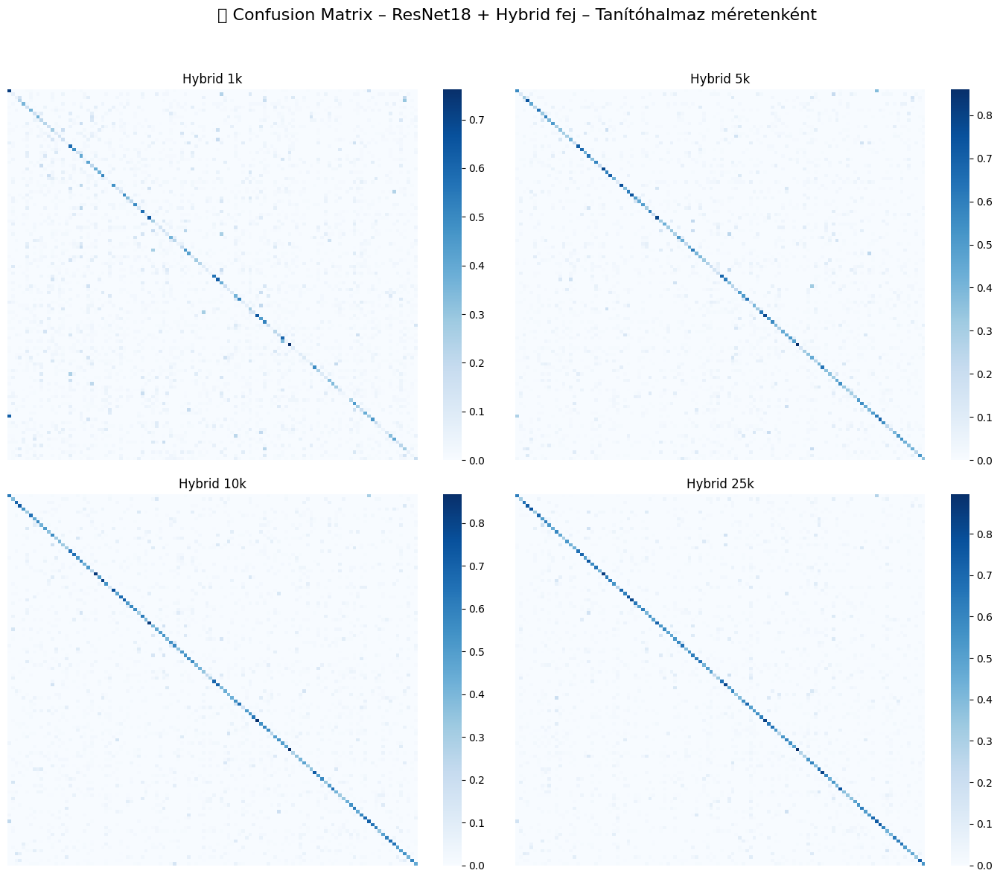

In [ ]:
# 5️⃣ Confusion Matrix összehasonlító ábra – szépített 2x2-ben, kicsiben
fig, axes = plt.subplots(2, 2, figsize=(14, 12))

# Egyedi subplotokba ágyazás
plt.sca(axes[0, 0])
plot_confusion_matrix_pretty(h1_all_labels, h1_all_preds, class_names, "Hybrid 1k", show=False, small=True)

plt.sca(axes[0, 1])
plot_confusion_matrix_pretty(h5_all_labels, h5_all_preds, class_names, "Hybrid 5k", show=False, small=True)

plt.sca(axes[1, 0])
plot_confusion_matrix_pretty(h10_all_labels, h10_all_preds, class_names, "Hybrid 10k", show=False, small=True)

plt.sca(axes[1, 1])
plot_confusion_matrix_pretty(h25_all_labels, h25_all_preds, class_names, "Hybrid 25k", show=False, small=True)

# Közös cím
plt.suptitle("📊 Confusion Matrix – ResNet18 + Hybrid fej – Tanítóhalmaz méretenként", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

In [ ]:
# 6️⃣ Leggyengébb osztályok F1-score alakulása
def extract_worst_f1(df, top_n=5):
    df = df.reset_index().rename(columns={"index": "class"})
    return df.sort_values("f1-score").head(top_n)[["class", "f1-score"]].reset_index(drop=True)

worst_1k  = extract_worst_f1(h1_df_baseline)
worst_5k  = extract_worst_f1(h5_df_baseline)
worst_10k = extract_worst_f1(h10_df_baseline)
worst_25k = extract_worst_f1(h25_df_baseline)

# Keresztösszehasonlítás (az 1k legrosszabb osztályait követjük végig)
common_classes = worst_1k["class"].tolist()

rows = []
for cls in common_classes:
    row = {"class": cls}
    for label, df in [("1k", b1_df_baseline), ("5k", b5_df_baseline), ("10k", b10_df_baseline), ("25k", b25_df_baseline)]:
        df_ = df.reset_index().rename(columns={"index": "class"})  # 🧠 Itt a javítás!
        f1 = df_[df_["class"] == cls]["f1-score"].values[0] if cls in df_["class"].values else np.nan
        row[f"F1-{label}"] = f1
    rows.append(row)

import pandas as pd
df_worst = pd.DataFrame(rows)
print("📋 Leggyengébb osztályok alakulása F1-score alapján:")
display(df_worst)

📋 Leggyengébb osztályok alakulása F1-score alapján:


,class,F1-1k,F1-5k,F1-10k,F1-25k
0,cinema,0.000000,0.233129,0.317073,0.277512
1,steel_drum,0.027397,0.167598,0.290155,0.323529
2,accordion,0.012103,0.033816,0.065868,0.097902
3,grand_piano,0.025974,0.200692,0.271930,0.318182
4,crutch,0.074349,0.140127,0.130841,0.144509


<ipython-input-167-f883430f25fa>:36: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


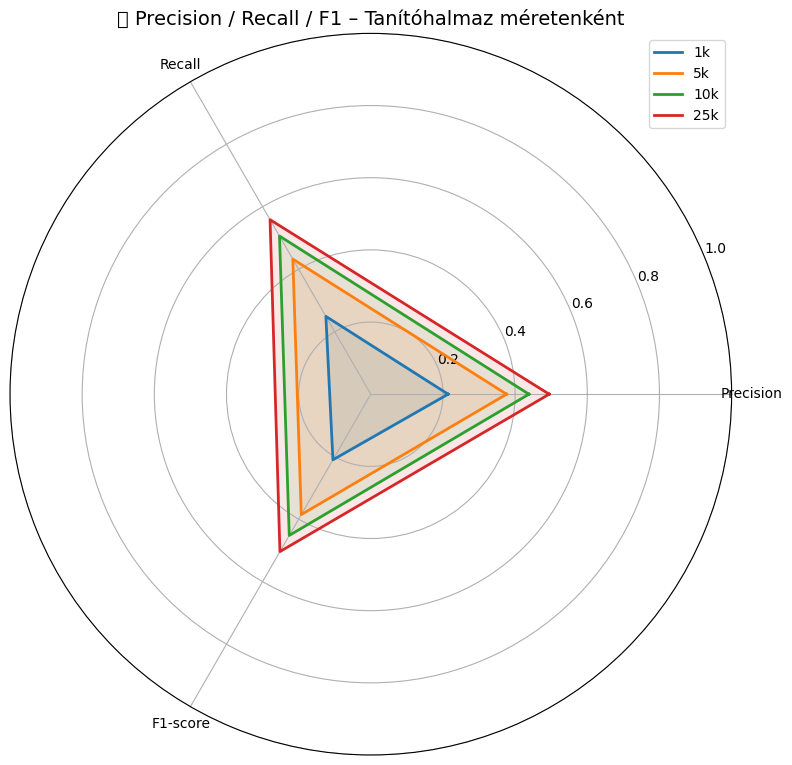

In [ ]:
# 7️⃣ Radar chart – Precision / Recall / F1 különböző méreteknél
import numpy as np
import matplotlib.pyplot as plt

labels = ["Precision", "Recall", "F1-score"]
metrics_1k  = [h1_metrics_baseline["precision"],  h1_metrics_baseline["recall"],  h1_metrics_baseline["f1"]]
metrics_5k  = [h5_metrics_baseline["precision"],  h5_metrics_baseline["recall"],  h5_metrics_baseline["f1"]]
metrics_10k = [h10_metrics_baseline["precision"], h10_metrics_baseline["recall"], h10_metrics_baseline["f1"]]
metrics_25k = [h25_metrics_baseline["precision"], h25_metrics_baseline["recall"], h25_metrics_baseline["f1"]]

# Radar plot setup
angles = np.linspace(0, 2 * np.pi, len(labels), endpoint=False).tolist()
metrics_1k  += [metrics_1k[0]]
metrics_5k  += [metrics_5k[0]]
metrics_10k += [metrics_10k[0]]
metrics_25k += [metrics_25k[0]]
angles += [angles[0]]

fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))

ax.plot(angles, metrics_1k, label="1k", linewidth=2)
ax.plot(angles, metrics_5k, label="5k", linewidth=2)
ax.plot(angles, metrics_10k, label="10k", linewidth=2)
ax.plot(angles, metrics_25k, label="25k", linewidth=2)

ax.fill(angles, metrics_1k, alpha=0.1)
ax.fill(angles, metrics_5k, alpha=0.1)
ax.fill(angles, metrics_10k, alpha=0.1)
ax.fill(angles, metrics_25k, alpha=0.1)

ax.set_title("📊 Precision / Recall / F1 – Tanítóhalmaz méretenként", size=14)
ax.set_thetagrids(np.degrees(angles[:-1]), labels)
ax.set_ylim(0, 1)
ax.grid(True)
ax.legend(loc="upper right")
plt.tight_layout()
plt.show()


---

Összesítő statisztikák

---

In [ ]:
baseline_144k = {
    "top1": 0.7303,
    "top5": 0.9099,
    "precision": 0.6777,
    "recall": 0.6490,
    "f1": 0.6568
}
deep_144k = {
    "top1": 0.7247,
    "top5": 0.9000,
    "precision": 0.6673,
    "recall": 0.6336,
    "f1": 0.6455
}
hybrid_144k = {
    "top1": 0.7276,
    "top5": 0.9074,
    "precision": 0.6828,
    "recall": 0.6369,
    "f1": 0.6536
}
baseline_infer_144k = 18.54
deep_infer_144k     = 16.01
hybrid_infer_144k   = 16.13

import pandas as pd

# --- Új teljes metrikagyűjtemény ---
all_metrics = [
    ("Baseline", "1k",    b1_metrics_baseline,   b1_inference_time_baseline),
    ("Baseline", "5k",    b5_metrics_baseline,   b5_inference_time_baseline),
    ("Baseline", "10k",   b10_metrics_baseline,  b10_inference_time_baseline),
    ("Baseline", "25k",   b25_metrics_baseline,  b25_inference_time_baseline),
    ("Baseline", "144k",  baseline_144k,         baseline_infer_144k),

    ("Deep",     "1k",    d1_metrics_baseline,   d1_inference_time_baseline),
    ("Deep",     "5k",    d5_metrics_baseline,   d5_inference_time_baseline),
    ("Deep",     "10k",   d10_metrics_baseline,  d10_inference_time_baseline),
    ("Deep",     "25k",   d25_metrics_baseline,  d25_inference_time_baseline),
    ("Deep",     "144k",  deep_144k,             deep_infer_144k),

    ("Hybrid",   "1k",    h1_metrics_baseline,   h1_inference_time_baseline),
    ("Hybrid",   "5k",    h5_metrics_baseline,   h5_inference_time_baseline),
    ("Hybrid",   "10k",   h10_metrics_baseline,  h10_inference_time_baseline),
    ("Hybrid",   "25k",   h25_metrics_baseline,  h25_inference_time_baseline),
    ("Hybrid",   "144k",  hybrid_144k,           hybrid_infer_144k),
]

# --- Táblázat összeállítása ---
rows = []
for model, size, metrics, inference_time in all_metrics:
    row = {
        "Model": model,
        "Train Size": size,
        "Top-1 Acc": round(metrics["top1"], 4),
        "Top-5 Acc": round(metrics["top5"], 4),
        "Precision": round(metrics["precision"], 4),
        "Recall": round(metrics["recall"], 4),
        "F1-score": round(metrics["f1"], 4),
        "Inference Time (s)": round(inference_time, 2)
    }
    rows.append(row)

# --- DataFrame rendezése méret szerint ---
order = {"1k": 1, "5k": 2, "10k": 3, "25k": 4, "144k": 5}
df_all = pd.DataFrame(rows)
df_all = df_all.sort_values(by=["Model", "Train Size"], key=lambda col: col.map(order))

# --- Megjelenítés ---
print("📋 Teljes összesítő táblázat – minden modell, minden méret:")
display(df_all)

📋 Teljes összesítő táblázat – minden modell, minden méret:


,Model,Train Size,Top-1 Acc,Top-5 Acc,Precision,Recall,F1-score,Inference Time (s)
0,Baseline,1k,0.2530,0.5288,0.2584,0.2676,0.2306,15.69
5,Deep,1k,0.1796,0.4040,0.2572,0.2252,0.1683,16.82
10,Hybrid,1k,0.2288,0.4398,0.2143,0.2491,0.2100,15.78
1,Baseline,5k,0.4029,0.7069,0.3886,0.4328,0.3888,16.05
6,Deep,5k,0.3973,0.6979,0.3680,0.4073,0.3666,15.92
11,Hybrid,5k,0.4081,0.7018,0.3763,0.4324,0.3854,15.91
2,Baseline,10k,0.4518,0.7495,0.4428,0.4914,0.4463,15.90
7,Deep,10k,0.4419,0.7167,0.4210,0.4651,0.4211,16.19
12,Hybrid,10k,0.4715,0.7583,0.4383,0.5061,0.4521,16.08
3,Baseline,25k,0.4917,0.7758,0.4865,0.5520,0.4944,17.00


---

Összesítő grafikonok

---

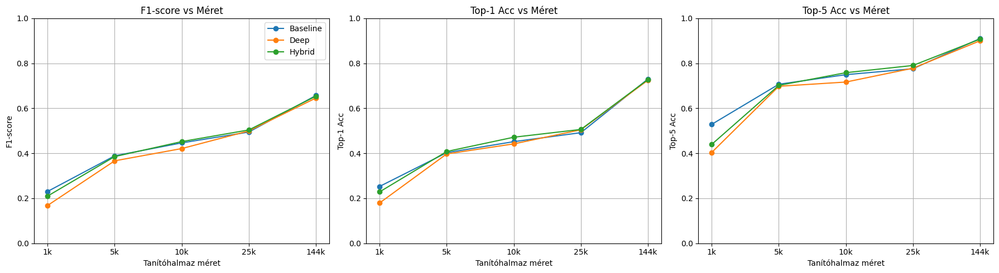

<ipython-input-175-67ff774c4cbf>:42: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


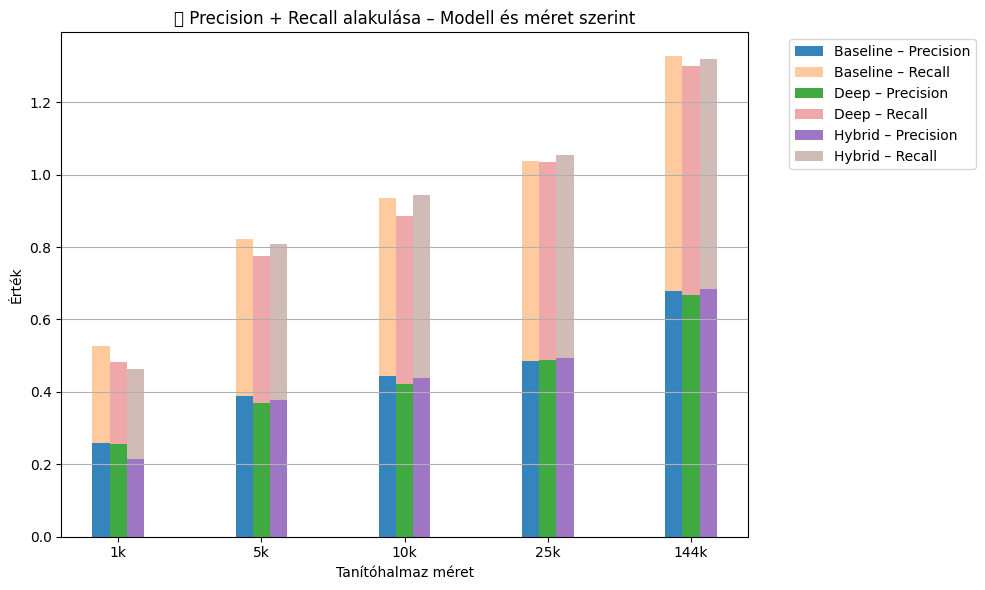

<ipython-input-175-67ff774c4cbf>:55: UserWarning: Glyph 9201 (\N{STOPWATCH}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9201 (\N{STOPWATCH}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


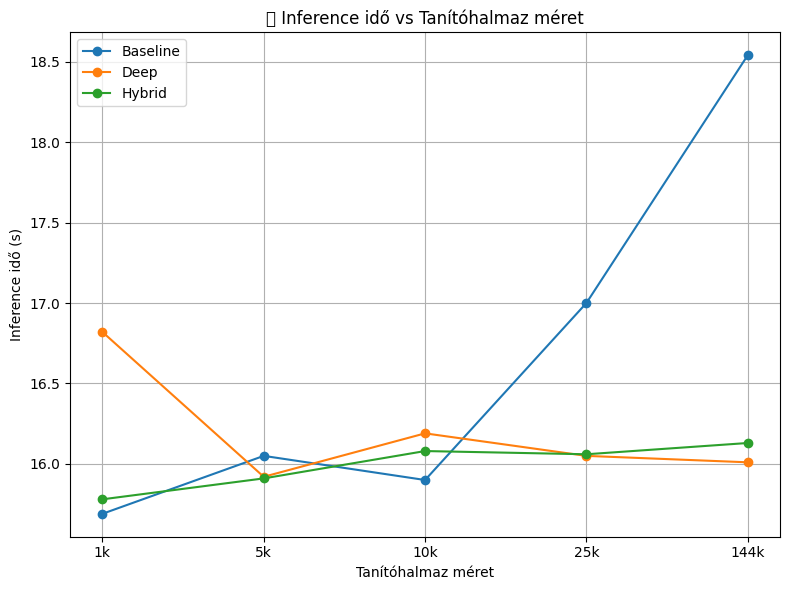

<ipython-input-175-67ff774c4cbf>:71: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


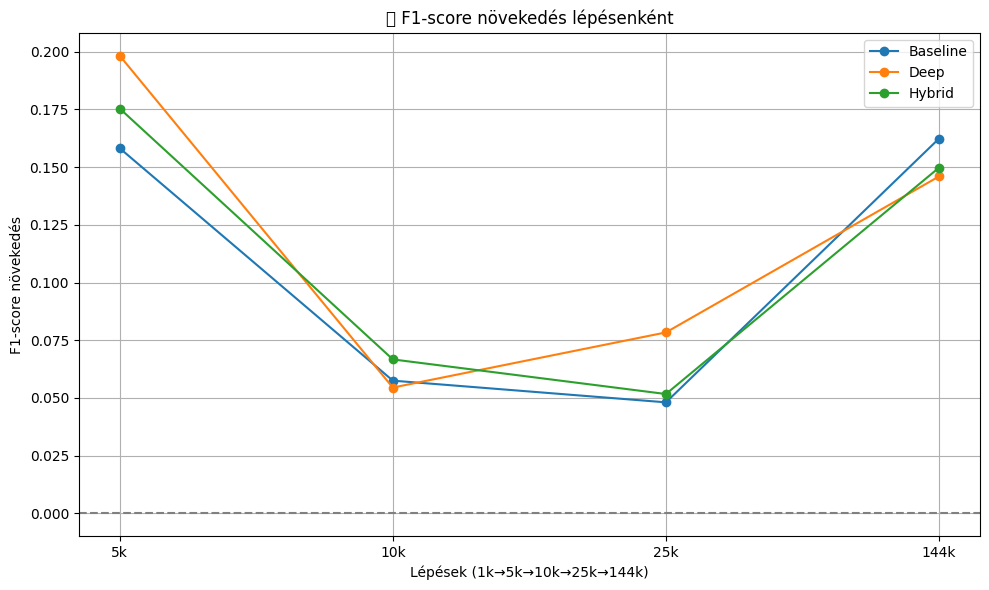

<ipython-input-175-67ff774c4cbf>:90: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


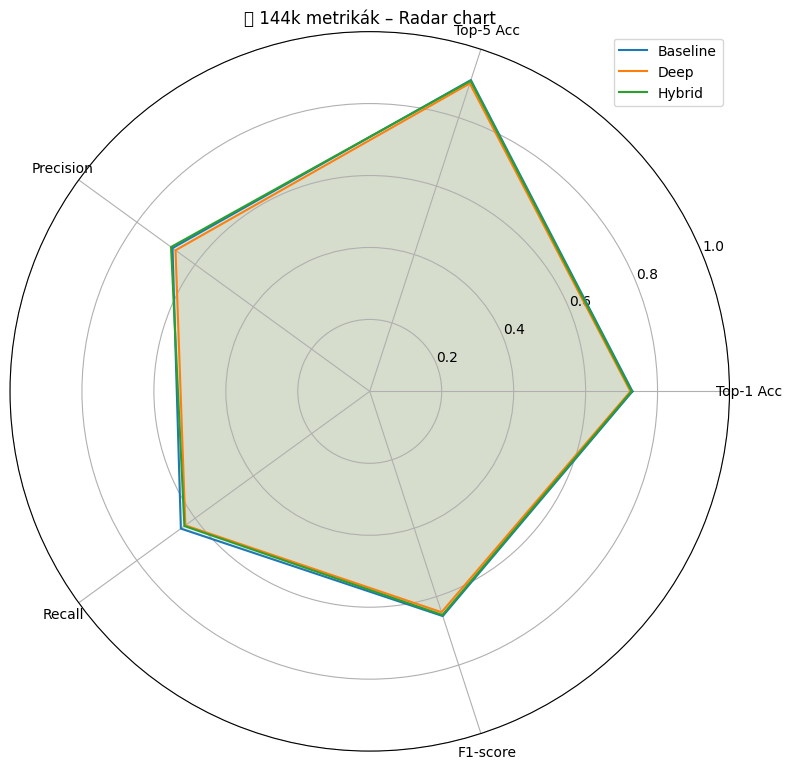

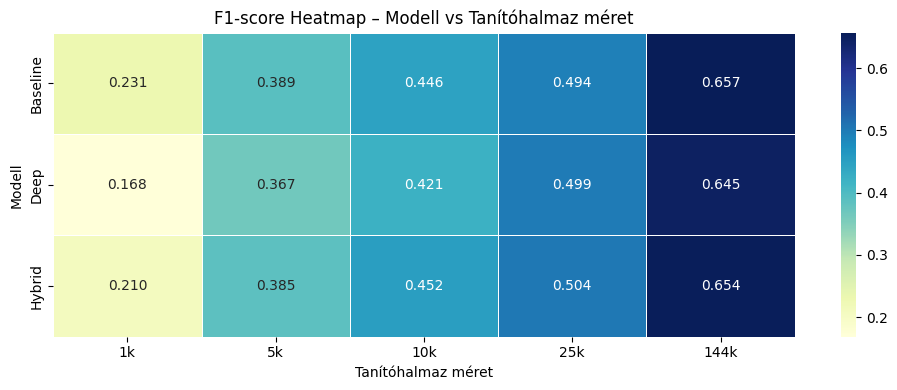

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

# --- Paraméterek ---
size_order = ["1k", "5k", "10k", "25k", "144k"]
model_order = ["Baseline", "Deep", "Hybrid"]
df_all["Train Size"] = pd.Categorical(df_all["Train Size"], categories=size_order, ordered=True)

# 1️⃣ F1-score / Top-1 / Top-5 Accuracy alakulása
plt.figure(figsize=(18, 5))
for i, metric in enumerate(["F1-score", "Top-1 Acc", "Top-5 Acc"]):
    plt.subplot(1, 3, i+1)
    for model in model_order:
        subset = df_all[df_all["Model"] == model]
        plt.plot(subset["Train Size"], subset[metric], marker="o", label=model)
    plt.title(f"{metric} vs Méret")
    plt.xlabel("Tanítóhalmaz méret")
    plt.ylabel(metric)
    plt.ylim(0, 1)
    plt.grid(True)
    if i == 0:
        plt.legend()
plt.tight_layout()
plt.show()

# 2️⃣ Precision vs Recall – oszlopdiagram modellenként
plt.figure(figsize=(10, 6))
width = 0.12
x = np.arange(len(size_order))
for i, model in enumerate(model_order):
    subset = df_all[df_all["Model"] == model].sort_values("Train Size")
    plt.bar(x + i*width, subset["Precision"], width=width, label=f"{model} – Precision", alpha=0.9)
    plt.bar(x + i*width, subset["Recall"], width=width, bottom=subset["Precision"], alpha=0.4, label=f"{model} – Recall")
plt.xticks(x + width, size_order)
plt.xlabel("Tanítóhalmaz méret")
plt.ylabel("Érték")
plt.title("🎯 Precision + Recall alakulása – Modell és méret szerint")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, axis="y")
plt.tight_layout()
plt.show()

# 3️⃣ Inference time összehasonlítás
plt.figure(figsize=(8, 6))
for model in model_order:
    subset = df_all[df_all["Model"] == model].sort_values("Train Size")
    plt.plot(subset["Train Size"], subset["Inference Time (s)"], marker="o", label=model)
plt.title("⏱️ Inference idő vs Tanítóhalmaz méret")
plt.xlabel("Tanítóhalmaz méret")
plt.ylabel("Inference idő (s)")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# 4️⃣ F1-score megtérülés (arányos növekedés)
plt.figure(figsize=(10, 6))
for model in model_order:
    subset = df_all[df_all["Model"] == model].sort_values("Train Size")
    f1_values = subset["F1-score"].values
    growth = [round(f1_values[i+1] - f1_values[i], 4) for i in range(len(f1_values)-1)]
    plt.plot(size_order[1:], growth, marker="o", label=model)
plt.title("📈 F1-score növekedés lépésenként")
plt.xlabel("Lépések (1k→5k→10k→25k→144k)")
plt.ylabel("F1-score növekedés")
plt.axhline(0, color='gray', linestyle='--')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# 5️⃣ Radar chart – 144k metrikák
labels = ["Top-1 Acc", "Top-5 Acc", "Precision", "Recall", "F1-score"]
angles = np.linspace(0, 2 * np.pi, len(labels), endpoint=False).tolist()
angles += angles[:1]
plt.figure(figsize=(8, 8))
ax = plt.subplot(111, polar=True)
for model in model_order:
    subset = df_all[(df_all["Model"] == model) & (df_all["Train Size"] == "144k")]
    values = subset[labels].values.flatten().tolist()
    values += values[:1]
    ax.plot(angles, values, label=model)
    ax.fill(angles, values, alpha=0.1)
ax.set_thetagrids(np.degrees(angles[:-1]), labels)
ax.set_title("📊 144k metrikák – Radar chart")
ax.set_ylim(0, 1)
ax.legend(loc="upper right")
plt.tight_layout()
plt.show()

# 6️⃣ Heatmap: F1-score – modell vs méret
pivot = df_all.pivot(index="Model", columns="Train Size", values="F1-score").loc[model_order, size_order]
plt.figure(figsize=(10, 4))
sns.heatmap(pivot, annot=True, cmap="YlGnBu", fmt=".3f", linewidths=0.5)
plt.title("F1-score Heatmap – Modell vs Tanítóhalmaz méret")
plt.xlabel("Tanítóhalmaz méret")
plt.ylabel("Modell")
plt.tight_layout()
plt.show()
